In [1]:
import numpy as np 
import mdtraj as md
from molecular_mpns.config import data_dir, fig_dir
from molecular_mpns.vae import VAE, VAEloss
from molecular_mpns.data import AlanineDipeptideGraph
from torch_geometric.data import DataLoader
from molecular_mpns.training_utils import *
import torch
import matplotlib.pyplot as plt
import seaborn as sns
from torch.optim.lr_scheduler import ExponentialLR
import os

In [2]:
# load training trajectory
os.chdir(data_dir)
os.chdir('alanine_dipeptide/')
xtc_file = 'alanine-dipeptide-0-250ns-nowater.xtc'
top_file = 'alanine-dipeptide-nowater.pdb'
traj = md.load(xtc_file,top=top_file)

In [3]:
# create graphs
z = [atom.element.atomic_number for atom in traj.topology.atoms]
G = [AlanineDipeptideGraph(z = torch.tensor(z).long(),pos = torch.tensor(xyz)) for xyz in traj.xyz]

In [4]:
# build model
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

num_spherical, num_radial, hidden_channels, num_bilinear, out_channels, num_layers, cutoff= 16, 6, 128, 4, 64, 2, 0.5
mod = VAE(num_spherical, num_radial, hidden_channels, num_bilinear, out_channels, num_layers, cutoff)
mod = mod.to(device)

opt = torch.optim.Adam(mod.parameters(),lr = 1e-3, weight_decay = 1e-5)
sched = ExponentialLR(opt, gamma = 0.995)

Epoch 1 Loss: 8946.39217376709


<ipython-input-5-8b6f36debf4b>:41: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  x0 = torch.tensor(train[0].pos)


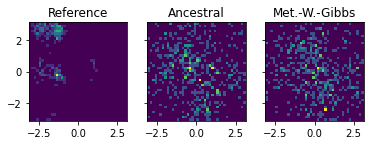

Epoch 2 Loss: 793.9535102844238


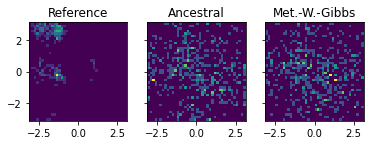

Epoch 3 Loss: 260.8169860839844


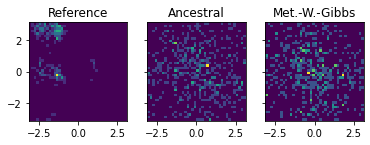

Epoch 4 Loss: 36.69131374359131


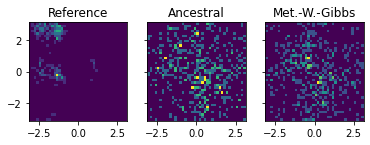

Epoch 5 Loss: -100.47938442230225


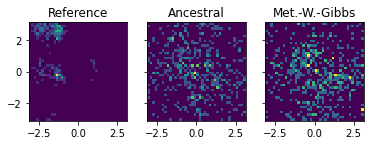

Epoch 6 Loss: -175.94575309753418


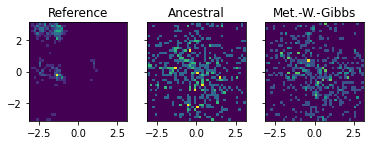

Epoch 7 Loss: -250.16051864624023


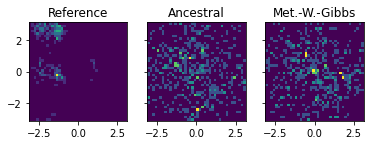

Epoch 8 Loss: -316.56806564331055


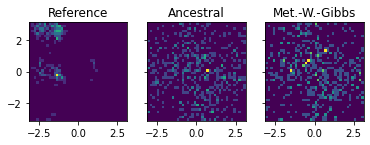

Epoch 9 Loss: -378.1379585266113


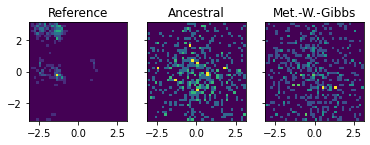

Epoch 10 Loss: -438.71773529052734


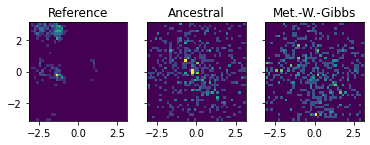

Epoch 11 Loss: -501.7387275695801


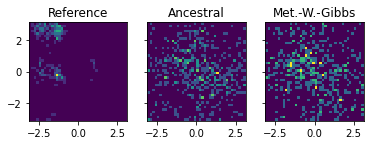

Epoch 12 Loss: -561.2868804931641


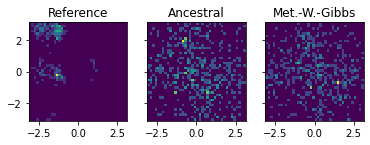

Epoch 13 Loss: -623.3100814819336


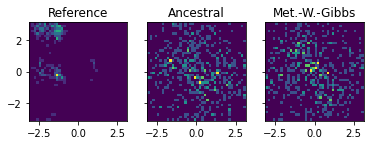

Epoch 14 Loss: -685.4744415283203


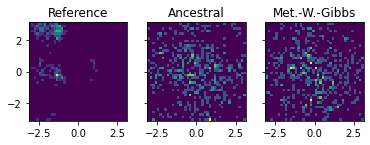

Epoch 15 Loss: -748.0143814086914


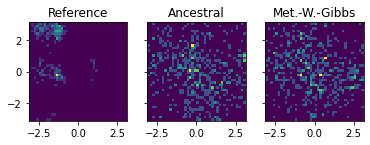

Epoch 16 Loss: -809.4955291748047


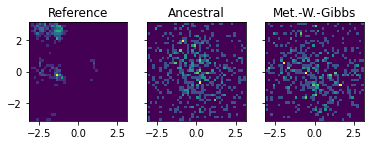

Epoch 17 Loss: -871.1077499389648


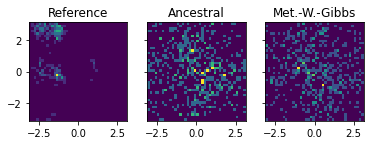

Epoch 18 Loss: -931.3905639648438


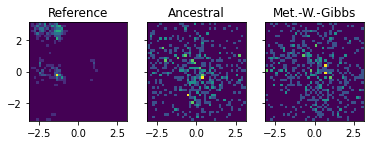

Epoch 19 Loss: -994.4918823242188


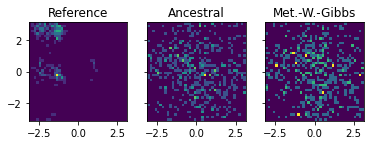

Epoch 20 Loss: -1057.4053573608398


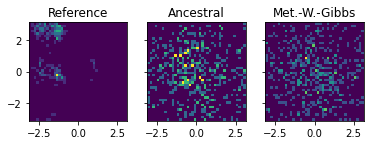

Epoch 21 Loss: -1118.5884399414062


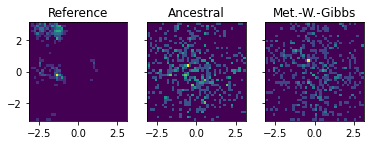

Epoch 22 Loss: -1183.5619659423828


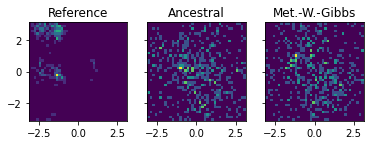

Epoch 23 Loss: -1242.8031311035156


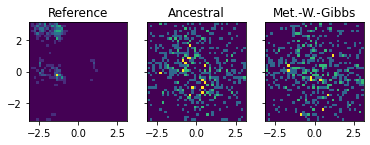

Epoch 24 Loss: -1305.0508880615234


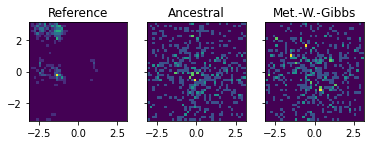

Epoch 25 Loss: -1370.3075256347656


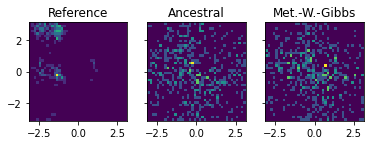

Epoch 26 Loss: -1434.3854675292969


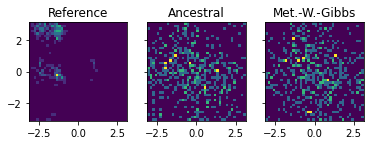

Epoch 27 Loss: -1498.545181274414


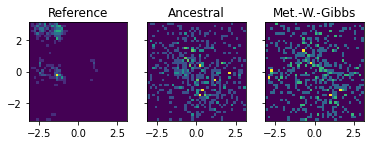

Epoch 28 Loss: -1562.2983703613281


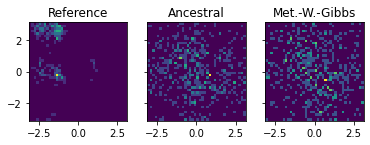

Epoch 29 Loss: -1627.0036315917969


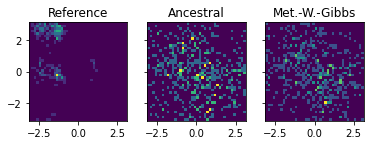

Epoch 30 Loss: -1689.6714172363281


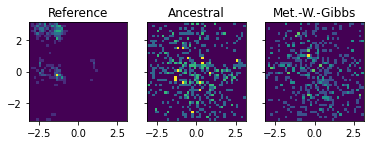

Epoch 31 Loss: -1751.1744842529297


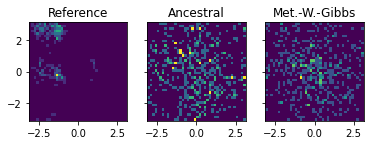

Epoch 32 Loss: -1815.6387481689453


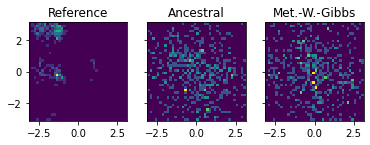

Epoch 33 Loss: -1879.2356262207031


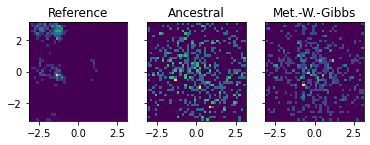

Epoch 34 Loss: -1942.7931671142578


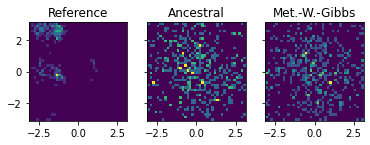

Epoch 35 Loss: -2007.8988342285156


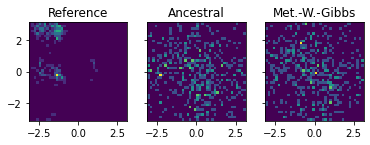

Epoch 36 Loss: -2071.100067138672


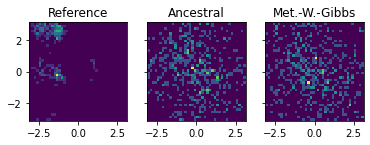

Epoch 37 Loss: -2134.7444610595703


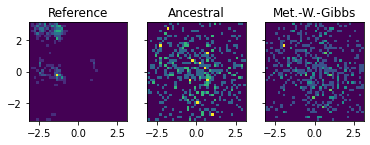

Epoch 38 Loss: -2197.967071533203


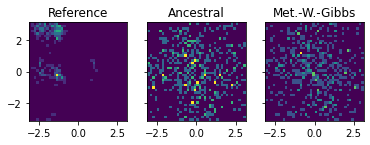

Epoch 39 Loss: -2258.720489501953


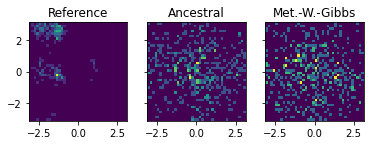

Epoch 40 Loss: -2323.888900756836


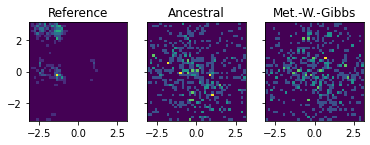

Epoch 41 Loss: -2389.4044342041016


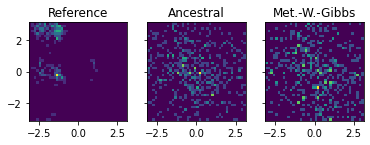

Epoch 42 Loss: -2454.1241149902344


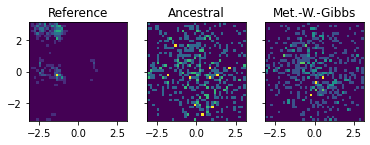

Epoch 43 Loss: -2514.5955200195312


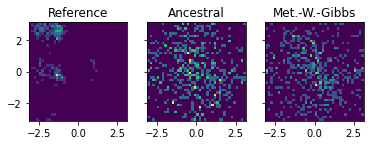

Epoch 44 Loss: -2578.3697509765625


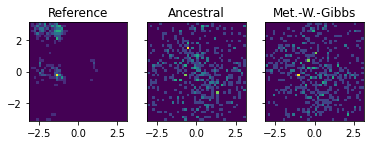

Epoch 45 Loss: -2645.2076721191406


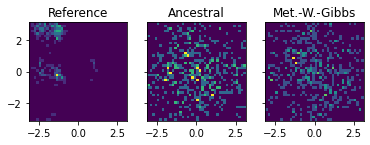

Epoch 46 Loss: -2709.9984436035156


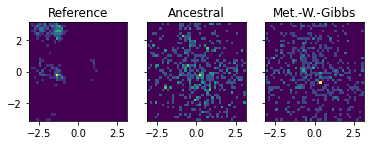

Epoch 47 Loss: -2773.451629638672


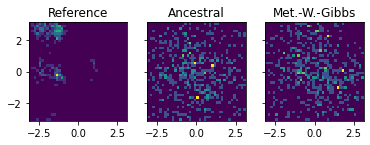

Epoch 48 Loss: -2833.377471923828


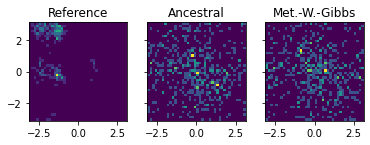

Epoch 49 Loss: -2896.589141845703


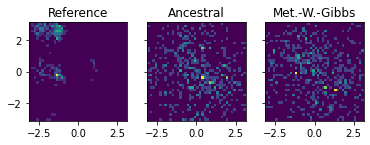

Epoch 50 Loss: -2960.894775390625


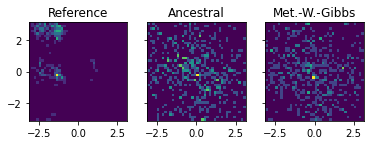

Epoch 51 Loss: -3024.3148498535156


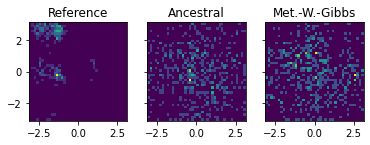

Epoch 52 Loss: -3092.7032470703125


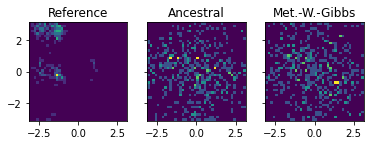

Epoch 53 Loss: -3151.914093017578


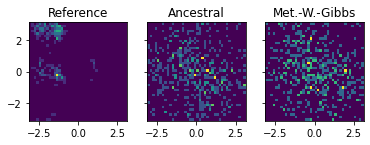

Epoch 54 Loss: -3209.83544921875


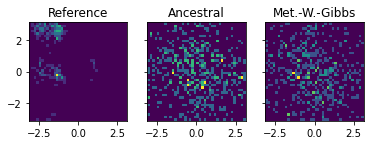

Epoch 55 Loss: -3274.234832763672


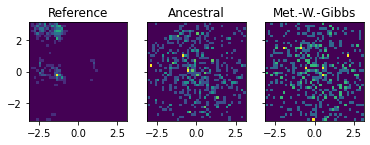

Epoch 56 Loss: -3345.6485290527344


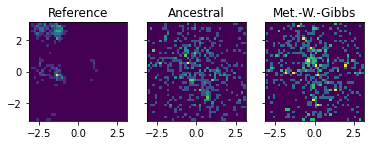

Epoch 57 Loss: -3411.64501953125


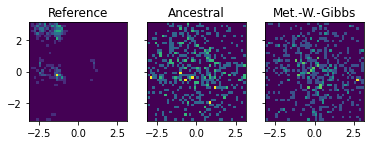

Epoch 58 Loss: -3470.1551513671875


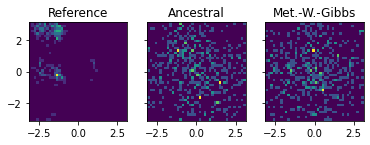

Epoch 59 Loss: -3537.308807373047


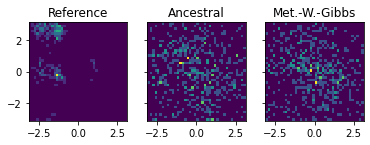

Epoch 60 Loss: -3605.2701416015625


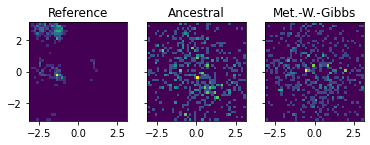

Epoch 61 Loss: -3670.020751953125


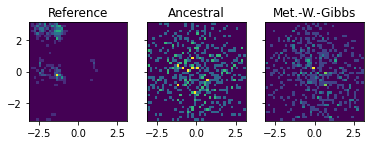

Epoch 62 Loss: -3731.610107421875


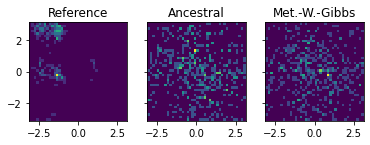

Epoch 63 Loss: -3796.6702880859375


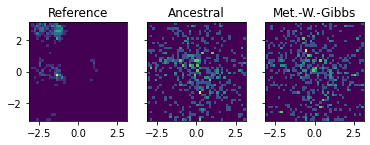

Epoch 64 Loss: -3857.2415161132812


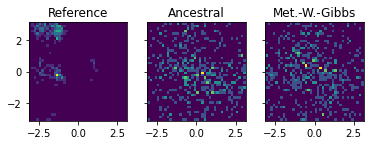

Epoch 65 Loss: -3916.7117919921875


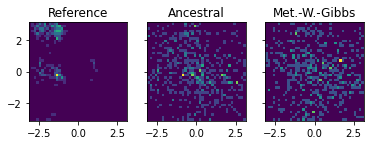

Epoch 66 Loss: -3987.5357055664062


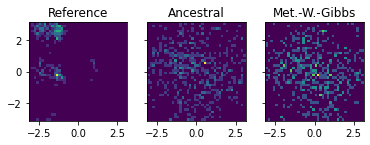

Epoch 67 Loss: -4053.3956298828125


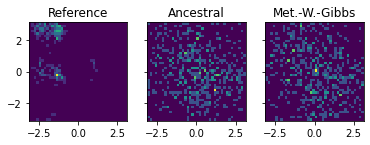

Epoch 68 Loss: -4116.7537841796875


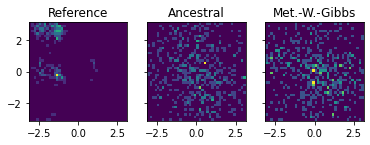

Epoch 69 Loss: -4183.128601074219


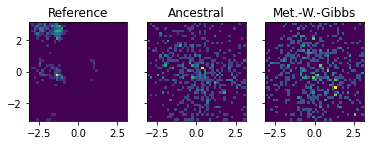

Epoch 70 Loss: -4244.515045166016


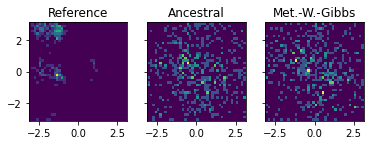

Epoch 71 Loss: -4298.665710449219


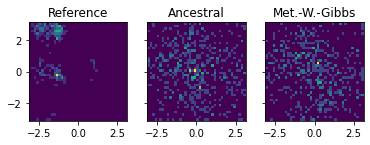

Epoch 72 Loss: -4367.840393066406


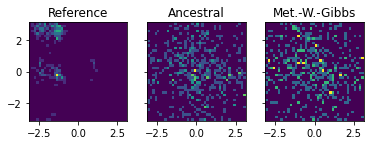

Epoch 73 Loss: -4435.696990966797


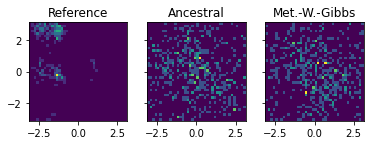

Epoch 74 Loss: -4501.375244140625


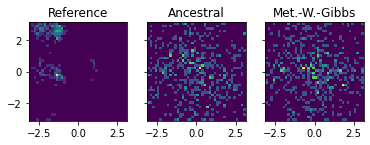

Epoch 75 Loss: -4562.622985839844


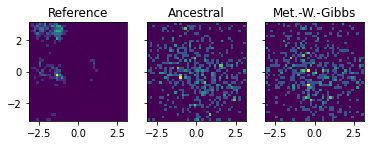

Epoch 76 Loss: -4629.558990478516


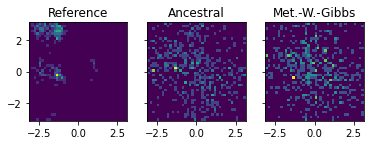

Epoch 77 Loss: -4695.345703125


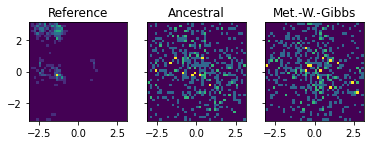

Epoch 78 Loss: -4761.570648193359


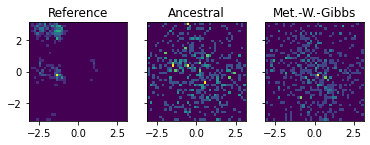

Epoch 79 Loss: -4819.876007080078


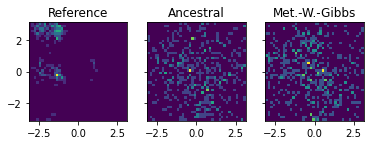

Epoch 80 Loss: -4884.5137939453125


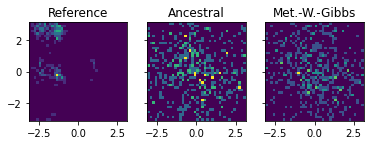

Epoch 81 Loss: -4953.996337890625


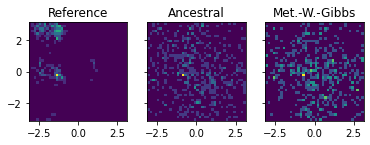

Epoch 82 Loss: -5020.619445800781


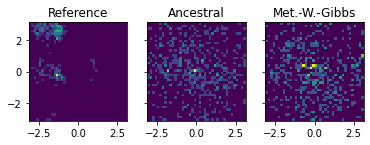

Epoch 83 Loss: -5077.548645019531


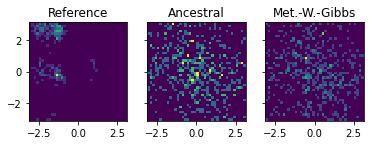

Epoch 84 Loss: -5148.6162109375


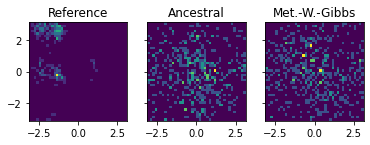

Epoch 85 Loss: -5205.889221191406


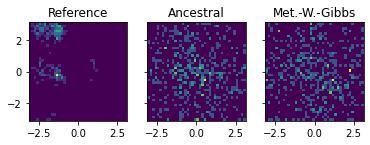

Epoch 86 Loss: -5270.19775390625


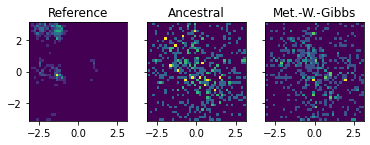

Epoch 87 Loss: -5331.3489990234375


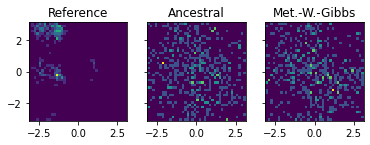

Epoch 88 Loss: -5401.8331298828125


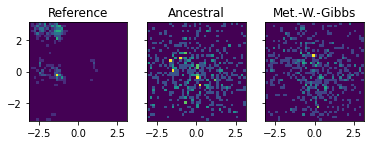

Epoch 89 Loss: -5469.237121582031


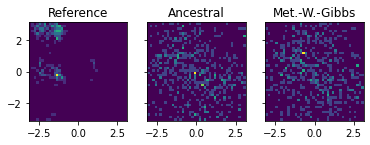

Epoch 90 Loss: -5530.244323730469


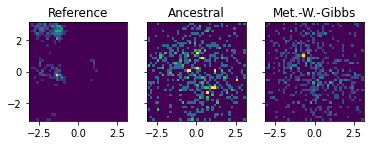

Epoch 91 Loss: -5597.656494140625


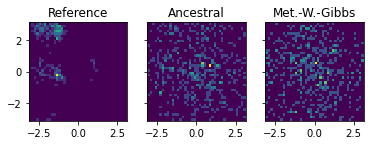

Epoch 92 Loss: -5660.031005859375


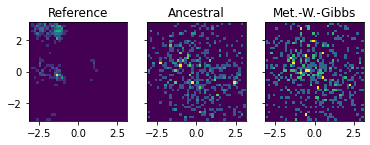

Epoch 93 Loss: -5723.540222167969


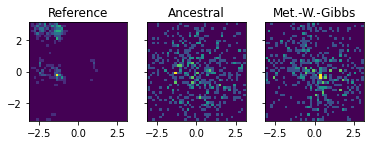

Epoch 94 Loss: -5788.4376220703125


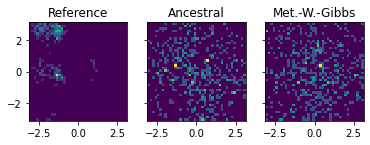

Epoch 95 Loss: -5847.5159912109375


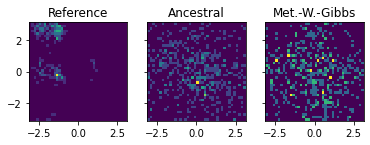

Epoch 96 Loss: -5914.808532714844


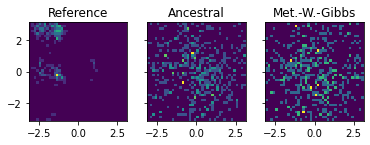

Epoch 97 Loss: -5981.342041015625


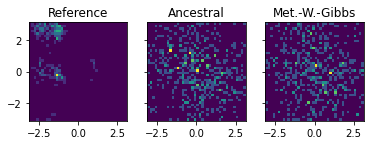

Epoch 98 Loss: -6047.528869628906


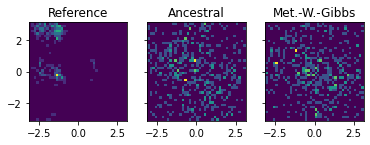

Epoch 99 Loss: -6108.6221923828125


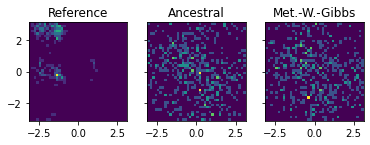

Epoch 100 Loss: -6178.3358154296875


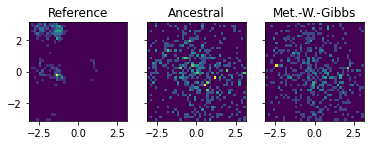

Epoch 101 Loss: -6241.743225097656


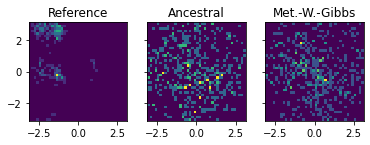

Epoch 102 Loss: -6304.599548339844


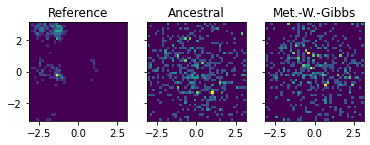

Epoch 103 Loss: -6367.1298828125


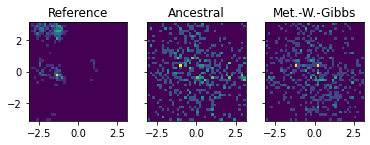

Epoch 104 Loss: -6434.421569824219


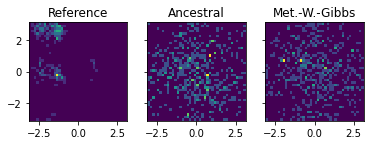

Epoch 105 Loss: -6500.0167236328125


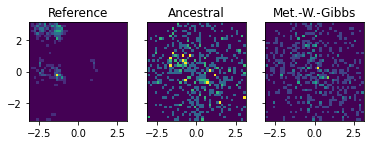

Epoch 106 Loss: -6561.934997558594


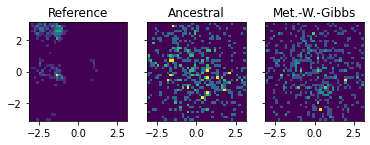

Epoch 107 Loss: -6626.790466308594


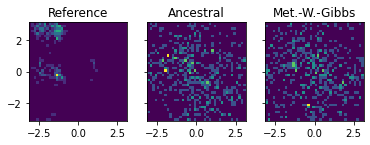

Epoch 108 Loss: -6685.8321533203125


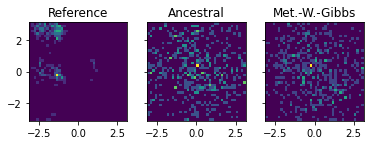

Epoch 109 Loss: -6754.586486816406


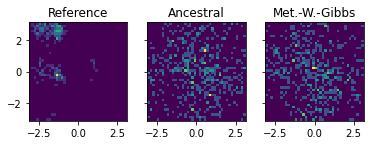

Epoch 110 Loss: -6820.762451171875


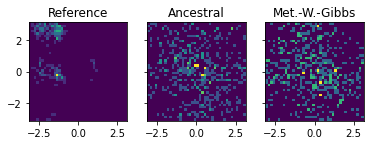

Epoch 111 Loss: -6884.270446777344


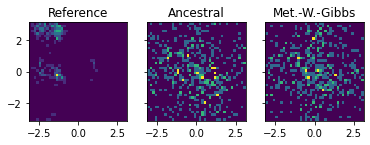

Epoch 112 Loss: -6950.0810546875


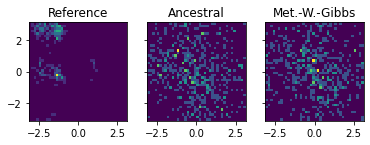

Epoch 113 Loss: -7012.8629150390625


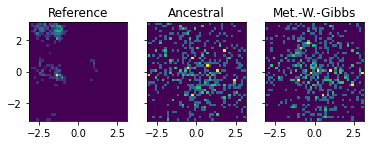

Epoch 114 Loss: -7074.4361572265625


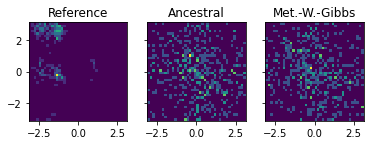

Epoch 115 Loss: -7138.63330078125


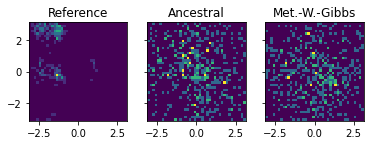

Epoch 116 Loss: -7203.539611816406


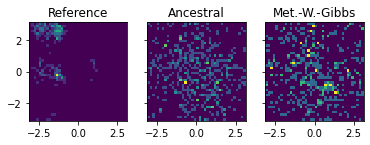

Epoch 117 Loss: -7270.365478515625


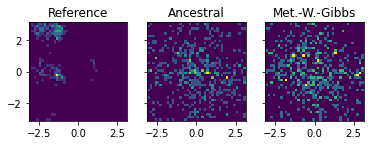

Epoch 118 Loss: -7335.570617675781


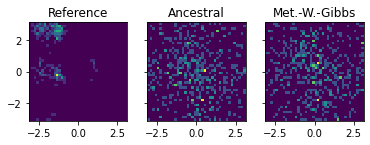

Epoch 119 Loss: -7403.691467285156


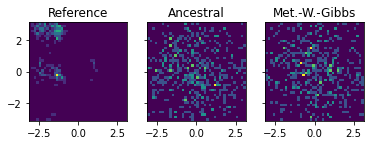

Epoch 120 Loss: -7465.4967041015625


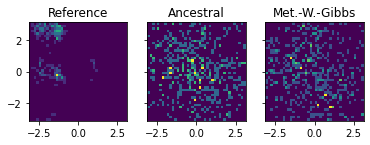

Epoch 121 Loss: -7526.935791015625


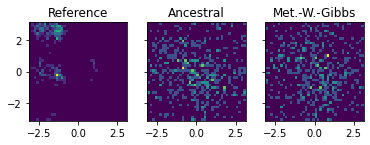

Epoch 122 Loss: -7588.627502441406


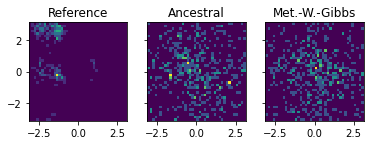

Epoch 123 Loss: -7653.0447998046875


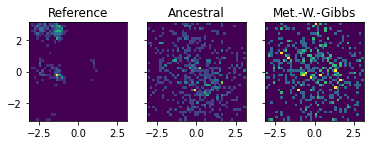

Epoch 124 Loss: -7717.74267578125


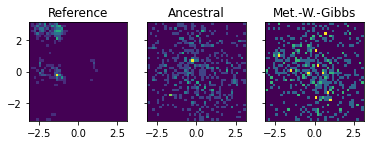

Epoch 125 Loss: -7781.34375


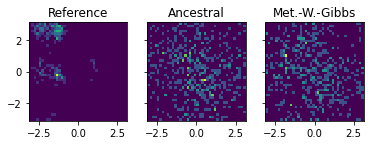

Epoch 126 Loss: -7850.793395996094


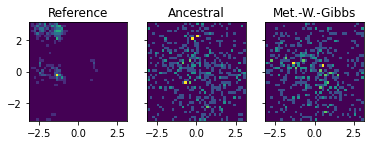

Epoch 127 Loss: -7913.969421386719


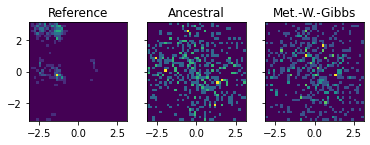

Epoch 128 Loss: -7976.603332519531


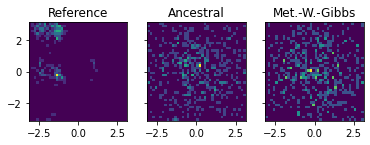

Epoch 129 Loss: -8042.788818359375


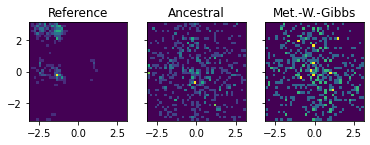

Epoch 130 Loss: -8111.743408203125


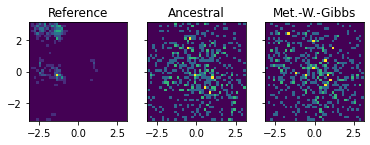

Epoch 131 Loss: -8172.337890625


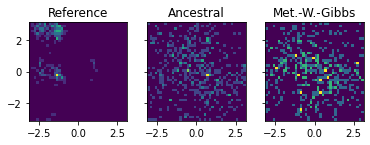

Epoch 132 Loss: -8234.310913085938


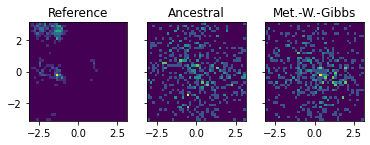

Epoch 133 Loss: -8296.837463378906


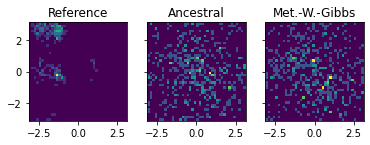

Epoch 134 Loss: -8364.514892578125


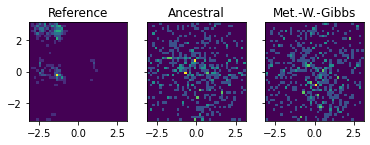

Epoch 135 Loss: -8408.26220703125


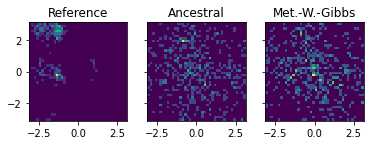

Epoch 136 Loss: -8444.351501464844


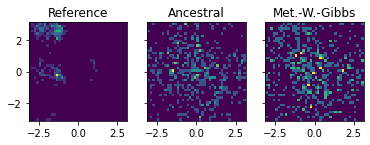

Epoch 137 Loss: -8531.616088867188


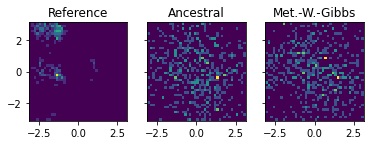

Epoch 138 Loss: -8599.148193359375


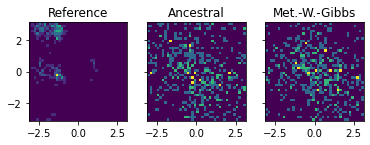

Epoch 139 Loss: -8672.272155761719


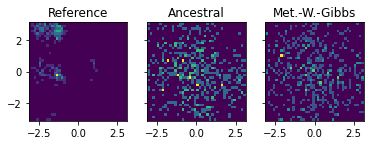

Epoch 140 Loss: -8739.090270996094


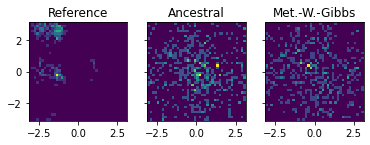

Epoch 141 Loss: -8808.046997070312


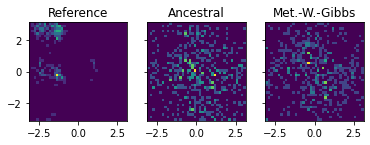

Epoch 142 Loss: -8871.210266113281


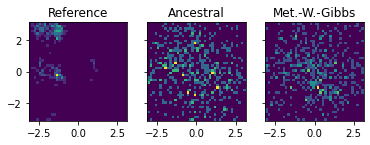

Epoch 143 Loss: -8928.333435058594


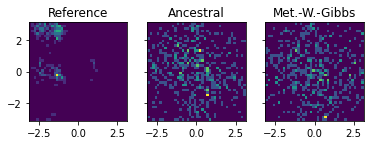

Epoch 144 Loss: -8993.796569824219


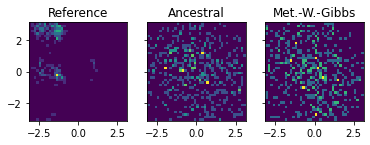

Epoch 145 Loss: -9061.126892089844


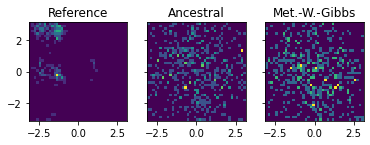

Epoch 146 Loss: -9122.132385253906


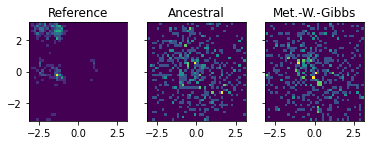

Epoch 147 Loss: -9191.005737304688


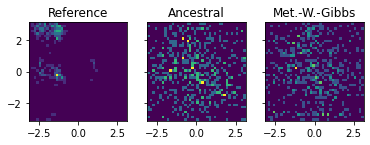

Epoch 148 Loss: -9252.171081542969


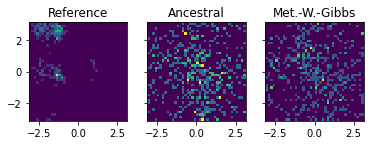

Epoch 149 Loss: -9316.285339355469


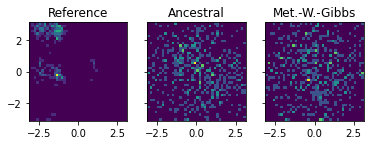

Epoch 150 Loss: -9381.300720214844


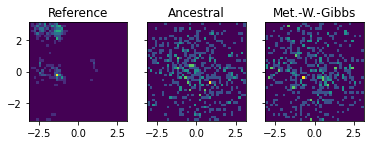

Epoch 151 Loss: -9447.722473144531


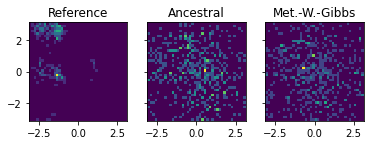

Epoch 152 Loss: -9512.577392578125


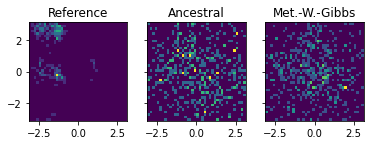

Epoch 153 Loss: -9568.827453613281


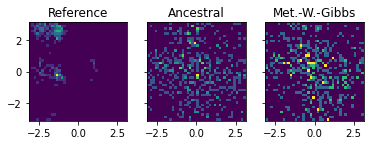

Epoch 154 Loss: -9630.299072265625


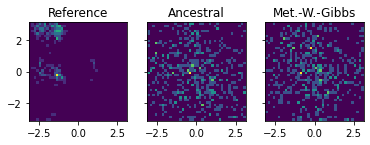

Epoch 155 Loss: -9700.092834472656


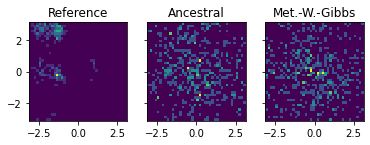

Epoch 156 Loss: -9764.428405761719


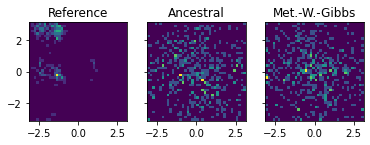

Epoch 157 Loss: -9819.973327636719


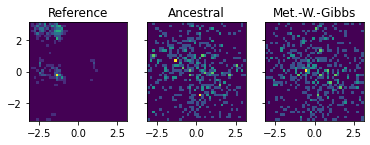

Epoch 158 Loss: -9875.212890625


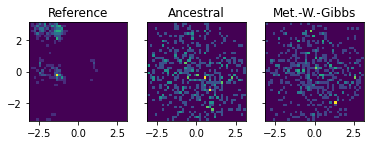

Epoch 159 Loss: -9941.121215820312


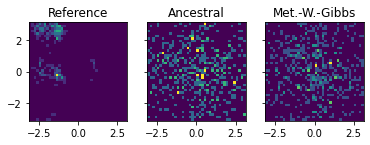

Epoch 160 Loss: -10012.35546875


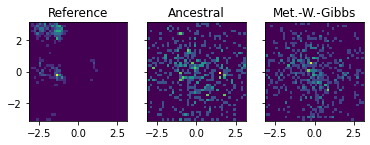

Epoch 161 Loss: -10072.659301757812


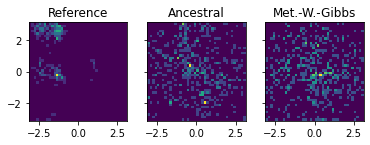

Epoch 162 Loss: -10145.615356445312


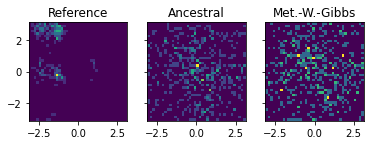

Epoch 163 Loss: -10206.5888671875


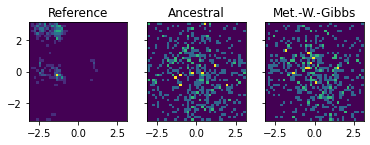

Epoch 164 Loss: -10268.112182617188


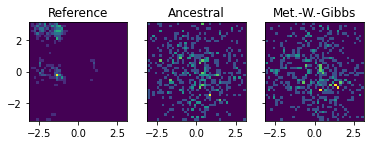

Epoch 165 Loss: -10340.703247070312


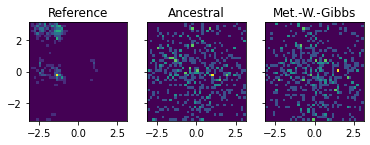

Epoch 166 Loss: -10396.4951171875


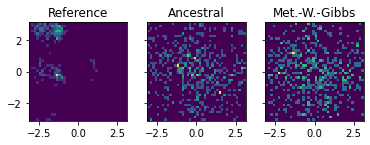

Epoch 167 Loss: -10469.80126953125


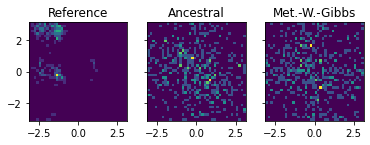

Epoch 168 Loss: -10538.818481445312


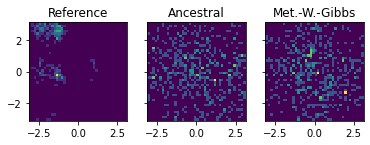

Epoch 169 Loss: -10592.69189453125


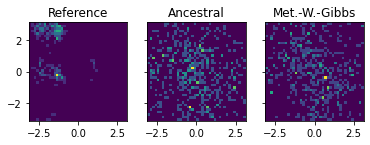

Epoch 170 Loss: -10648.921142578125


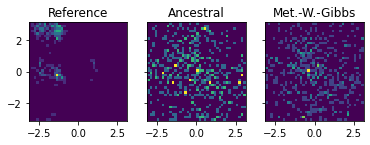

Epoch 171 Loss: -10713.080932617188


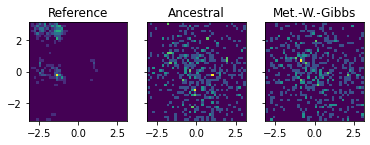

Epoch 172 Loss: -10778.483276367188


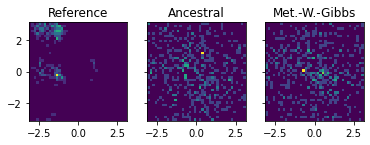

Epoch 173 Loss: -10839.816040039062


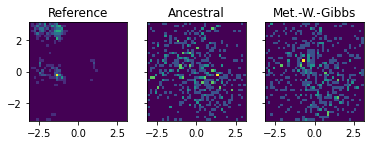

Epoch 174 Loss: -10894.233764648438


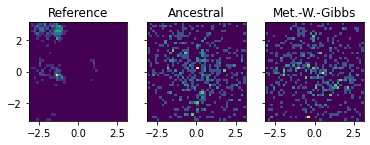

Epoch 175 Loss: -10972.154541015625


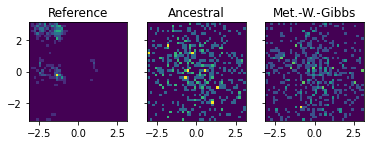

Epoch 176 Loss: -11016.9765625


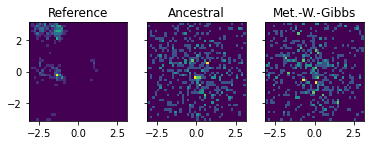

Epoch 177 Loss: -11088.270874023438


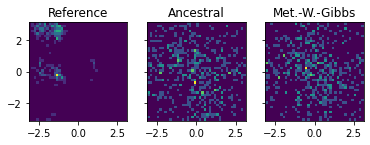

Epoch 178 Loss: -11157.423461914062


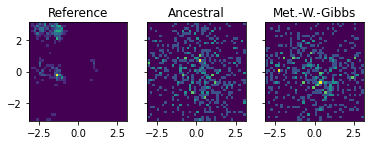

Epoch 179 Loss: -11228.005493164062


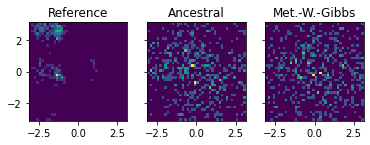

Epoch 180 Loss: -11289.682861328125


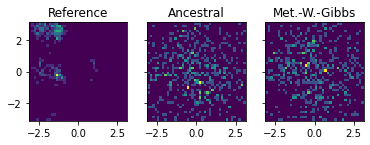

Epoch 181 Loss: -11348.993530273438


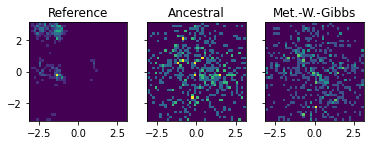

Epoch 182 Loss: -11415.999389648438


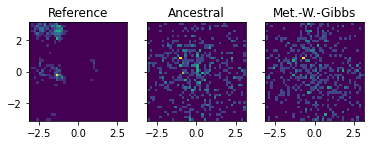

Epoch 183 Loss: -11455.785766601562


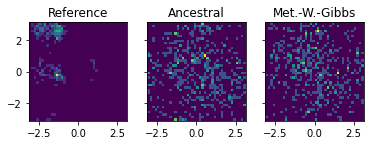

Epoch 184 Loss: -11544.216796875


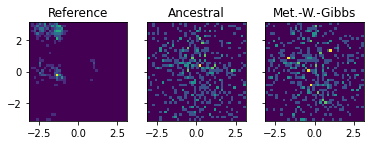

Epoch 185 Loss: -11609.235107421875


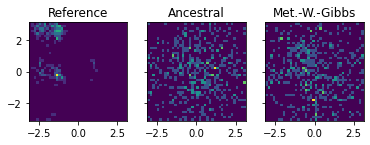

Epoch 186 Loss: -11670.815551757812


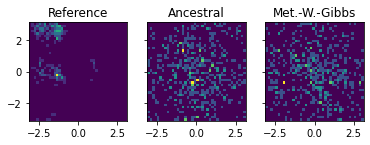

Epoch 187 Loss: -11744.675170898438


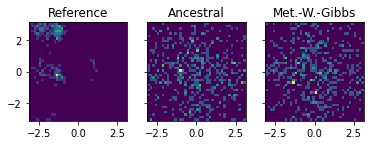

Epoch 188 Loss: -11805.622436523438


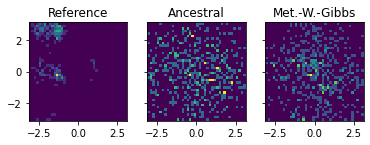

Epoch 189 Loss: -11866.310424804688


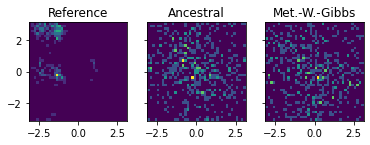

Epoch 190 Loss: -11927.846435546875


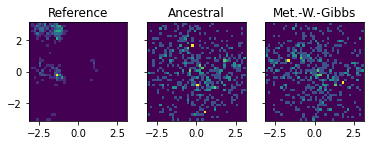

Epoch 191 Loss: -11989.688720703125


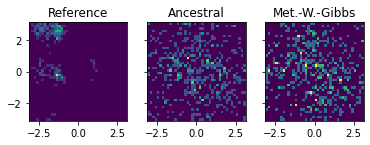

Epoch 192 Loss: -12052.31201171875


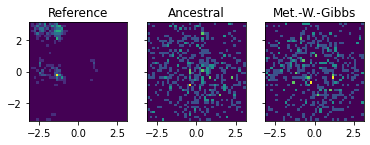

Epoch 193 Loss: -12110.1376953125


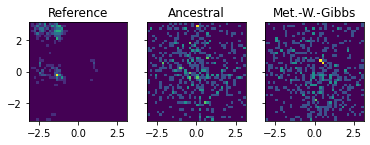

Epoch 194 Loss: -12173.314697265625


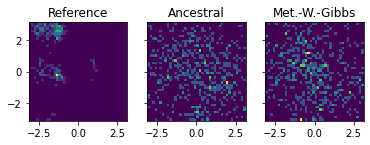

Epoch 195 Loss: -12225.556030273438


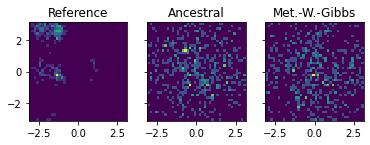

Epoch 196 Loss: -12290.124389648438


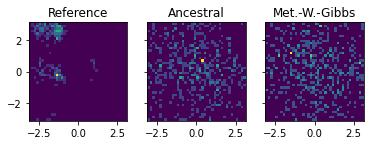

Epoch 197 Loss: -12355.378662109375


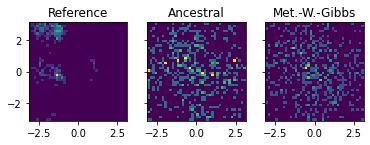

Epoch 198 Loss: -12436.009521484375


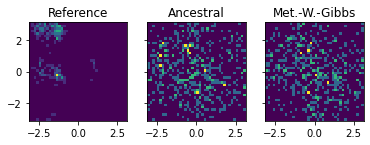

Epoch 199 Loss: -12501.709228515625


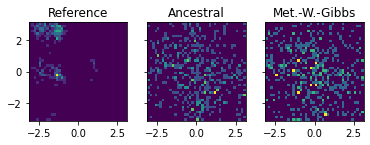

Epoch 200 Loss: -12550.83154296875


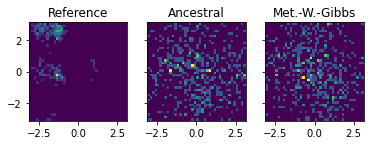

Epoch 201 Loss: -12602.681274414062


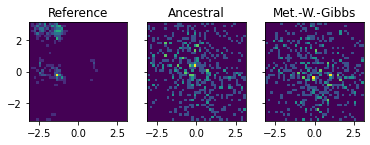

Epoch 202 Loss: -12680.8779296875


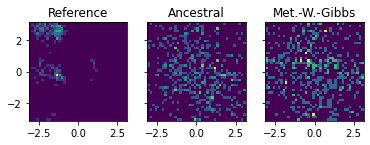

Epoch 203 Loss: -12747.581420898438


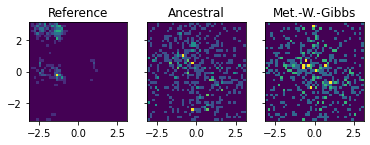

Epoch 204 Loss: -12815.685913085938


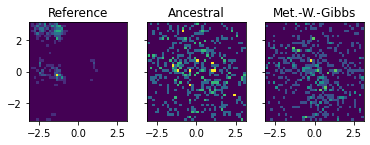

Epoch 205 Loss: -12862.4921875


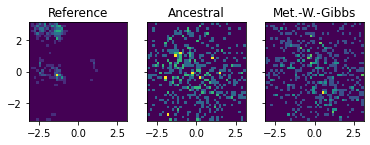

Epoch 206 Loss: -12932.806640625


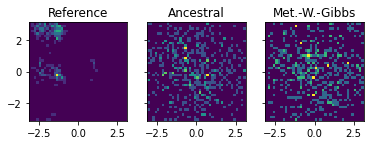

Epoch 207 Loss: -13004.892333984375


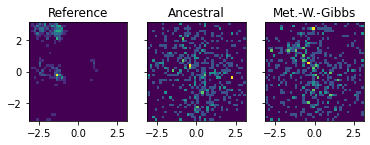

Epoch 208 Loss: -13061.76025390625


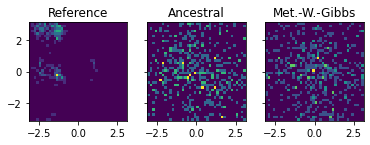

Epoch 209 Loss: -13136.365478515625


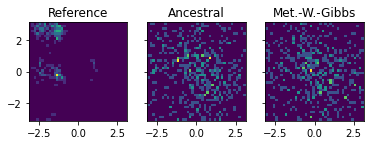

Epoch 210 Loss: -13190.05224609375


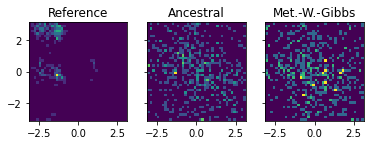

Epoch 211 Loss: -13243.324584960938


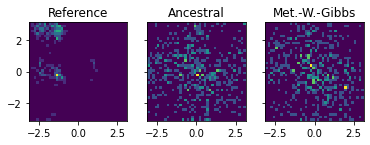

Epoch 212 Loss: -13299.663818359375


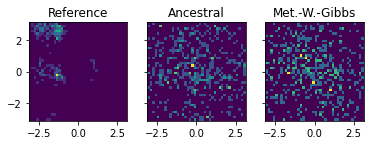

Epoch 213 Loss: -13361.207763671875


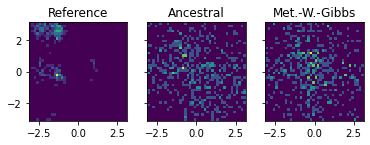

Epoch 214 Loss: -13434.936767578125


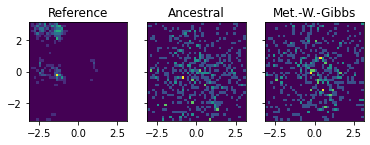

Epoch 215 Loss: -13504.145263671875


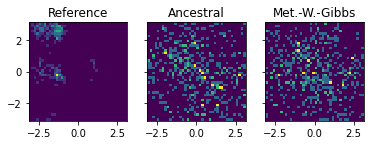

Epoch 216 Loss: -13554.741943359375


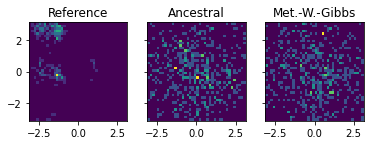

Epoch 217 Loss: -13621.902954101562


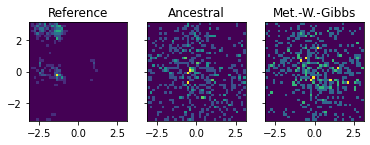

Epoch 218 Loss: -13699.199096679688


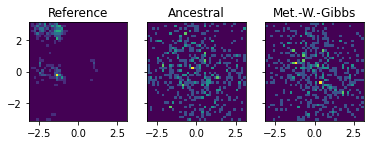

Epoch 219 Loss: -13751.819946289062


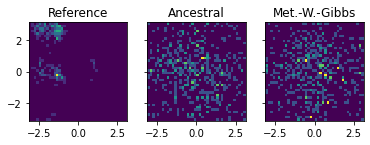

Epoch 220 Loss: -13759.502685546875


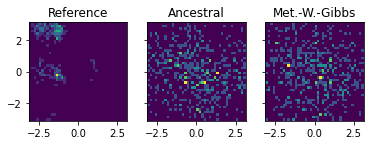

Epoch 221 Loss: -13837.5947265625


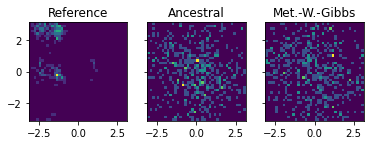

Epoch 222 Loss: -13911.824096679688


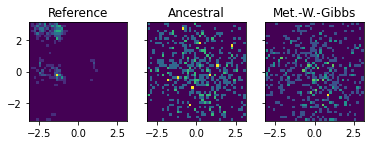

Epoch 223 Loss: -13979.814208984375


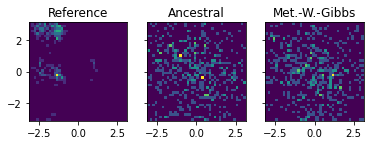

Epoch 224 Loss: -14043.59228515625


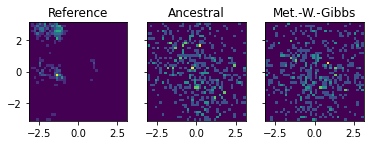

Epoch 225 Loss: -14100.879638671875


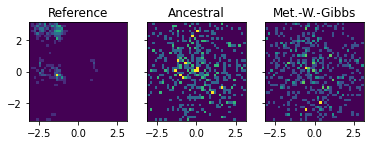

Epoch 226 Loss: -14177.523803710938


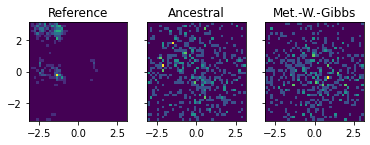

Epoch 227 Loss: -14241.296142578125


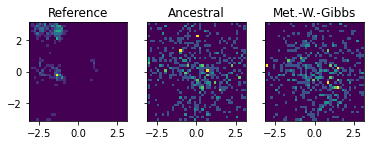

Epoch 228 Loss: -14281.166625976562


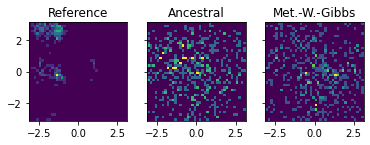

Epoch 229 Loss: -14357.253295898438


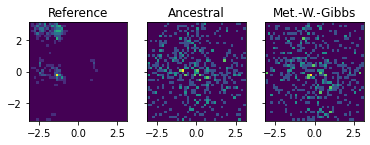

Epoch 230 Loss: -14438.57763671875


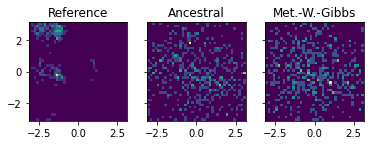

Epoch 231 Loss: -14478.237915039062


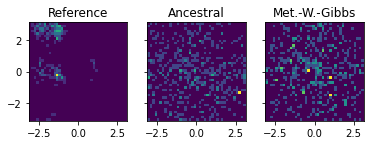

Epoch 232 Loss: -14548.587646484375


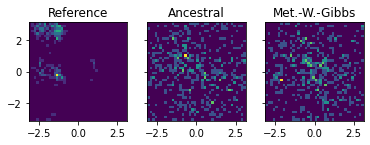

Epoch 233 Loss: -14626.617065429688


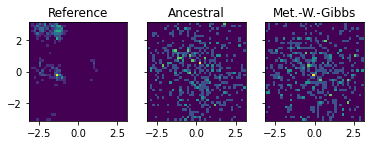

Epoch 234 Loss: -14691.60546875


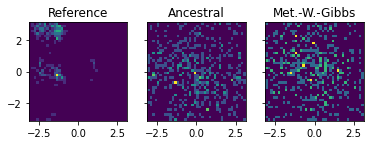

Epoch 235 Loss: -14752.715087890625


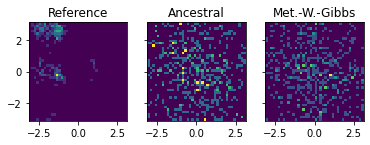

Epoch 236 Loss: -14812.32421875


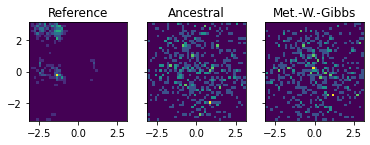

Epoch 237 Loss: -14873.056762695312


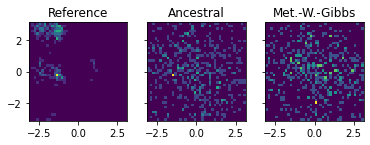

Epoch 238 Loss: -14934.826904296875


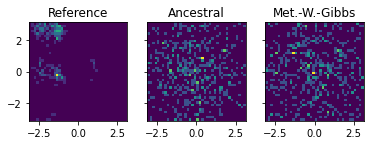

Epoch 239 Loss: -14994.246337890625


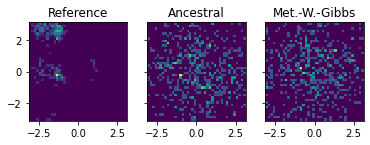

Epoch 240 Loss: -15062.021728515625


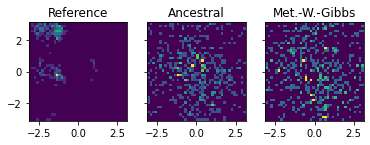

Epoch 241 Loss: -15126.8583984375


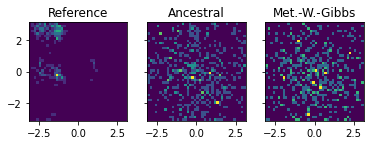

Epoch 242 Loss: -15185.911743164062


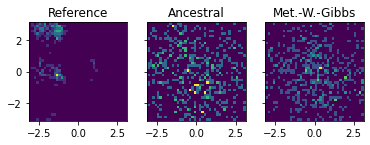

Epoch 243 Loss: -15261.722900390625


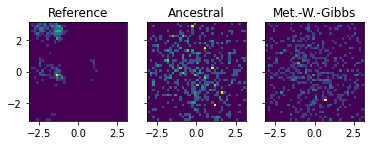

Epoch 244 Loss: -15315.621704101562


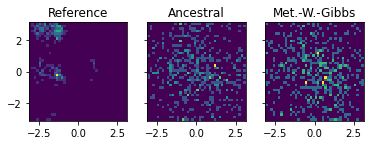

Epoch 245 Loss: -15355.08349609375


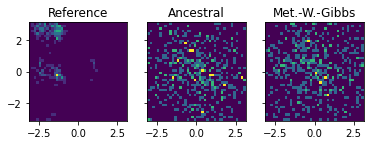

Epoch 246 Loss: -15416.687255859375


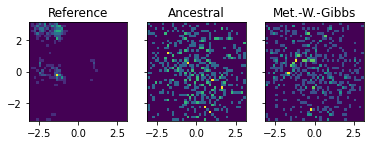

Epoch 247 Loss: -15455.285278320312


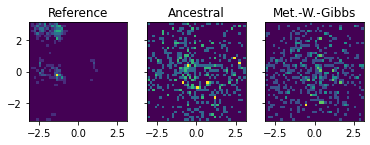

Epoch 248 Loss: -15545.69677734375


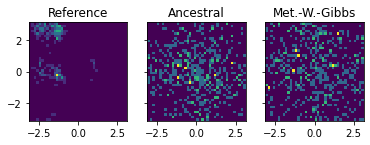

Epoch 249 Loss: -15614.226928710938


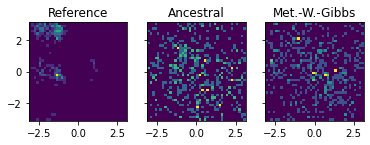

Epoch 250 Loss: -15689.319580078125


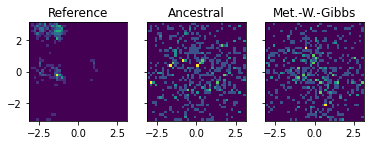

Epoch 251 Loss: -15752.832397460938


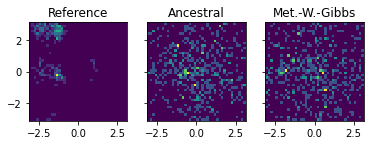

Epoch 252 Loss: -15814.062133789062


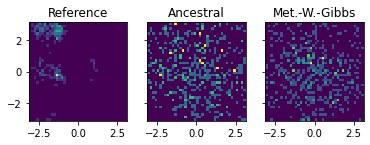

Epoch 253 Loss: -15879.62646484375


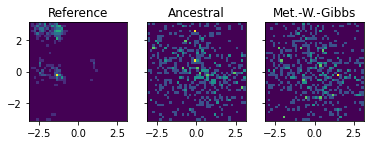

Epoch 254 Loss: -15946.682983398438


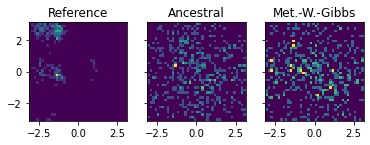

Epoch 255 Loss: -15991.842651367188


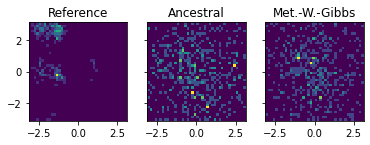

Epoch 256 Loss: -16054.374877929688


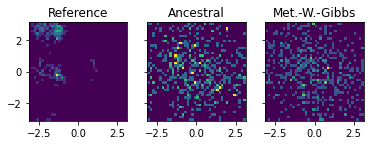

Epoch 257 Loss: -16119.901123046875


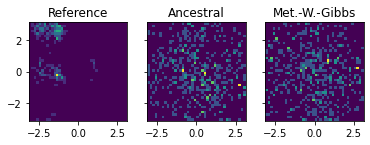

Epoch 258 Loss: -16172.478149414062


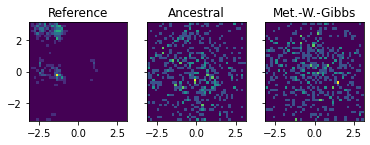

Epoch 259 Loss: -16217.735595703125


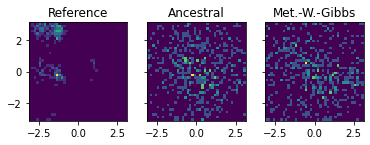

Epoch 260 Loss: -16303.476440429688


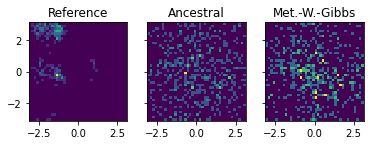

Epoch 261 Loss: -16357.252319335938


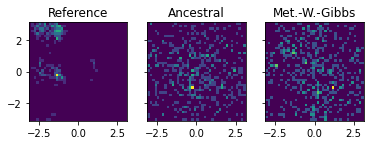

Epoch 262 Loss: -16433.003540039062


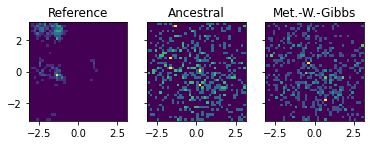

Epoch 263 Loss: -16476.913330078125


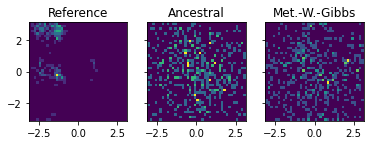

Epoch 264 Loss: -16531.329711914062


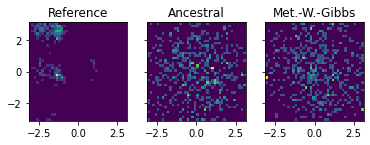

Epoch 265 Loss: -16612.069702148438


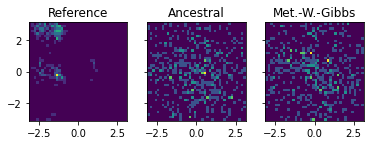

Epoch 266 Loss: -16675.2529296875


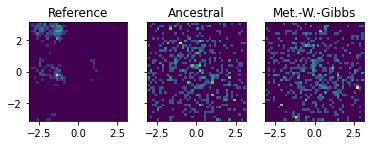

Epoch 267 Loss: -16732.92236328125


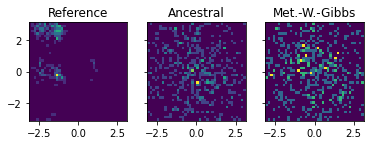

Epoch 268 Loss: -16779.33837890625


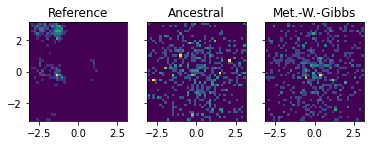

Epoch 269 Loss: -16813.460083007812


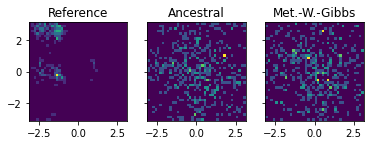

Epoch 270 Loss: -16900.341430664062


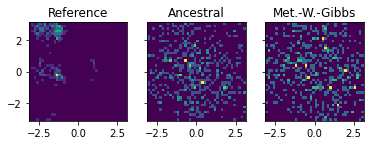

Epoch 271 Loss: -16977.805419921875


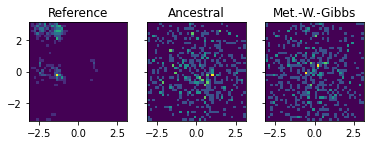

Epoch 272 Loss: -17050.852172851562


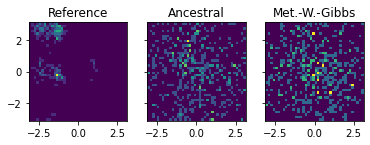

Epoch 273 Loss: -17104.518188476562


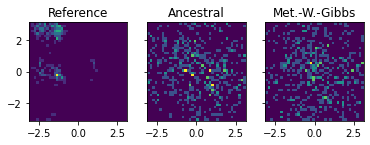

Epoch 274 Loss: -17163.423461914062


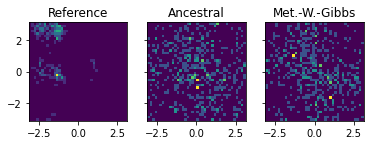

Epoch 275 Loss: -17227.247192382812


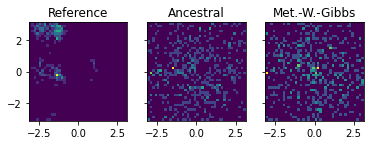

Epoch 276 Loss: -17263.97119140625


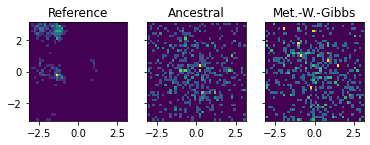

Epoch 277 Loss: -17321.680053710938


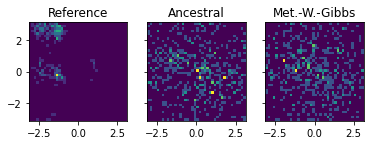

Epoch 278 Loss: -17415.837524414062


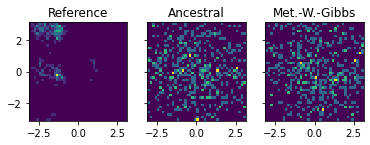

Epoch 279 Loss: -17426.976928710938


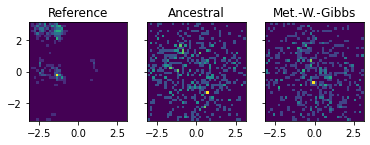

Epoch 280 Loss: -17515.095825195312


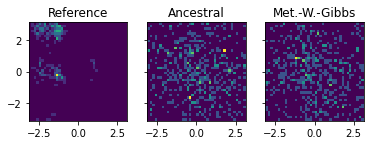

Epoch 281 Loss: -17585.556518554688


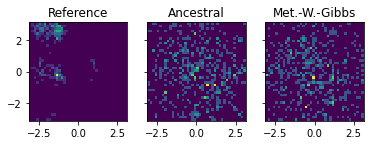

Epoch 282 Loss: -17617.26025390625


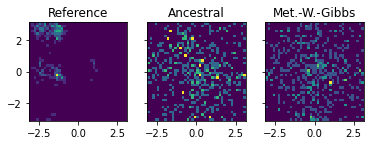

Epoch 283 Loss: -17634.669189453125


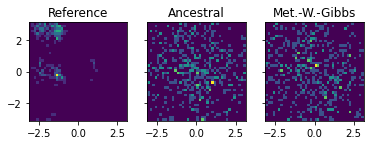

Epoch 284 Loss: -17740.10302734375


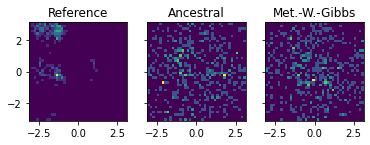

Epoch 285 Loss: -17785.92333984375


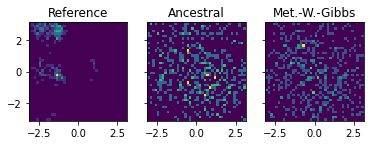

Epoch 286 Loss: -17873.314208984375


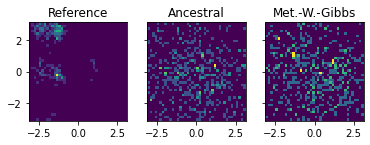

Epoch 287 Loss: -17938.874877929688


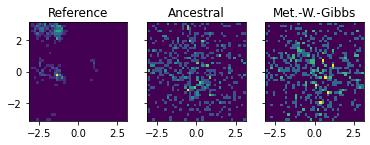

Epoch 288 Loss: -18011.763549804688


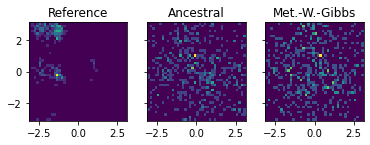

Epoch 289 Loss: -18065.184692382812


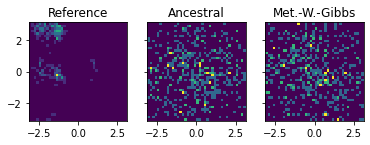

Epoch 290 Loss: -18119.523681640625


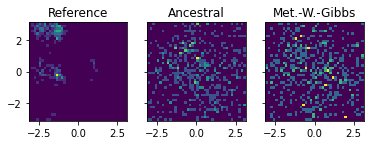

Epoch 291 Loss: -18179.347412109375


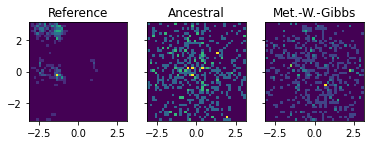

Epoch 292 Loss: -18253.525390625


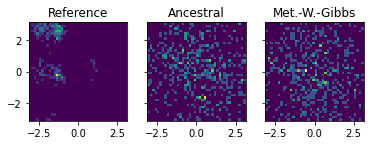

Epoch 293 Loss: -18334.28564453125


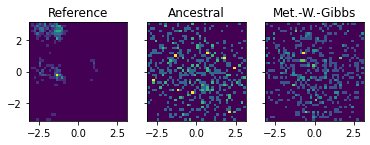

Epoch 294 Loss: -18357.292846679688


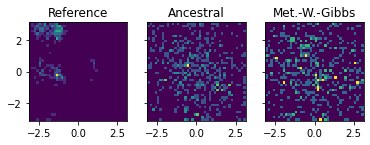

Epoch 295 Loss: -18421.5078125


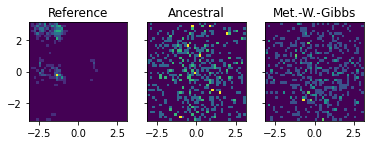

Epoch 296 Loss: -18461.13623046875


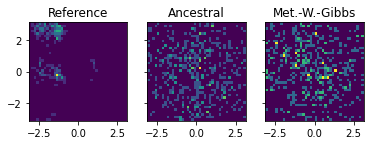

Epoch 297 Loss: -18536.52978515625


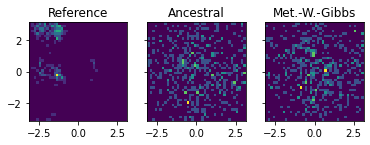

Epoch 298 Loss: -18582.303344726562


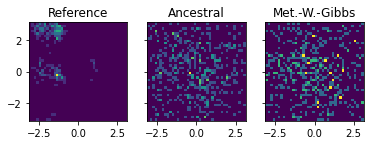

Epoch 299 Loss: -18655.651123046875


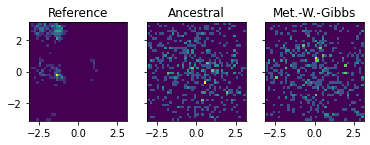

Epoch 300 Loss: -18714.79833984375


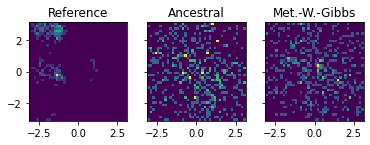

Epoch 301 Loss: -18751.21728515625


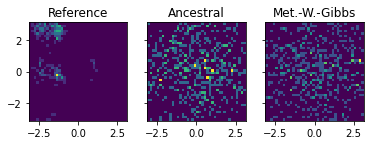

Epoch 302 Loss: -18779.9599609375


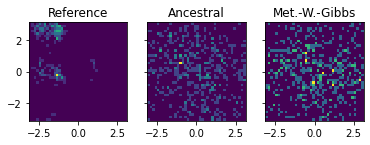

Epoch 303 Loss: -18879.14892578125


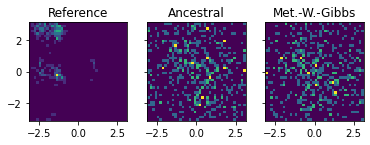

Epoch 304 Loss: -18929.499633789062


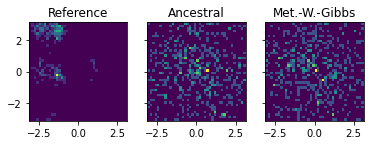

Epoch 305 Loss: -18989.382690429688


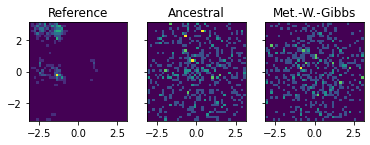

Epoch 306 Loss: -19041.74267578125


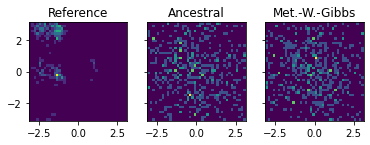

Epoch 307 Loss: -19122.063842773438


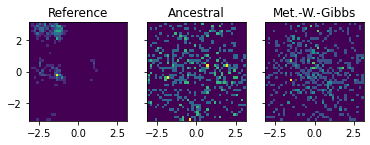

Epoch 308 Loss: -19177.657470703125


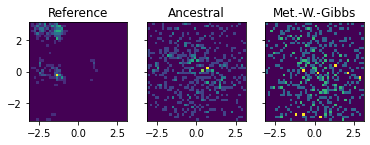

Epoch 309 Loss: -19231.223266601562


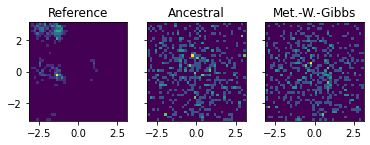

Epoch 310 Loss: -19296.662353515625


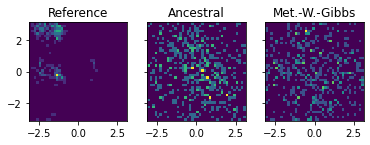

Epoch 311 Loss: -19360.740844726562


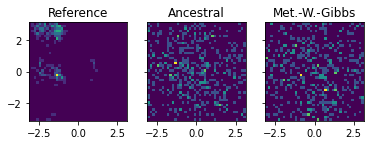

Epoch 312 Loss: -19448.4599609375


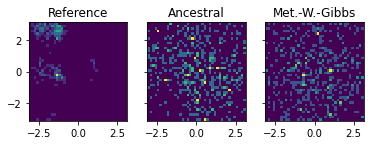

Epoch 313 Loss: -19523.8857421875


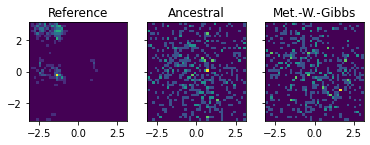

Epoch 314 Loss: -19555.994140625


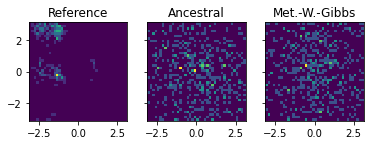

Epoch 315 Loss: -19574.39306640625


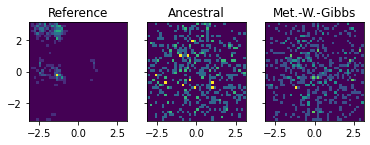

Epoch 316 Loss: -19641.52880859375


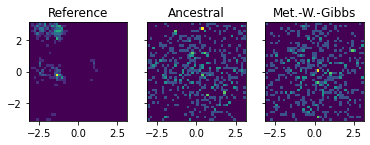

Epoch 317 Loss: -19735.286865234375


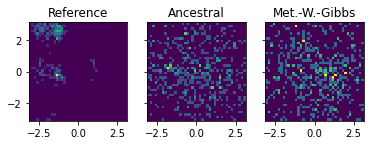

Epoch 318 Loss: -19803.445068359375


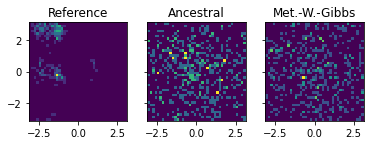

Epoch 319 Loss: -19873.32568359375


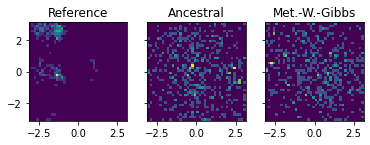

Epoch 320 Loss: -19940.33154296875


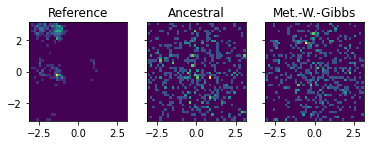

Epoch 321 Loss: -19973.134765625


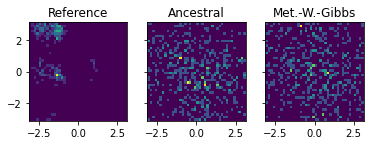

Epoch 322 Loss: -20001.64599609375


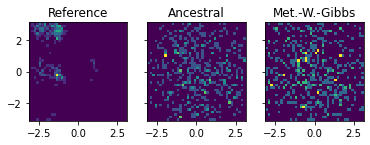

Epoch 323 Loss: -20068.6904296875


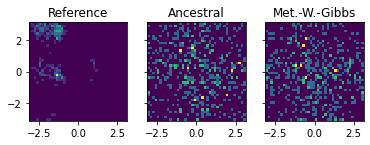

Epoch 324 Loss: -20183.974853515625


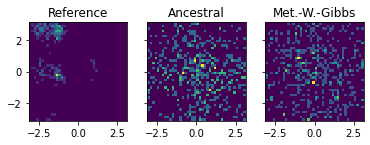

Epoch 325 Loss: -20222.44775390625


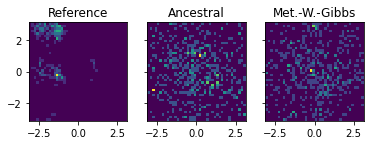

Epoch 326 Loss: -20259.534423828125


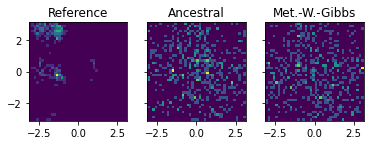

Epoch 327 Loss: -20278.898193359375


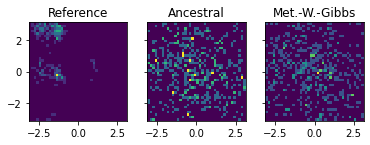

Epoch 328 Loss: -20364.975830078125


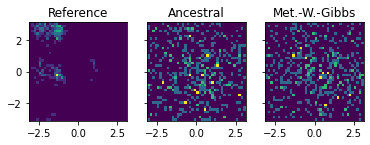

Epoch 329 Loss: -20453.763427734375


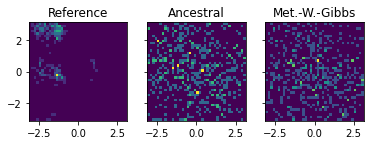

Epoch 330 Loss: -20491.33349609375


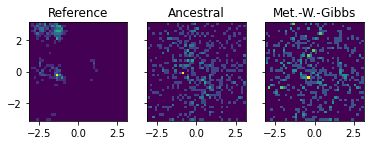

Epoch 331 Loss: -20534.93212890625


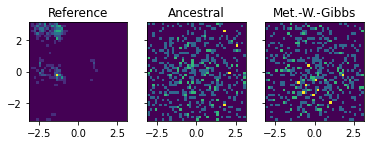

Epoch 332 Loss: -20597.6650390625


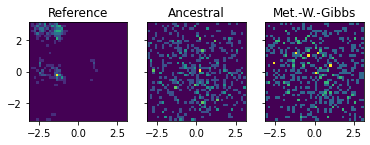

Epoch 333 Loss: -20666.059814453125


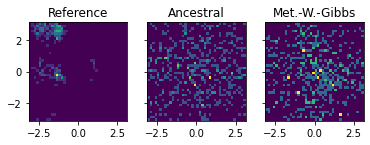

Epoch 334 Loss: -20749.224853515625


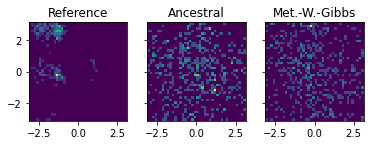

Epoch 335 Loss: -20807.208251953125


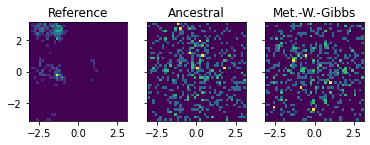

Epoch 336 Loss: -20820.253173828125


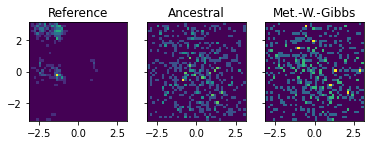

Epoch 337 Loss: -20836.51318359375


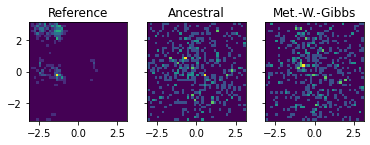

Epoch 338 Loss: -20948.139892578125


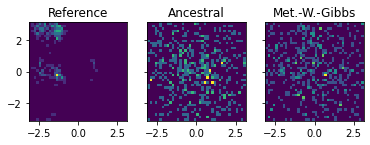

Epoch 339 Loss: -21020.044677734375


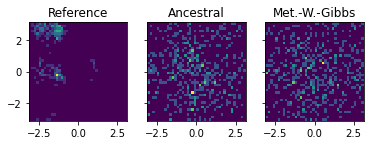

Epoch 340 Loss: -21000.960205078125


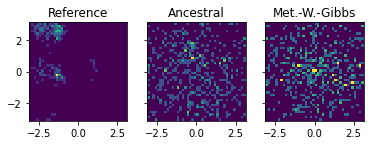

Epoch 341 Loss: -21036.732177734375


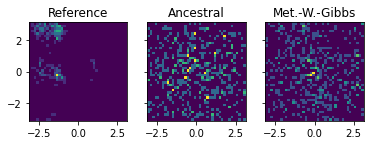

Epoch 342 Loss: -21131.357177734375


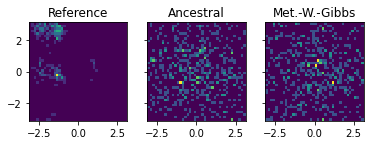

Epoch 343 Loss: -21209.6455078125


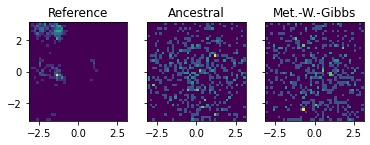

Epoch 344 Loss: -21275.17529296875


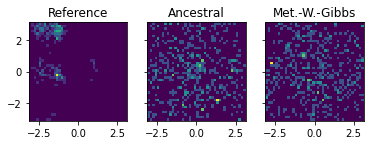

Epoch 345 Loss: -21366.829345703125


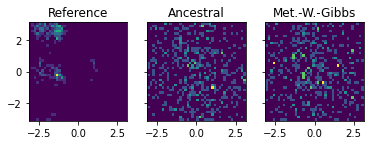

Epoch 346 Loss: -21436.583740234375


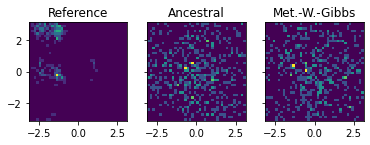

Epoch 347 Loss: -21386.74755859375


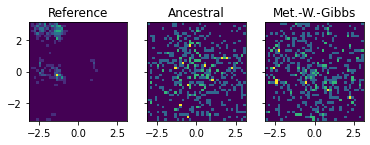

Epoch 348 Loss: -19501.517822265625


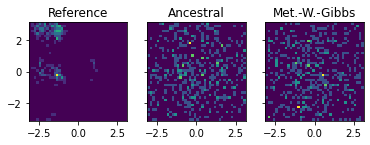

Epoch 349 Loss: -20738.760986328125


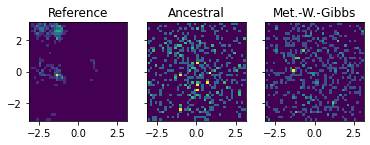

Epoch 350 Loss: -21160.745849609375


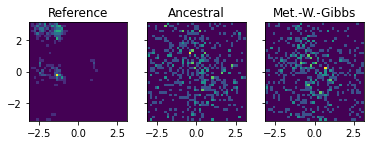

Epoch 351 Loss: -21438.27880859375


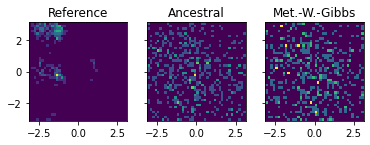

Epoch 352 Loss: -21601.904541015625


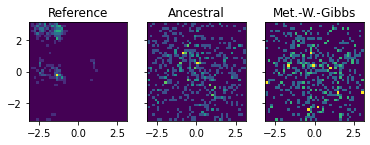

Epoch 353 Loss: -21720.801025390625


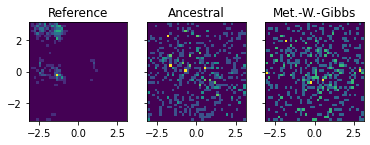

Epoch 354 Loss: -21730.228515625


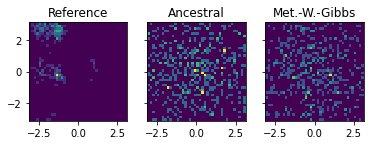

Epoch 355 Loss: -21853.002197265625


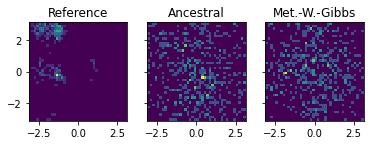

Epoch 356 Loss: -21942.000244140625


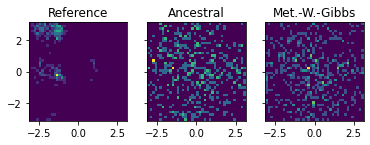

Epoch 357 Loss: -18261.45654296875


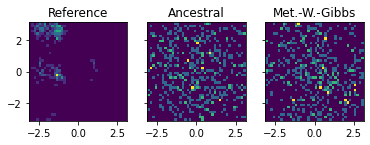

Epoch 358 Loss: -21322.413330078125


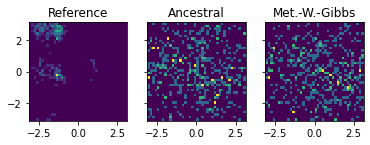

Epoch 359 Loss: -21814.704345703125


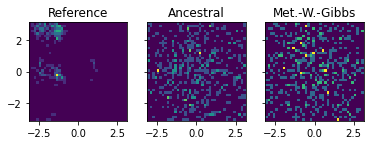

Epoch 360 Loss: -22006.4384765625


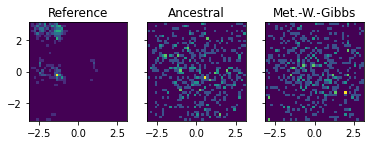

Epoch 361 Loss: -22140.17041015625


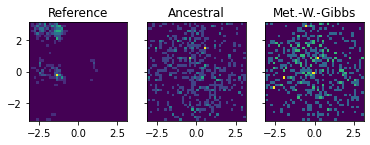

Epoch 362 Loss: -22233.9658203125


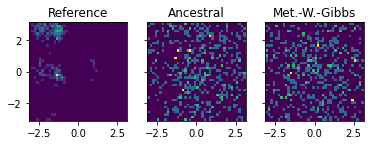

Epoch 363 Loss: -22356.85546875


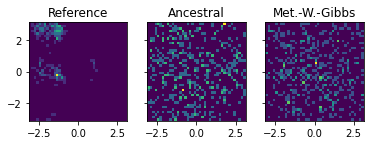

Epoch 364 Loss: -22394.62158203125


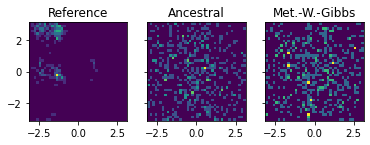

Epoch 365 Loss: -22452.65625


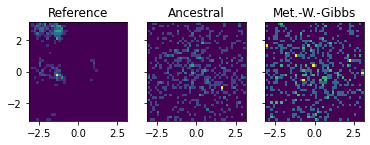

Epoch 366 Loss: -22503.718994140625


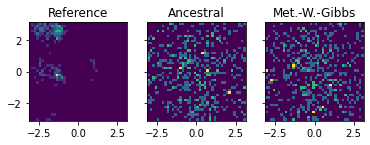

Epoch 367 Loss: -22586.154541015625


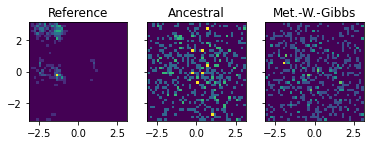

Epoch 368 Loss: -22607.638427734375


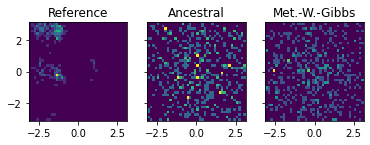

Epoch 369 Loss: -22700.958740234375


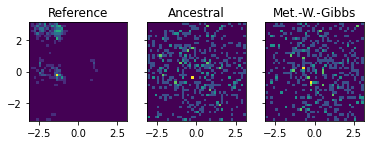

Epoch 370 Loss: -22691.2314453125


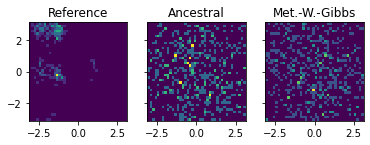

Epoch 371 Loss: -22749.361083984375


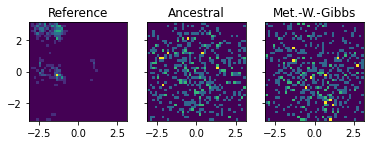

Epoch 372 Loss: -22852.21337890625


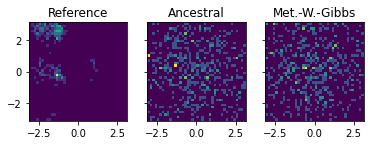

Epoch 373 Loss: -22918.70556640625


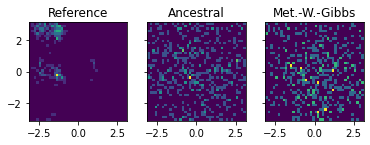

Epoch 374 Loss: -22874.35595703125


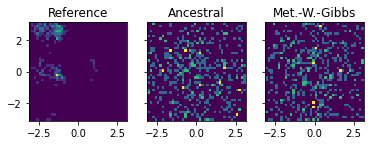

Epoch 375 Loss: -22984.50927734375


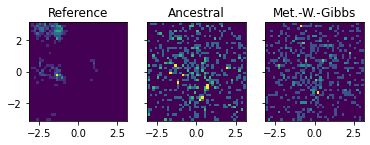

Epoch 376 Loss: -23036.006103515625


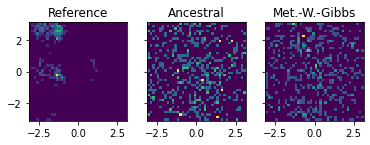

Epoch 377 Loss: -23061.773193359375


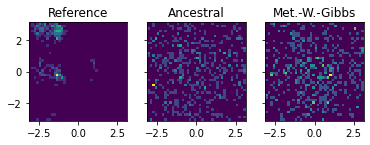

Epoch 378 Loss: -23153.400146484375


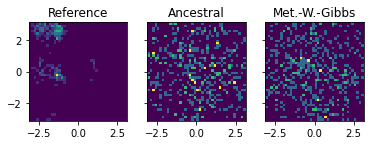

Epoch 379 Loss: -23272.10888671875


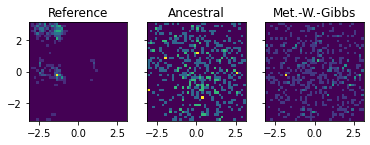

Epoch 380 Loss: -23328.879150390625


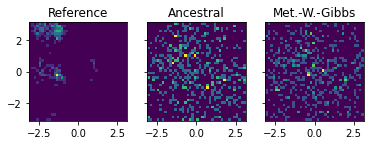

Epoch 381 Loss: -23373.628662109375


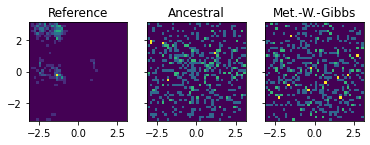

Epoch 382 Loss: -23458.770263671875


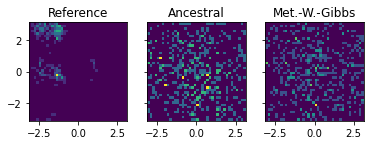

Epoch 383 Loss: -23432.1103515625


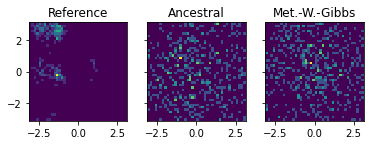

Epoch 384 Loss: -23532.006103515625


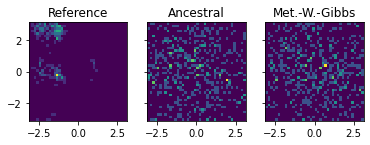

Epoch 385 Loss: -23597.746826171875


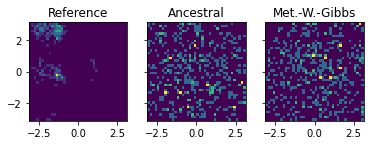

Epoch 386 Loss: -23620.4033203125


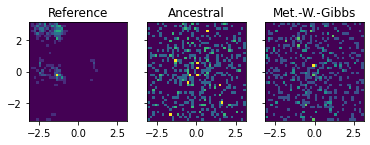

Epoch 387 Loss: -23707.04638671875


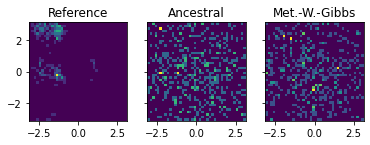

Epoch 388 Loss: -23769.3173828125


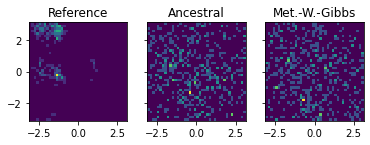

Epoch 389 Loss: -23796.67919921875


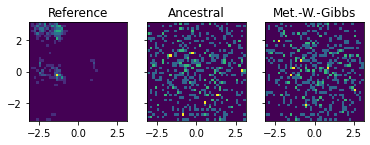

Epoch 390 Loss: -23843.022216796875


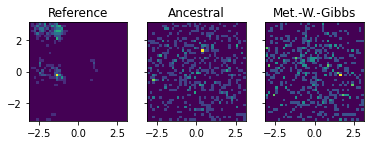

Epoch 391 Loss: -23908.391845703125


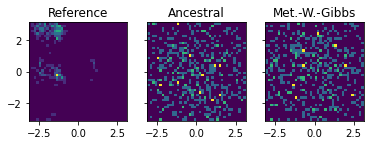

Epoch 392 Loss: -23942.125732421875


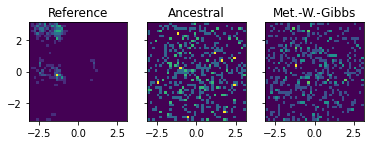

Epoch 393 Loss: -23965.40234375


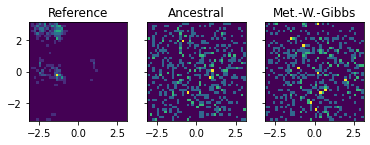

Epoch 394 Loss: -24047.770263671875


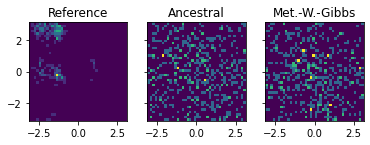

Epoch 395 Loss: -24108.023193359375


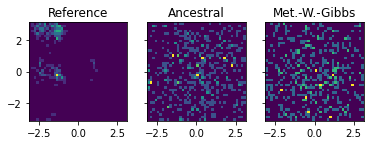

Epoch 396 Loss: -24202.30078125


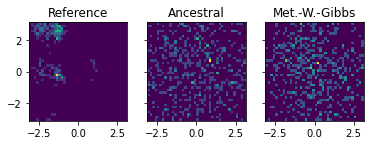

Epoch 397 Loss: -24220.446533203125


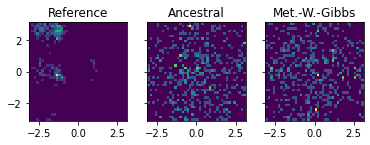

Epoch 398 Loss: -24243.23095703125


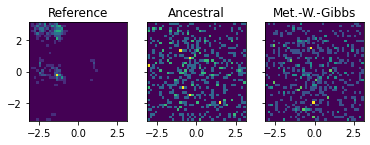

Epoch 399 Loss: -24333.8525390625


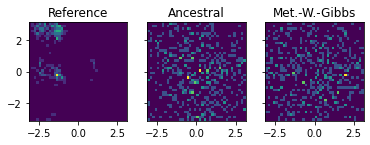

Epoch 400 Loss: -24403.508056640625


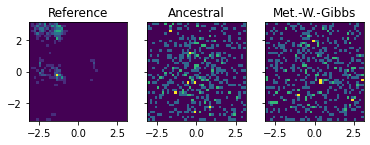

Epoch 401 Loss: -24491.807861328125


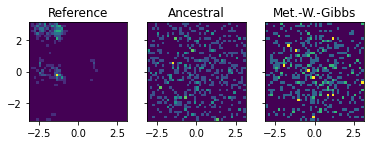

Epoch 402 Loss: -24511.14697265625


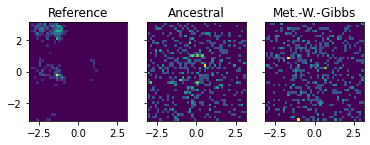

Epoch 403 Loss: -24578.832275390625


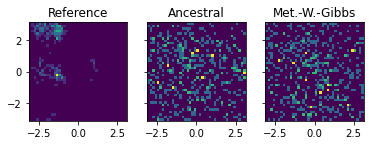

Epoch 404 Loss: -24628.3291015625


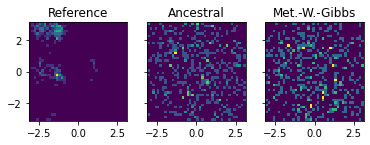

Epoch 405 Loss: -24672.119140625


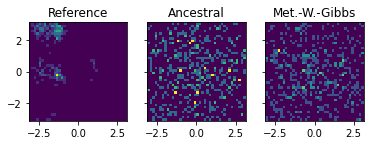

Epoch 406 Loss: -24689.393310546875


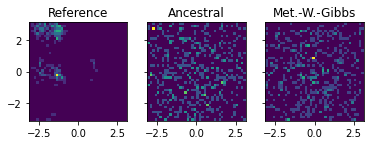

Epoch 407 Loss: -24764.152099609375


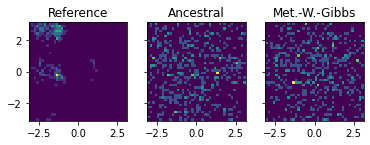

Epoch 408 Loss: -24778.787841796875


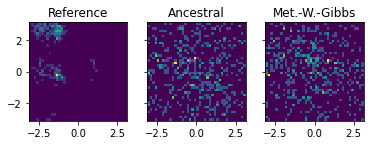

Epoch 409 Loss: -24762.454345703125


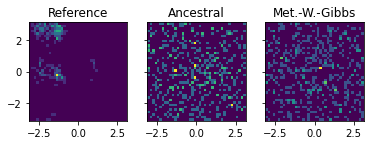

Epoch 410 Loss: -24769.01904296875


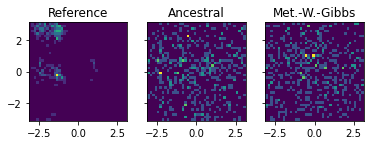

Epoch 411 Loss: -24890.784423828125


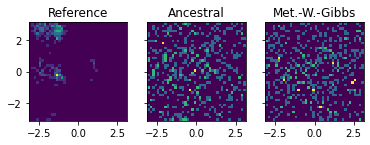

Epoch 412 Loss: -24931.834716796875


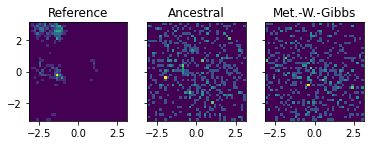

Epoch 413 Loss: -24876.772216796875


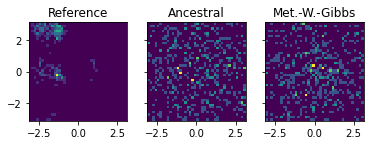

Epoch 414 Loss: -24962.253662109375


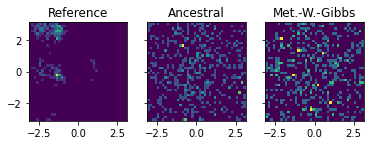

Epoch 415 Loss: -25043.455078125


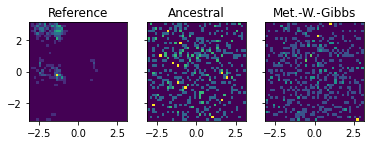

Epoch 416 Loss: -25122.460693359375


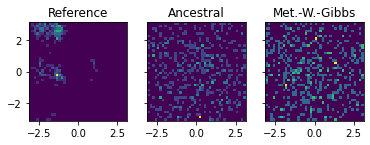

Epoch 417 Loss: -25244.347900390625


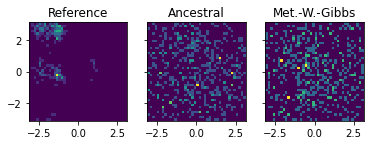

Epoch 418 Loss: -19473.11376953125


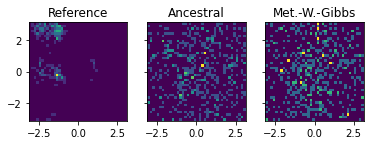

Epoch 419 Loss: -24282.53662109375


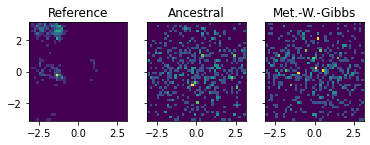

Epoch 420 Loss: -24583.588623046875


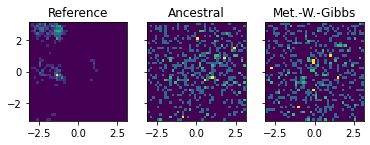

Epoch 421 Loss: -24839.85302734375


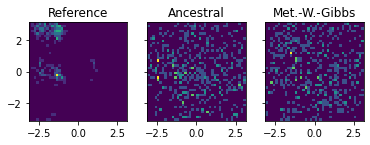

Epoch 422 Loss: -25094.058837890625


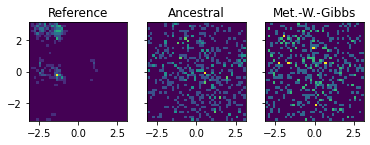

Epoch 423 Loss: -25034.2763671875


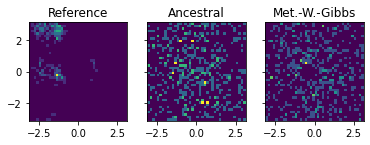

Epoch 424 Loss: -25212.258056640625


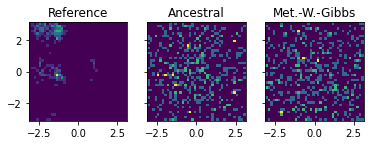

Epoch 425 Loss: -25274.069580078125


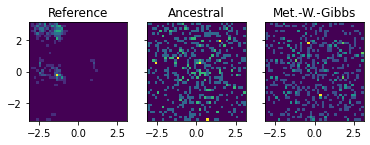

Epoch 426 Loss: -25295.479248046875


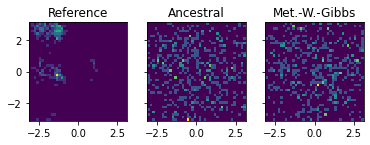

Epoch 427 Loss: -25319.609130859375


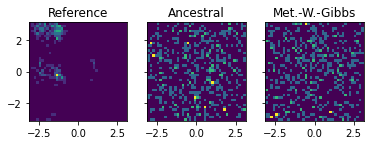

Epoch 428 Loss: -25430.638916015625


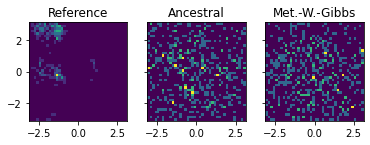

Epoch 429 Loss: -25449.818359375


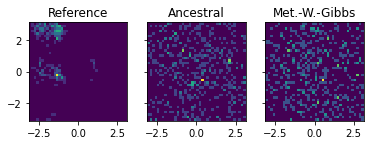

Epoch 430 Loss: -25546.076416015625


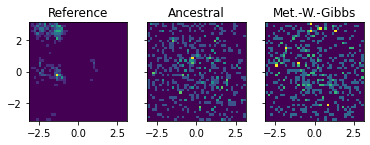

Epoch 431 Loss: -25486.392333984375


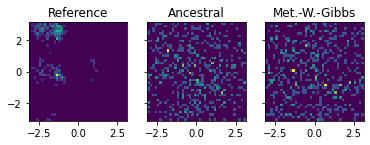

Epoch 432 Loss: -25550.138671875


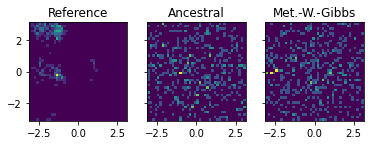

Epoch 433 Loss: -25722.42138671875


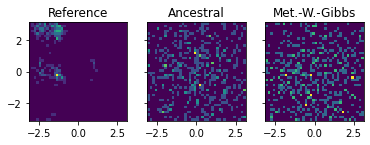

Epoch 434 Loss: -25804.760498046875


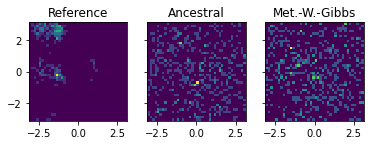

Epoch 435 Loss: -25824.425048828125


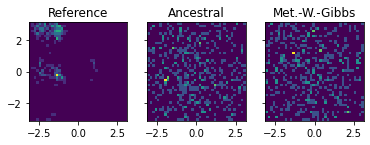

Epoch 436 Loss: -25965.864013671875


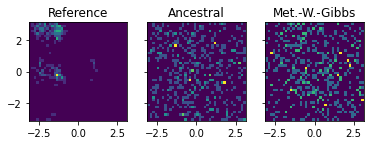

Epoch 437 Loss: -25999.8408203125


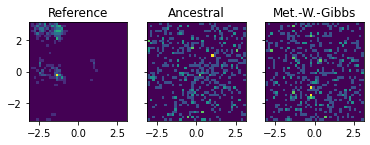

Epoch 438 Loss: -26019.81640625


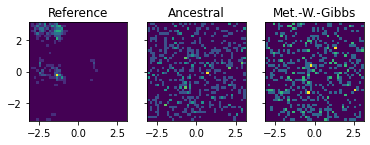

Epoch 439 Loss: -26023.4853515625


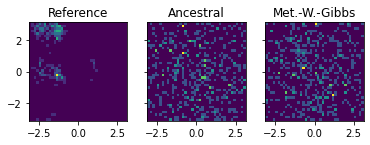

Epoch 440 Loss: -26159.7099609375


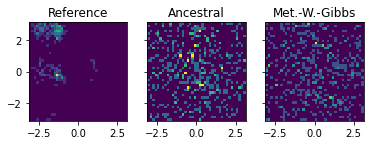

Epoch 441 Loss: -26104.9140625


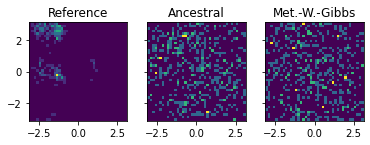

Epoch 442 Loss: -25947.009033203125


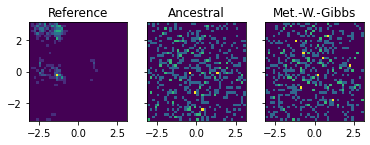

Epoch 443 Loss: -26155.57958984375


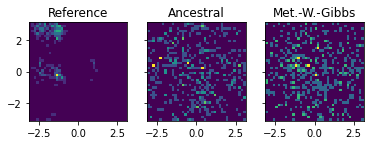

Epoch 444 Loss: -26191.17626953125


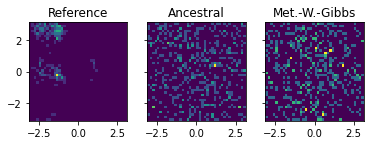

Epoch 445 Loss: -26344.173095703125


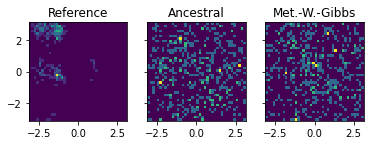

Epoch 446 Loss: -26468.6591796875


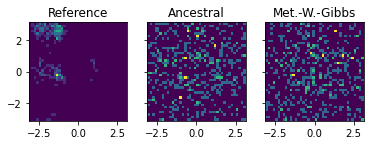

Epoch 447 Loss: -26558.071533203125


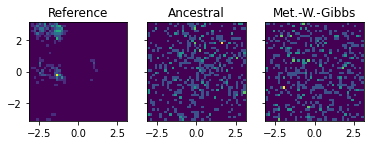

Epoch 448 Loss: -26568.492919921875


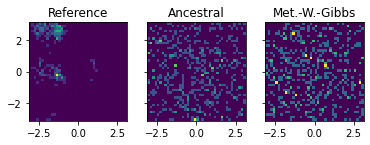

Epoch 449 Loss: -26621.97216796875


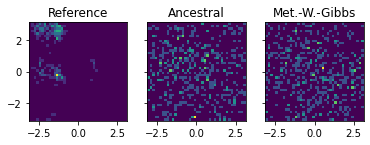

Epoch 450 Loss: -26666.47216796875


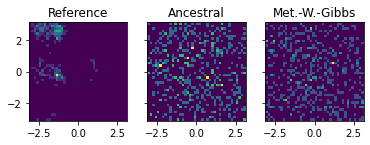

Epoch 451 Loss: -26674.87841796875


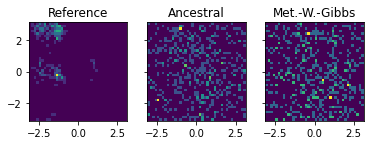

Epoch 452 Loss: -26759.05810546875


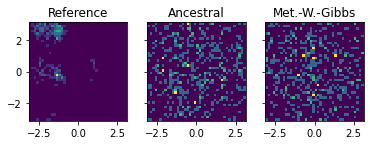

Epoch 453 Loss: -26842.822509765625


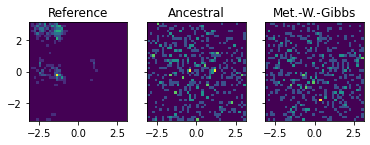

Epoch 454 Loss: -26907.536376953125


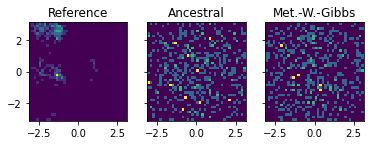

Epoch 455 Loss: -26945.870361328125


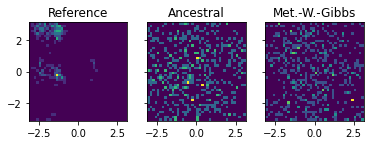

Epoch 456 Loss: -26914.203857421875


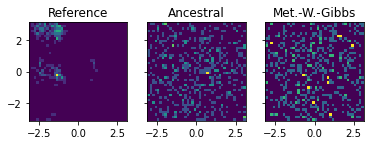

Epoch 457 Loss: -26941.8193359375


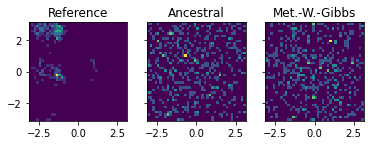

Epoch 458 Loss: -27017.288330078125


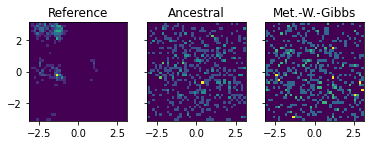

Epoch 459 Loss: -27102.472412109375


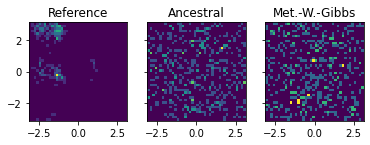

Epoch 460 Loss: -27210.677001953125


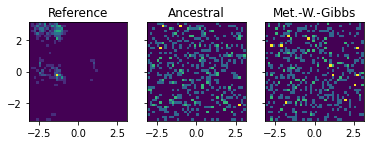

Epoch 461 Loss: -27278.7666015625


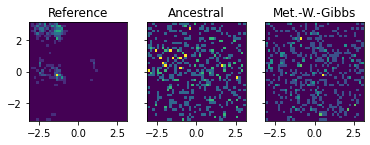

Epoch 462 Loss: -27329.280517578125


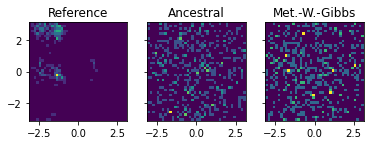

Epoch 463 Loss: -27278.05810546875


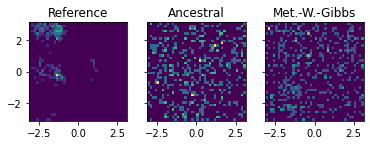

Epoch 464 Loss: -27425.166748046875


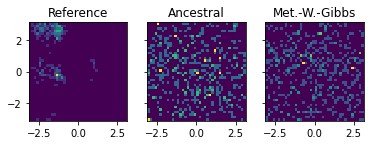

Epoch 465 Loss: -27390.383056640625


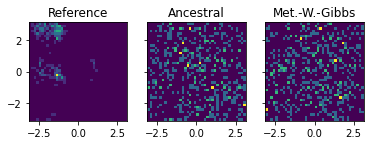

Epoch 466 Loss: -27464.384521484375


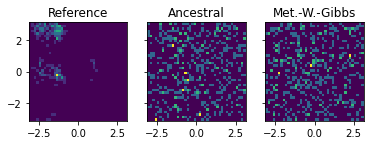

Epoch 467 Loss: -27510.622802734375


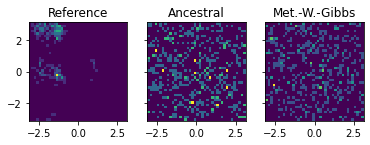

Epoch 468 Loss: -27560.24072265625


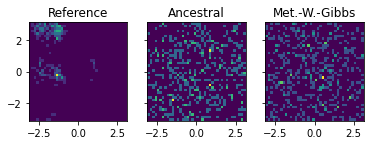

Epoch 469 Loss: -27624.380126953125


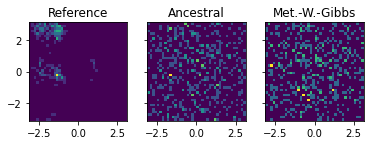

Epoch 470 Loss: -27550.759765625


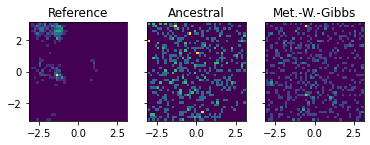

Epoch 471 Loss: -27491.022705078125


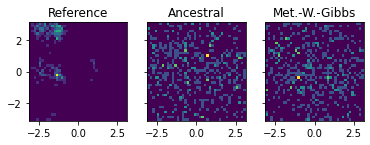

Epoch 472 Loss: -27670.060546875


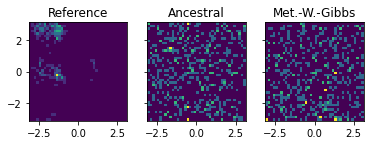

Epoch 473 Loss: -27811.68212890625


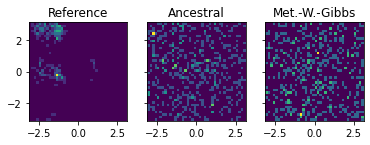

Epoch 474 Loss: -27715.68359375


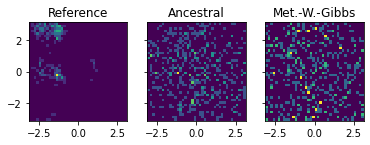

Epoch 475 Loss: -27844.056884765625


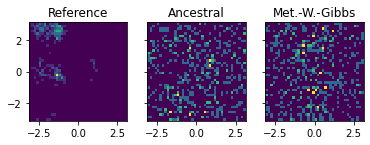

Epoch 476 Loss: -27987.444580078125


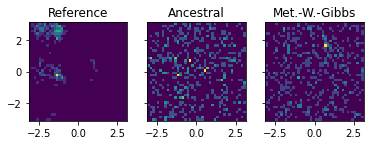

Epoch 477 Loss: -28035.500244140625


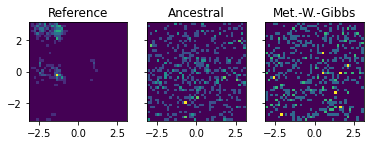

Epoch 478 Loss: -28031.793701171875


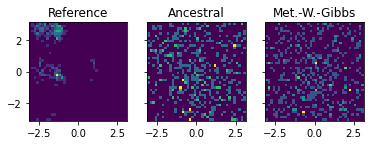

Epoch 479 Loss: -28255.01806640625


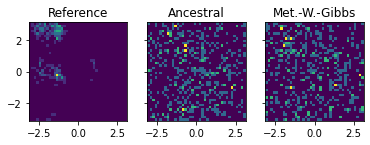

Epoch 480 Loss: -28257.590087890625


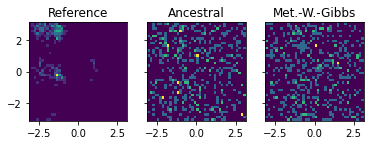

Epoch 481 Loss: -28271.91796875


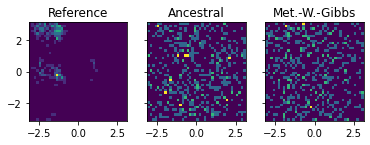

Epoch 482 Loss: -28317.9541015625


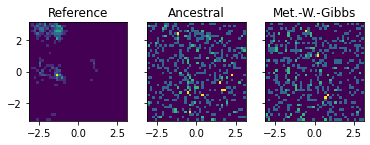

Epoch 483 Loss: -28320.711669921875


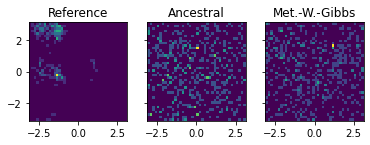

Epoch 484 Loss: -28295.100830078125


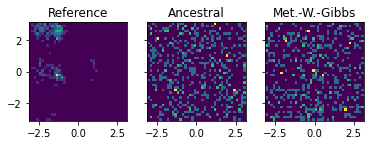

Epoch 485 Loss: -28320.41650390625


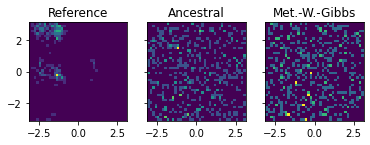

Epoch 486 Loss: -28463.93359375


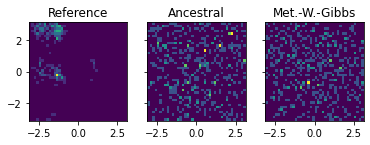

Epoch 487 Loss: -28373.83154296875


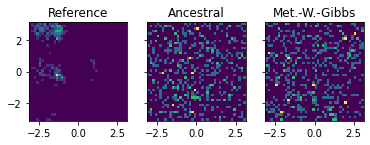

Epoch 488 Loss: -28518.6455078125


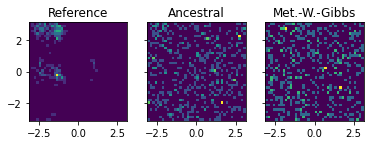

Epoch 489 Loss: -28474.671630859375


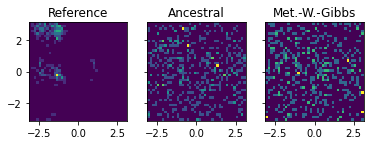

Epoch 490 Loss: -28533.7099609375


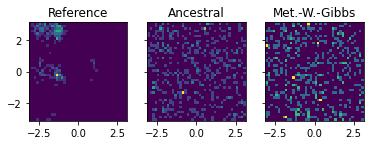

Epoch 491 Loss: -28531.163330078125


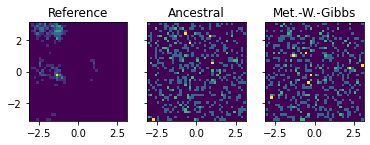

Epoch 492 Loss: -28646.490966796875


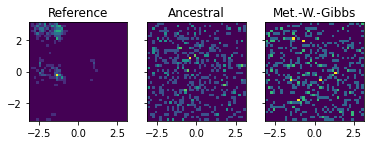

Epoch 493 Loss: -28743.45947265625


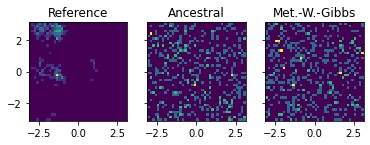

Epoch 494 Loss: -28863.850830078125


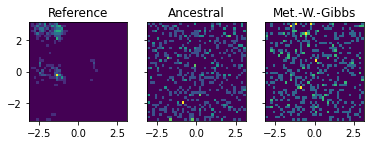

Epoch 495 Loss: -28801.14208984375


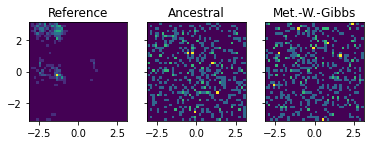

Epoch 496 Loss: -28885.1943359375


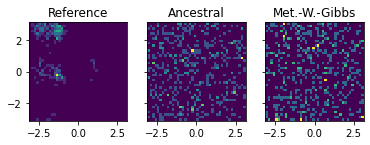

Epoch 497 Loss: -28998.94091796875


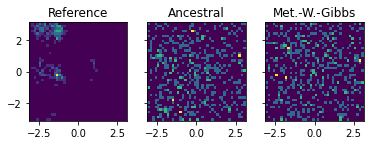

Epoch 498 Loss: -28976.43115234375


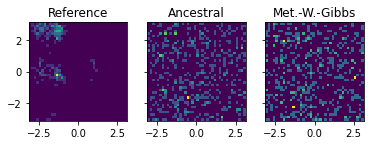

Epoch 499 Loss: -28923.14697265625


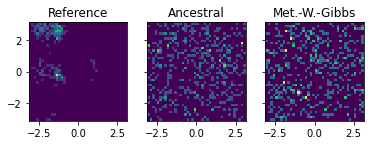

Epoch 500 Loss: -29057.22265625


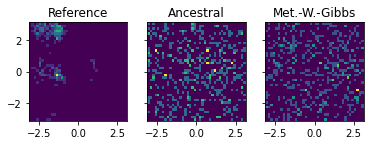

Epoch 501 Loss: -29052.596923828125


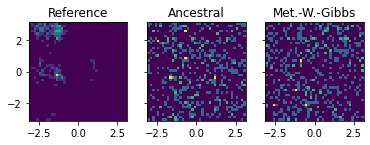

Epoch 502 Loss: -29128.118896484375


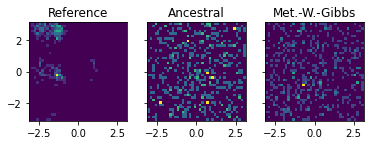

Epoch 503 Loss: -29077.6279296875


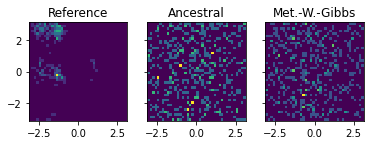

Epoch 504 Loss: -29216.455078125


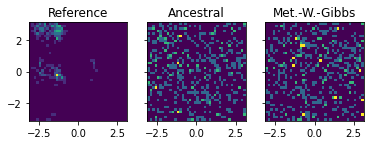

Epoch 505 Loss: -29346.42529296875


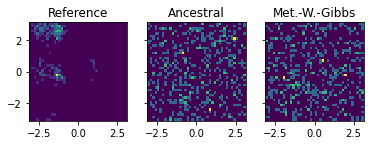

Epoch 506 Loss: -29422.12646484375


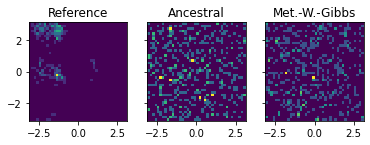

Epoch 507 Loss: -29429.912353515625


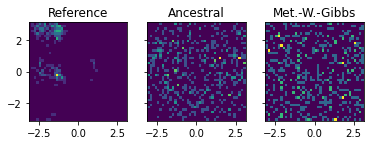

Epoch 508 Loss: -29341.3349609375


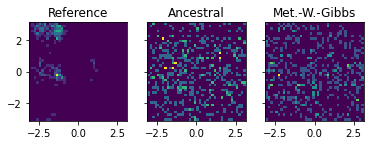

Epoch 509 Loss: -29462.040771484375


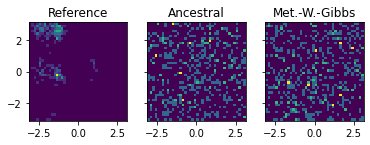

Epoch 510 Loss: -29524.0576171875


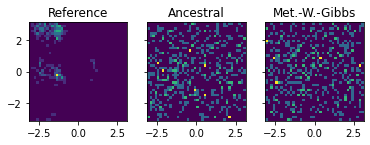

Epoch 511 Loss: -29526.859375


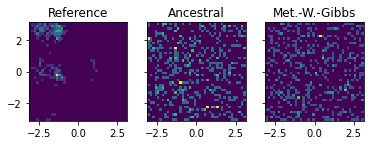

Epoch 512 Loss: -29385.662109375


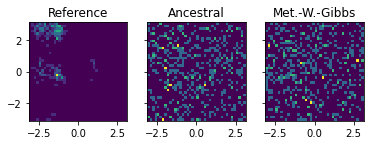

Epoch 513 Loss: -29589.896240234375


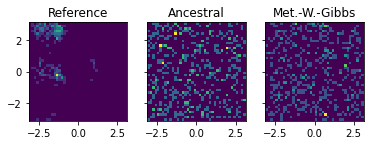

Epoch 514 Loss: -29691.31494140625


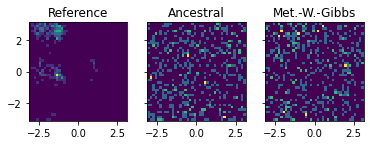

Epoch 515 Loss: -29805.11865234375


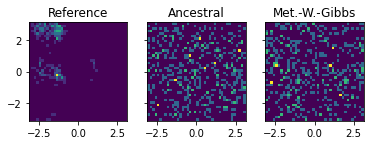

Epoch 516 Loss: -29795.107666015625


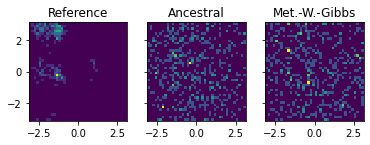

Epoch 517 Loss: -29679.256103515625


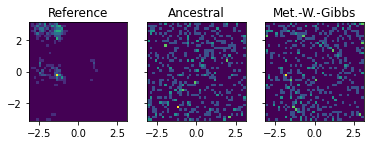

Epoch 518 Loss: -29675.420166015625


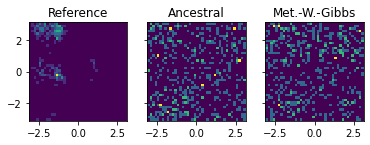

Epoch 519 Loss: -29533.985595703125


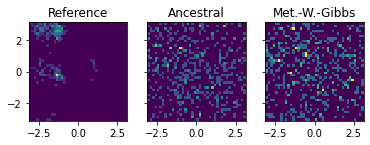

Epoch 520 Loss: -29607.367431640625


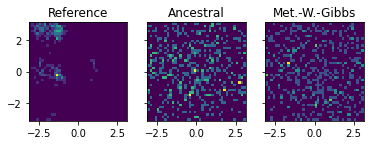

Epoch 521 Loss: -29805.861572265625


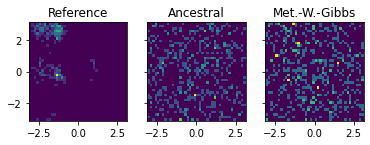

Epoch 522 Loss: -29899.586669921875


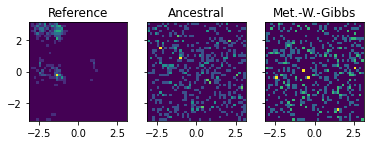

Epoch 523 Loss: -29901.813720703125


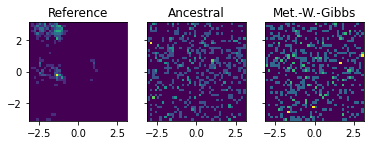

Epoch 524 Loss: -30008.301513671875


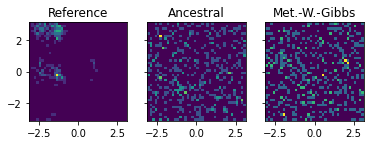

Epoch 525 Loss: -30142.58154296875


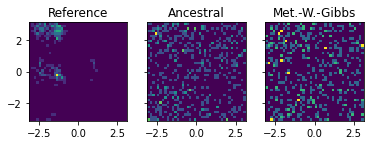

Epoch 526 Loss: -30221.60400390625


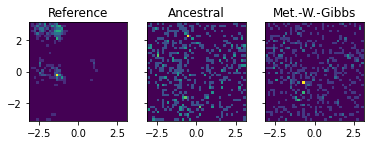

Epoch 527 Loss: -30256.156005859375


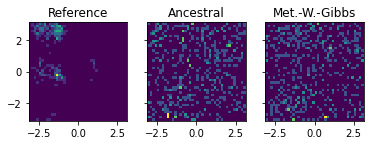

Epoch 528 Loss: -30201.425048828125


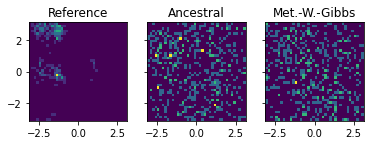

Epoch 529 Loss: -30109.337890625


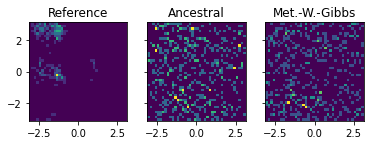

Epoch 530 Loss: -30109.234619140625


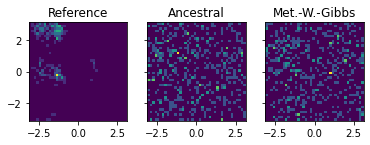

Epoch 531 Loss: -30351.112060546875


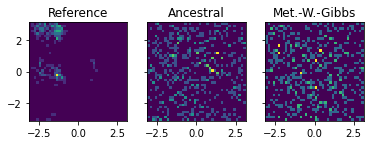

Epoch 532 Loss: -30458.64990234375


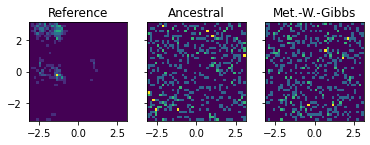

Epoch 533 Loss: -30479.150634765625


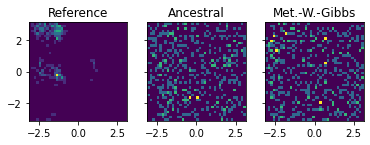

Epoch 534 Loss: -30498.348876953125


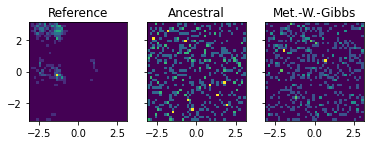

Epoch 535 Loss: -30596.463623046875


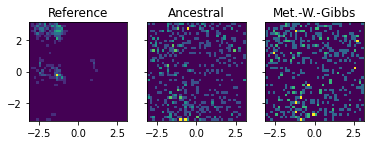

Epoch 536 Loss: -30451.02294921875


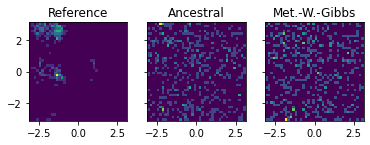

Epoch 537 Loss: -17538.270263671875


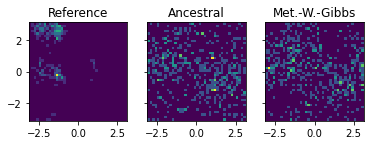

Epoch 538 Loss: -28600.330322265625


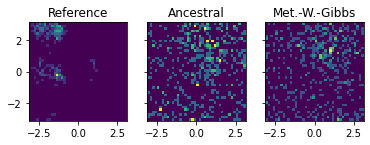

Epoch 539 Loss: -29070.28759765625


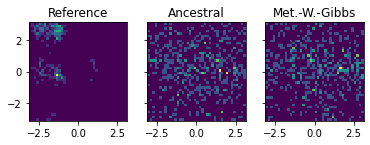

Epoch 540 Loss: -29378.089111328125


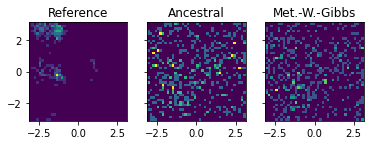

Epoch 541 Loss: -29179.515380859375


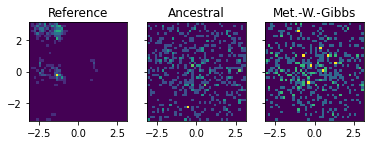

Epoch 542 Loss: -29343.612548828125


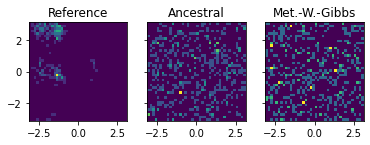

Epoch 543 Loss: -29756.37939453125


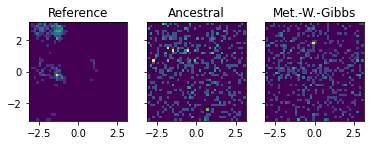

Epoch 544 Loss: -30071.020263671875


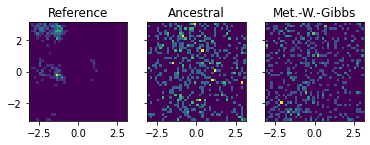

Epoch 545 Loss: -30096.44580078125


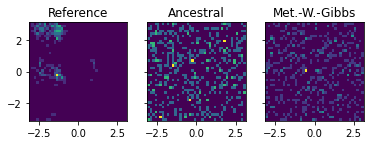

Epoch 546 Loss: -30140.423583984375


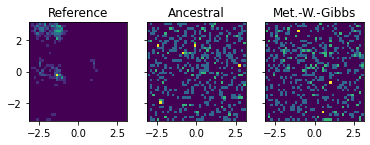

Epoch 547 Loss: -29973.454345703125


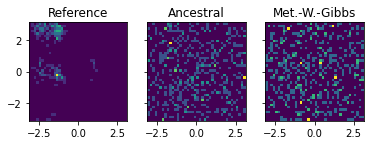

Epoch 548 Loss: -30349.497314453125


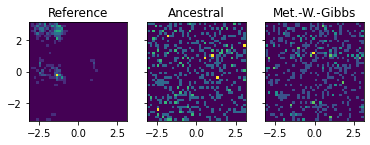

Epoch 549 Loss: -30145.82958984375


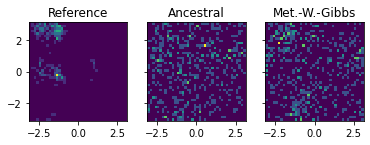

Epoch 550 Loss: -30219.584228515625


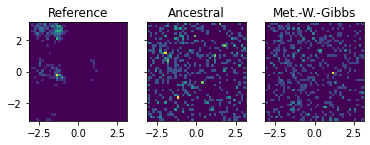

Epoch 551 Loss: -30313.32373046875


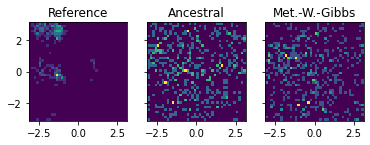

Epoch 552 Loss: -30315.037109375


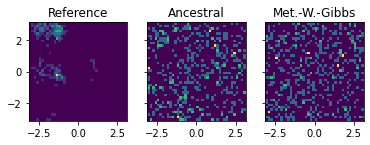

Epoch 553 Loss: -30499.637451171875


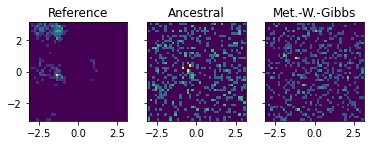

Epoch 554 Loss: -30672.107666015625


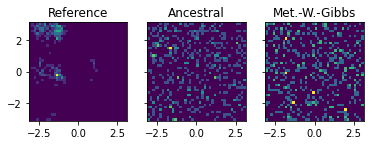

Epoch 555 Loss: -30801.714111328125


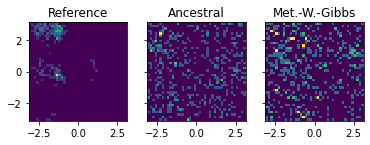

Epoch 556 Loss: -30762.611572265625


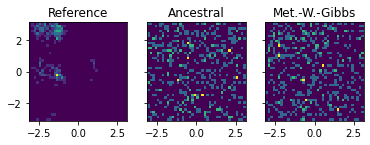

Epoch 557 Loss: -30720.154541015625


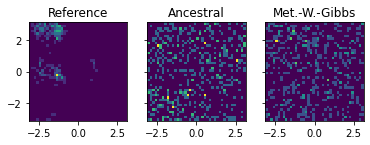

Epoch 558 Loss: -30830.529296875


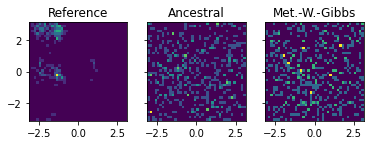

Epoch 559 Loss: -30935.943603515625


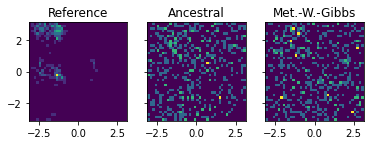

Epoch 560 Loss: -30958.148193359375


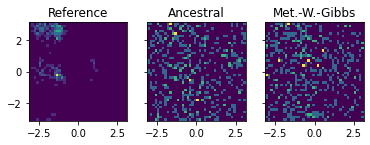

Epoch 561 Loss: -31044.382568359375


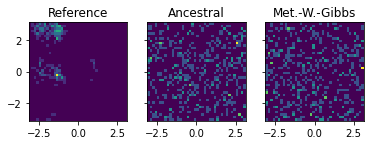

Epoch 562 Loss: -30964.53662109375


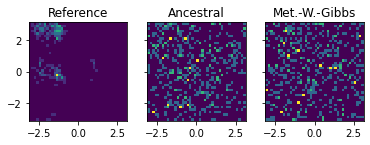

Epoch 563 Loss: -30930.128662109375


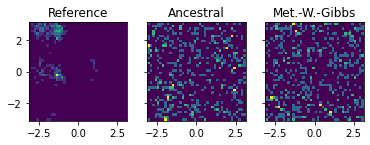

Epoch 564 Loss: -31139.08447265625


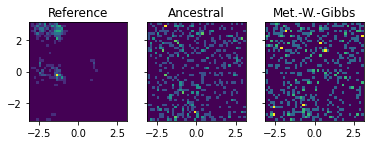

Epoch 565 Loss: -30876.640625


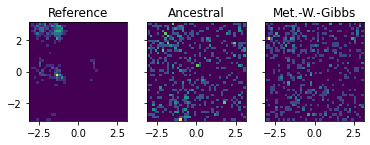

Epoch 566 Loss: -31064.307373046875


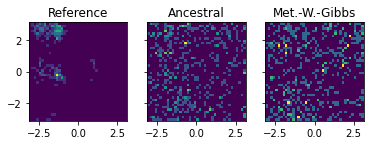

Epoch 567 Loss: -31193.6787109375


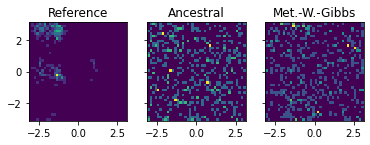

Epoch 568 Loss: -31392.931396484375


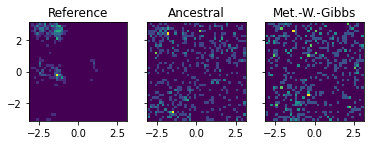

Epoch 569 Loss: -31343.747802734375


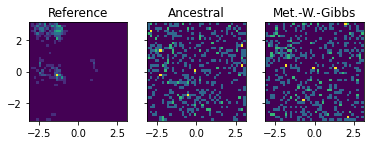

Epoch 570 Loss: -31151.271240234375


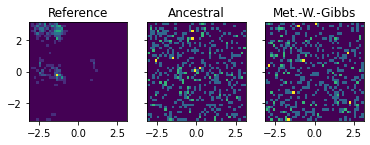

Epoch 571 Loss: -31318.4501953125


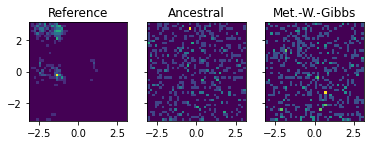

Epoch 572 Loss: -31335.191162109375


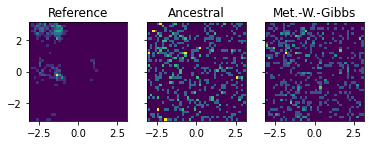

Epoch 573 Loss: -31506.097412109375


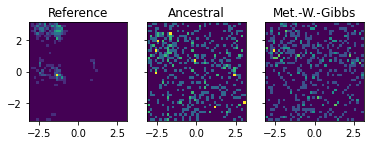

Epoch 574 Loss: -31581.904296875


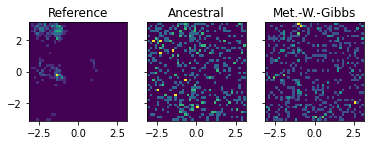

Epoch 575 Loss: -31477.29833984375


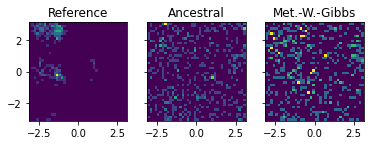

Epoch 576 Loss: -31557.382568359375


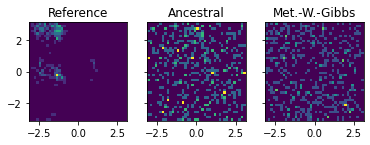

Epoch 577 Loss: -31702.248779296875


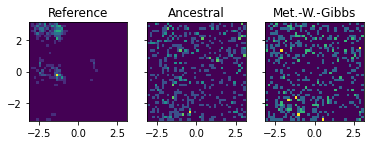

Epoch 578 Loss: -31659.488525390625


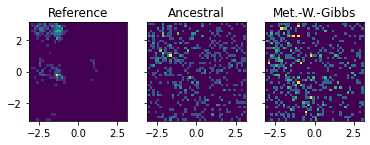

Epoch 579 Loss: -31613.0205078125


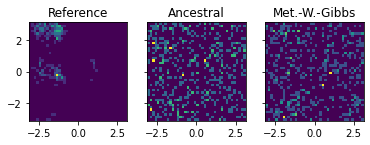

Epoch 580 Loss: -31831.002197265625


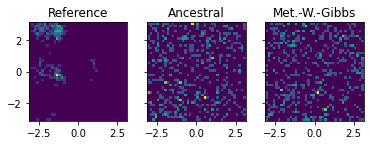

Epoch 581 Loss: -31925.614990234375


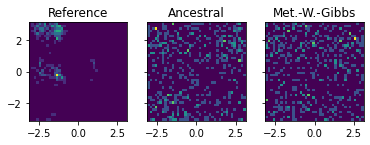

Epoch 582 Loss: -31926.398193359375


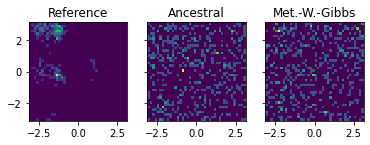

Epoch 583 Loss: -31952.7587890625


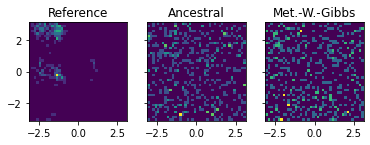

Epoch 584 Loss: -31977.16259765625


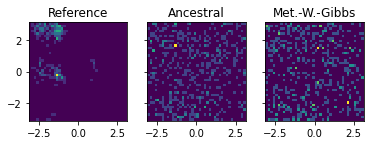

Epoch 585 Loss: -31906.027587890625


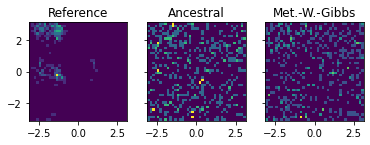

Epoch 586 Loss: -31958.97900390625


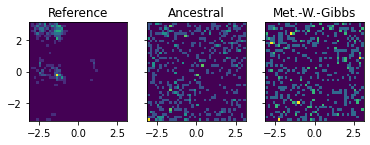

Epoch 587 Loss: -31950.319580078125


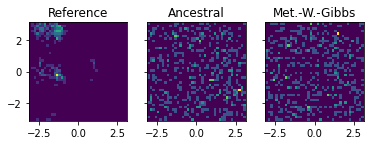

Epoch 588 Loss: -31920.916015625


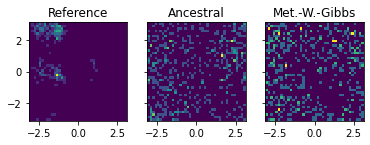

Epoch 589 Loss: -31937.160888671875


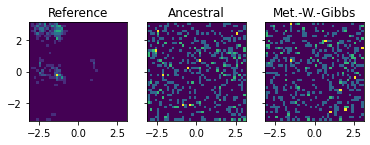

Epoch 590 Loss: -31918.656982421875


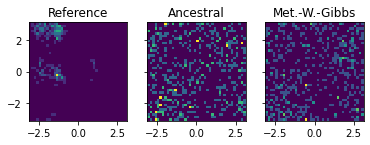

Epoch 591 Loss: -31996.27294921875


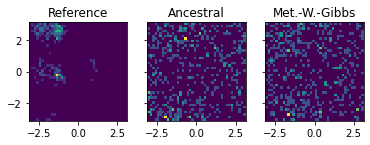

Epoch 592 Loss: -31993.11669921875


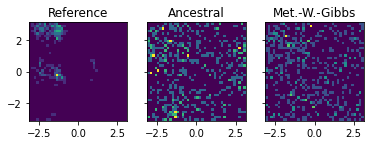

Epoch 593 Loss: -32283.838134765625


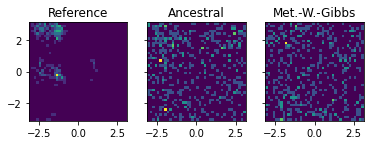

Epoch 594 Loss: -32322.719970703125


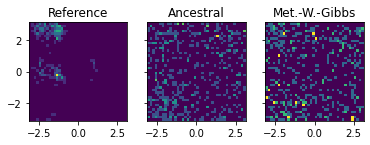

Epoch 595 Loss: -32252.8349609375


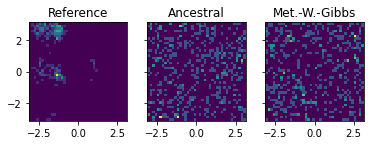

Epoch 596 Loss: -32338.80517578125


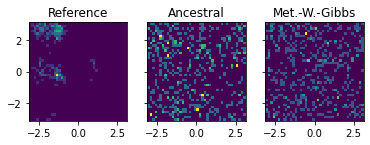

Epoch 597 Loss: -32282.730224609375


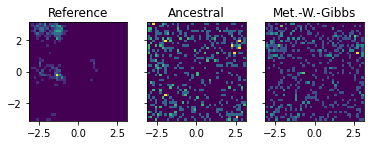

Epoch 598 Loss: -32061.813232421875


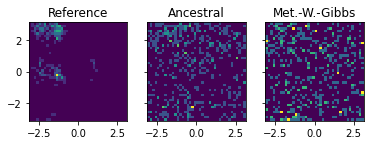

Epoch 599 Loss: -32086.8154296875


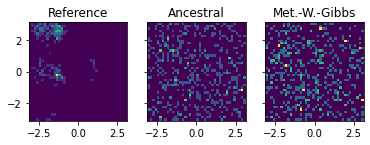

Epoch 600 Loss: -32234.781982421875


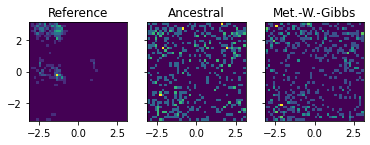

Epoch 601 Loss: -32231.5009765625


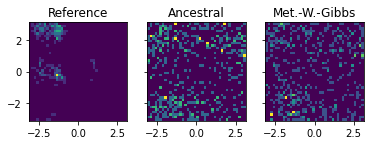

Epoch 602 Loss: -32287.858154296875


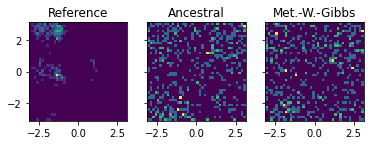

Epoch 603 Loss: -32476.69091796875


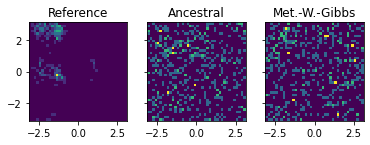

Epoch 604 Loss: -32148.79931640625


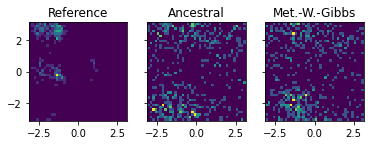

Epoch 605 Loss: -32199.319091796875


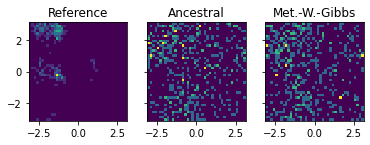

Epoch 606 Loss: -32176.305419921875


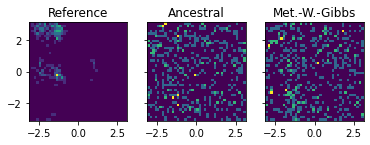

Epoch 607 Loss: -32444.819580078125


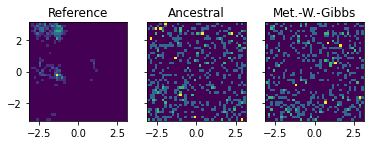

Epoch 608 Loss: -32573.298583984375


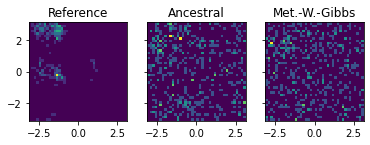

Epoch 609 Loss: -32712.036376953125


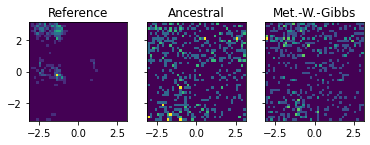

Epoch 610 Loss: -32729.57763671875


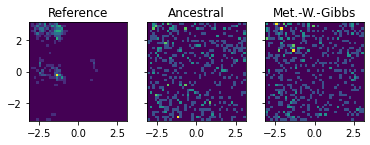

Epoch 611 Loss: -32708.1357421875


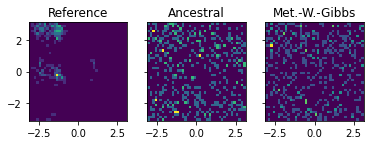

Epoch 612 Loss: -32323.927734375


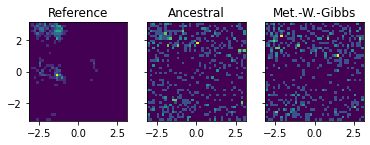

Epoch 613 Loss: -32724.013916015625


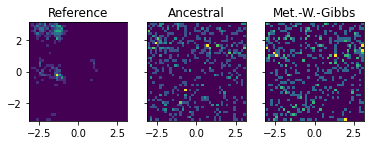

Epoch 614 Loss: -32756.369140625


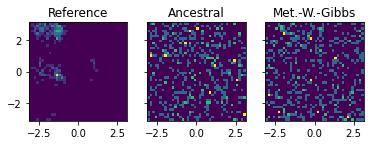

Epoch 615 Loss: -32549.923583984375


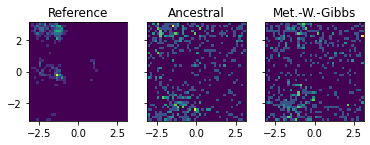

Epoch 616 Loss: -32705.3203125


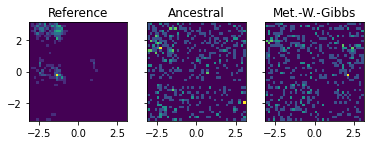

Epoch 617 Loss: -32800.319580078125


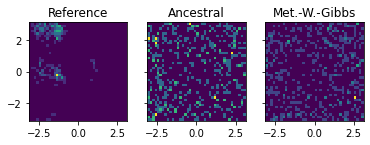

Epoch 618 Loss: -32805.4755859375


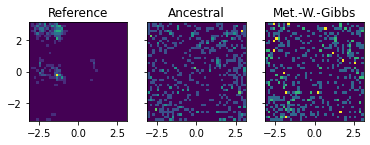

Epoch 619 Loss: -32825.5283203125


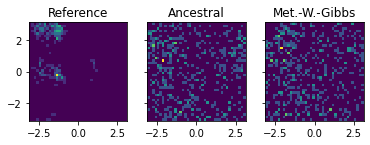

Epoch 620 Loss: -33097.45361328125


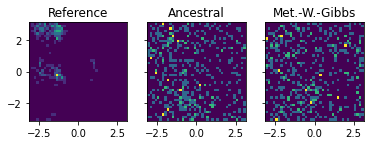

Epoch 621 Loss: -32932.930419921875


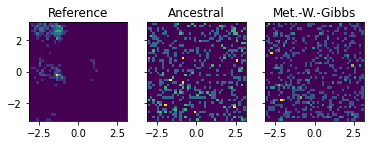

Epoch 622 Loss: -32581.7744140625


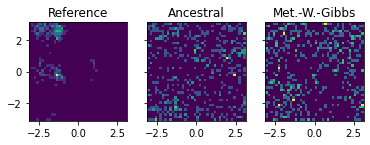

Epoch 623 Loss: -32797.447998046875


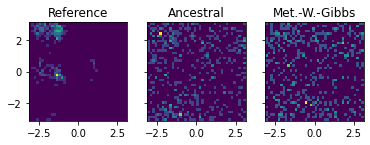

Epoch 624 Loss: -32931.6865234375


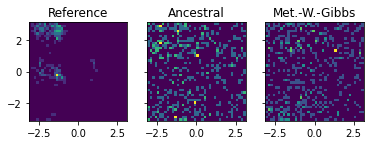

Epoch 625 Loss: -33183.65380859375


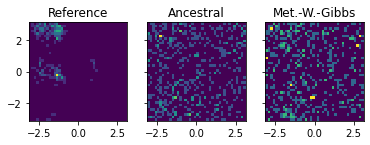

Epoch 626 Loss: -33259.5966796875


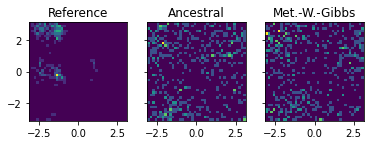

Epoch 627 Loss: -33221.808837890625


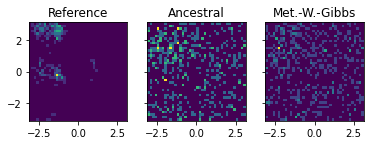

Epoch 628 Loss: -32985.482666015625


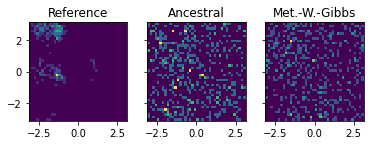

Epoch 629 Loss: -33285.995361328125


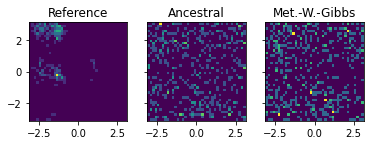

Epoch 630 Loss: -33282.651123046875


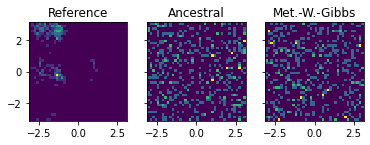

Epoch 631 Loss: -33315.25439453125


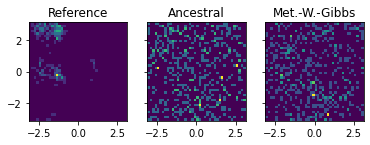

Epoch 632 Loss: -33202.27685546875


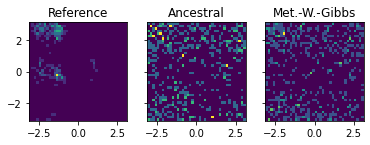

Epoch 633 Loss: -33305.96240234375


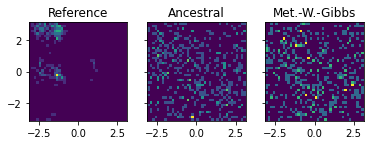

Epoch 634 Loss: -33255.621337890625


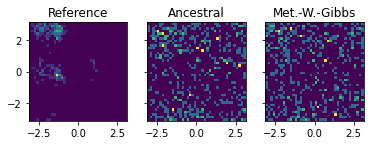

Epoch 635 Loss: -33419.905517578125


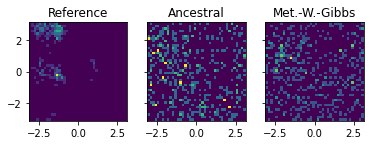

Epoch 636 Loss: -33439.58837890625


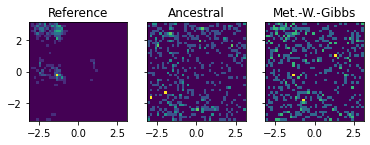

Epoch 637 Loss: -33313.161865234375


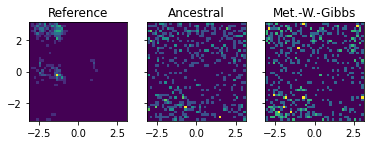

Epoch 638 Loss: -33466.68017578125


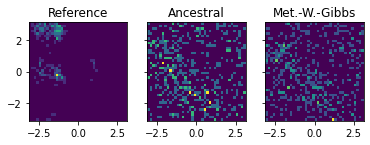

Epoch 639 Loss: -33203.97705078125


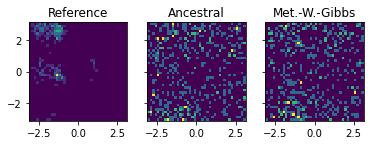

Epoch 640 Loss: -33287.4130859375


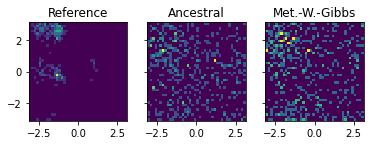

Epoch 641 Loss: -33555.706298828125


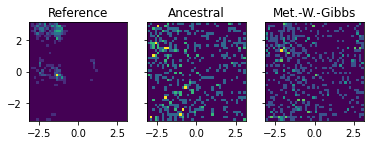

Epoch 642 Loss: -33633.993896484375


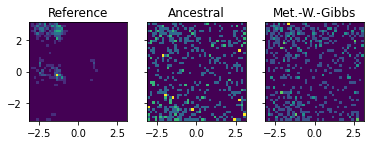

Epoch 643 Loss: -33669.54345703125


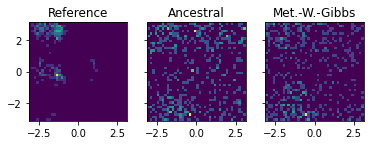

Epoch 644 Loss: -33724.759033203125


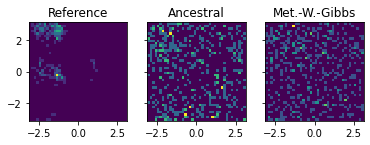

Epoch 645 Loss: -33931.663330078125


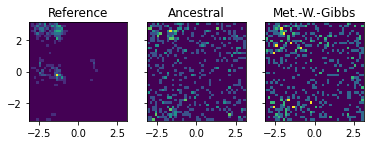

Epoch 646 Loss: -33963.2646484375


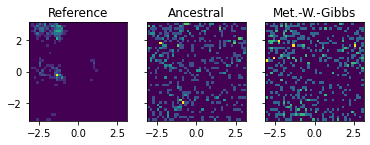

Epoch 647 Loss: -33857.641845703125


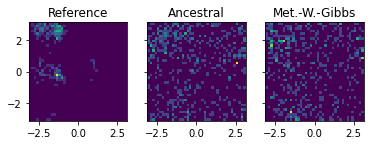

Epoch 648 Loss: -33769.3134765625


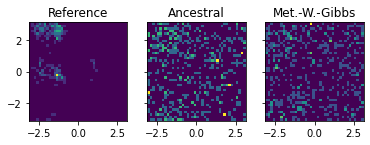

Epoch 649 Loss: -33796.949462890625


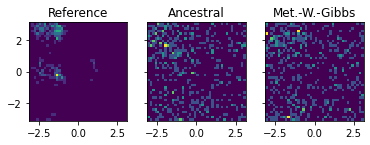

Epoch 650 Loss: -33885.345458984375


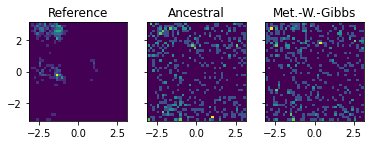

Epoch 651 Loss: -34006.18701171875


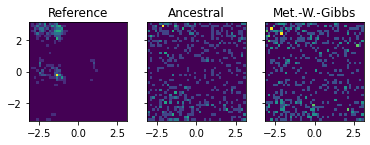

Epoch 652 Loss: -33786.38134765625


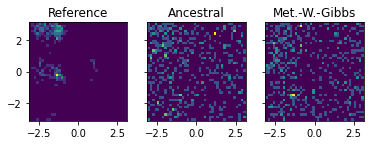

Epoch 653 Loss: -34032.753173828125


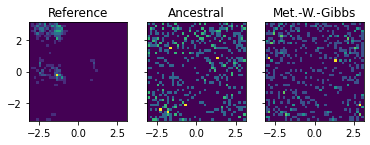

Epoch 654 Loss: -33771.451171875


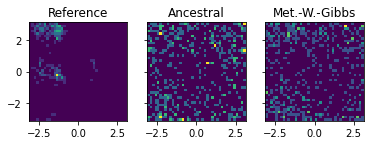

Epoch 655 Loss: -33786.394775390625


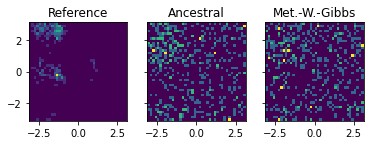

Epoch 656 Loss: -34042.180908203125


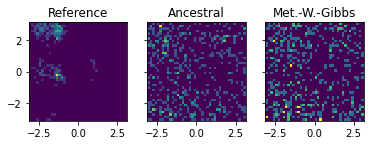

Epoch 657 Loss: -34066.965087890625


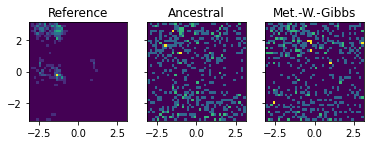

Epoch 658 Loss: -34058.51123046875


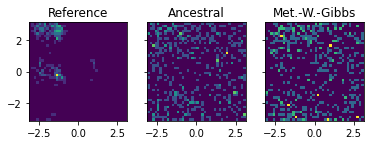

Epoch 659 Loss: -34078.31298828125


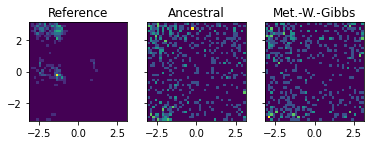

Epoch 660 Loss: -34028.49853515625


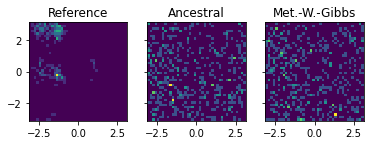

Epoch 661 Loss: -33900.0791015625


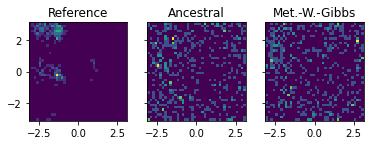

Epoch 662 Loss: -33640.46484375


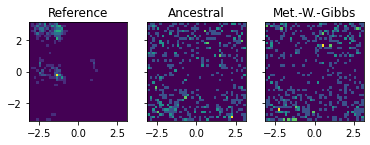

Epoch 663 Loss: -33792.162353515625


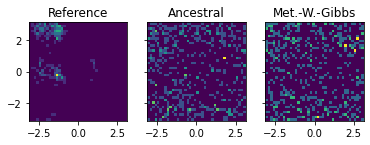

Epoch 664 Loss: -34096.225830078125


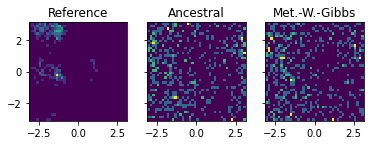

Epoch 665 Loss: -34164.25048828125


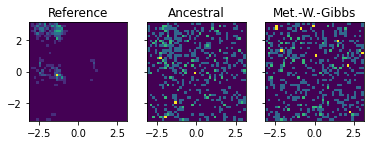

Epoch 666 Loss: -34090.425048828125


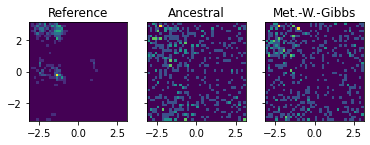

Epoch 667 Loss: -34176.503662109375


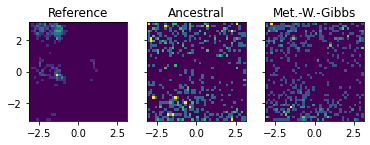

Epoch 668 Loss: -34318.68115234375


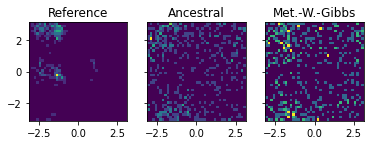

Epoch 669 Loss: -34360.24365234375


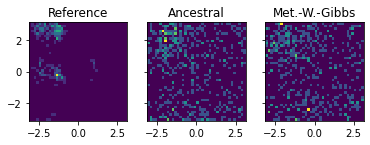

Epoch 670 Loss: -34352.140625


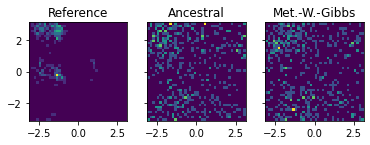

Epoch 671 Loss: -34536.601806640625


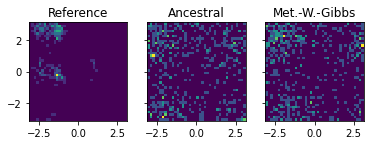

Epoch 672 Loss: -34409.16552734375


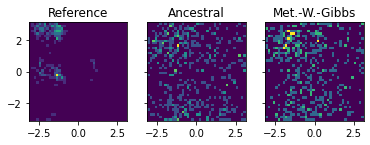

Epoch 673 Loss: -34395.874267578125


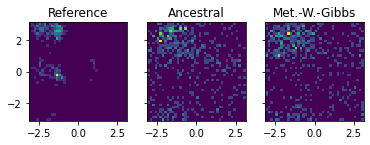

Epoch 674 Loss: -34156.622314453125


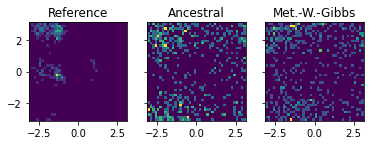

Epoch 675 Loss: -33935.626708984375


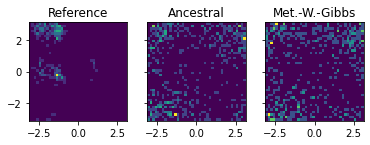

Epoch 676 Loss: -33936.846923828125


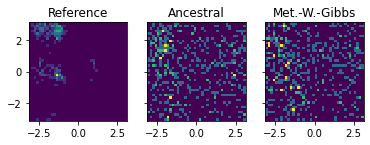

Epoch 677 Loss: -34289.96337890625


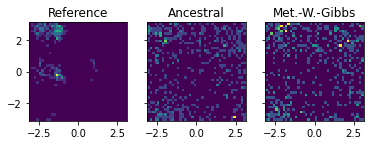

Epoch 678 Loss: -34403.7939453125


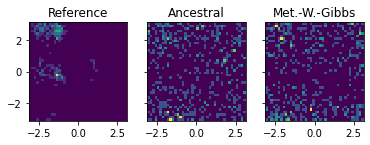

Epoch 679 Loss: -34575.36669921875


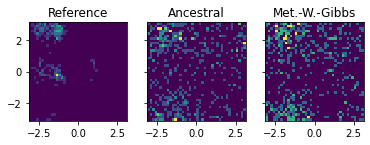

Epoch 680 Loss: -34492.264404296875


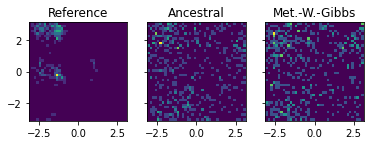

Epoch 681 Loss: -34617.027099609375


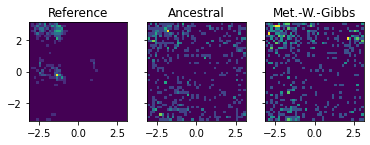

Epoch 682 Loss: -34711.42919921875


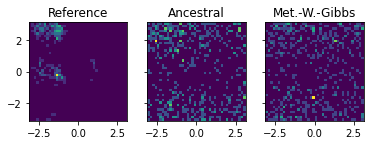

Epoch 683 Loss: -34635.85107421875


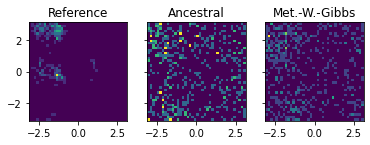

Epoch 684 Loss: -34394.994140625


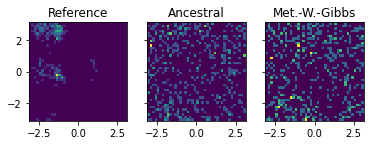

Epoch 685 Loss: -34606.63330078125


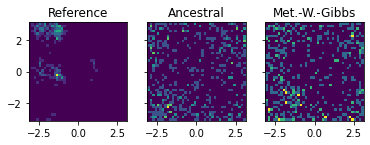

Epoch 686 Loss: -34334.536376953125


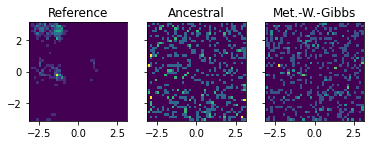

Epoch 687 Loss: -34468.849853515625


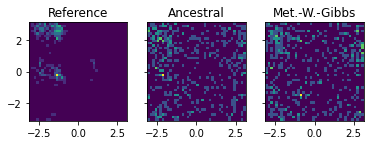

Epoch 688 Loss: -34801.5771484375


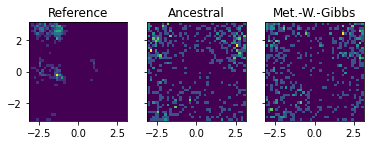

Epoch 689 Loss: -34813.9287109375


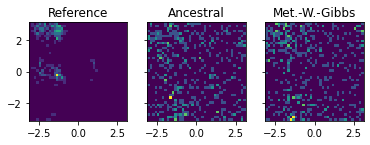

Epoch 690 Loss: -34949.640380859375


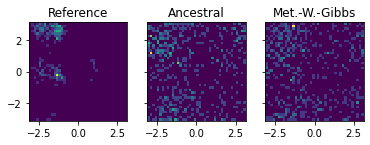

Epoch 691 Loss: -34590.18212890625


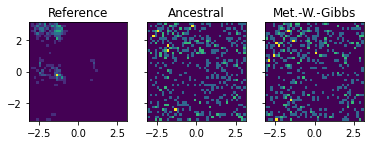

Epoch 692 Loss: -34779.703125


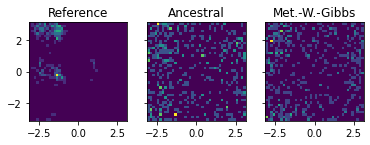

Epoch 693 Loss: -34729.08154296875


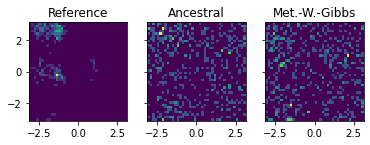

Epoch 694 Loss: -34681.931640625


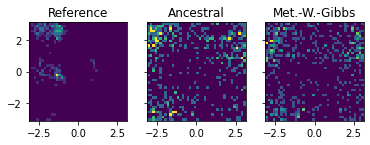

Epoch 695 Loss: -34613.63427734375


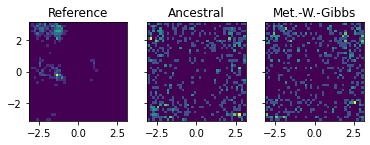

Epoch 696 Loss: -34223.323974609375


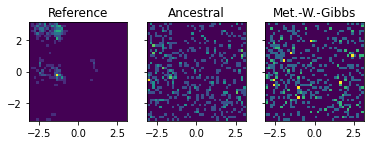

Epoch 697 Loss: -34627.509521484375


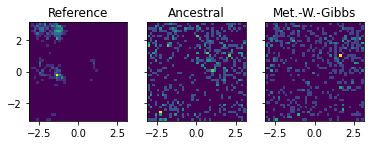

Epoch 698 Loss: -34280.65869140625


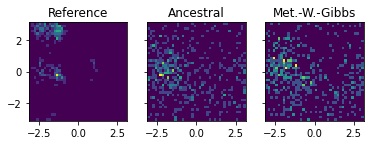

Epoch 699 Loss: -34480.489501953125


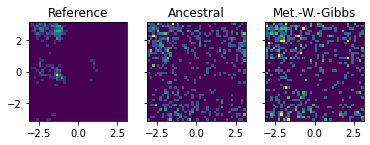

Epoch 700 Loss: -34841.967041015625


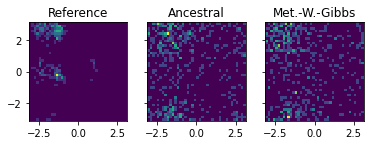

Epoch 701 Loss: -34989.67138671875


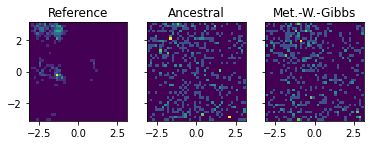

Epoch 702 Loss: -35102.2080078125


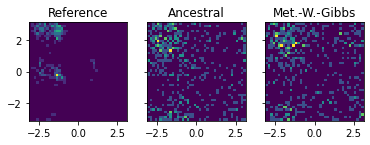

Epoch 703 Loss: -35102.499755859375


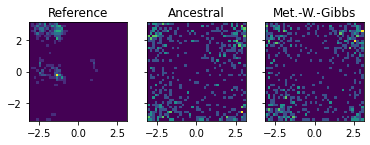

Epoch 704 Loss: -34951.703369140625


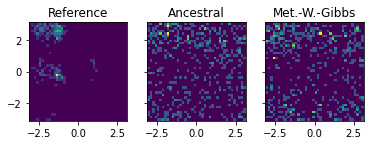

Epoch 705 Loss: -34919.8125


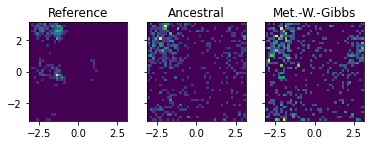

Epoch 706 Loss: -34753.4248046875


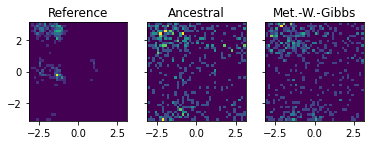

Epoch 707 Loss: -34984.506103515625


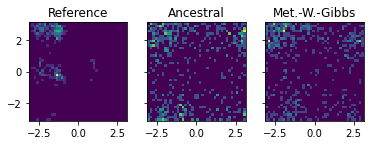

Epoch 708 Loss: -34933.496337890625


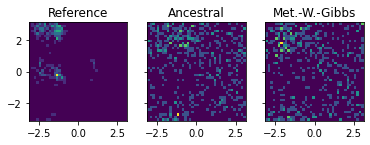

Epoch 709 Loss: -35018.591064453125


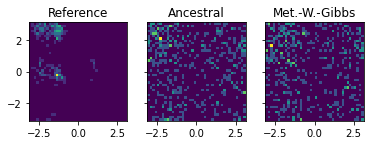

Epoch 710 Loss: -35204.587890625


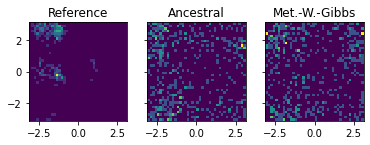

Epoch 711 Loss: -35295.5595703125


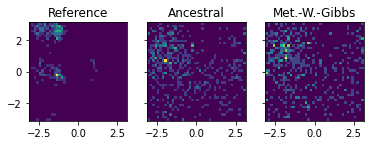

Epoch 712 Loss: -34937.00341796875


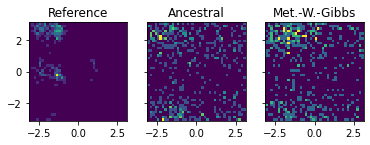

Epoch 713 Loss: -35238.00244140625


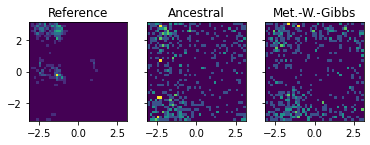

Epoch 714 Loss: -35363.73681640625


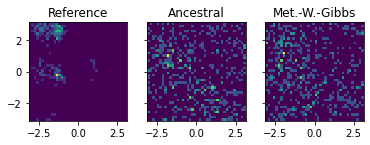

Epoch 715 Loss: -35261.3369140625


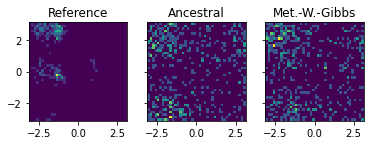

Epoch 716 Loss: -35195.459716796875


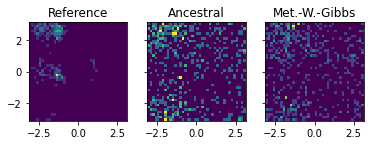

Epoch 717 Loss: -34900.716064453125


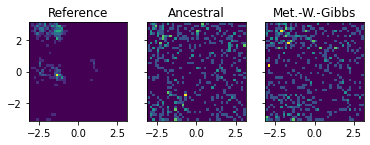

Epoch 718 Loss: -34542.32080078125


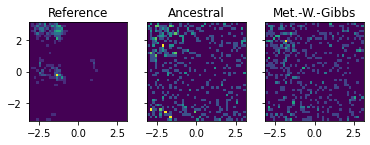

Epoch 719 Loss: -35001.83056640625


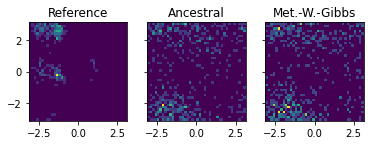

Epoch 720 Loss: -35017.06591796875


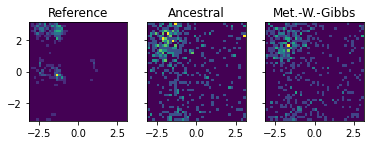

Epoch 721 Loss: -35136.76953125


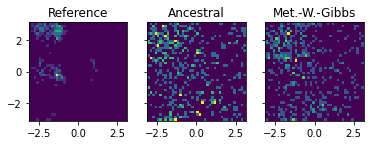

Epoch 722 Loss: -35400.095703125


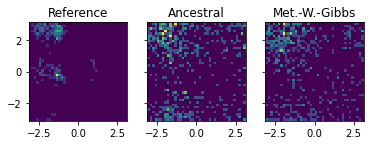

Epoch 723 Loss: -35536.804931640625


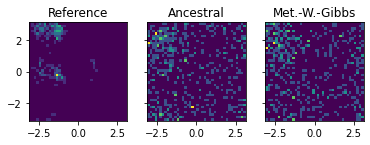

Epoch 724 Loss: -35171.79931640625


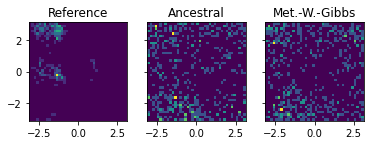

Epoch 725 Loss: -35167.575439453125


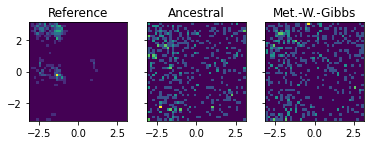

Epoch 726 Loss: -35009.497802734375


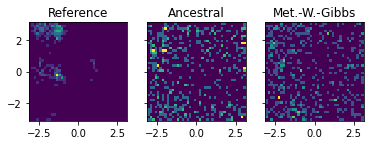

Epoch 727 Loss: -35353.80810546875


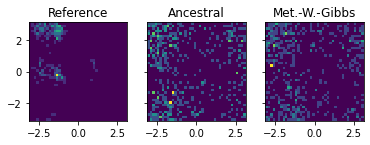

Epoch 728 Loss: -35249.18603515625


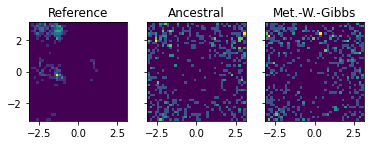

Epoch 729 Loss: -35474.052490234375


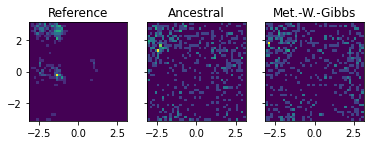

Epoch 730 Loss: -35471.99755859375


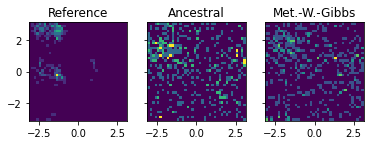

Epoch 731 Loss: -35582.692138671875


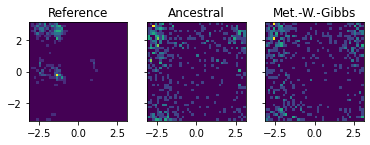

Epoch 732 Loss: -35822.306884765625


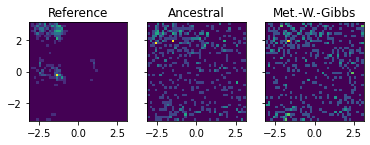

Epoch 733 Loss: -35770.018310546875


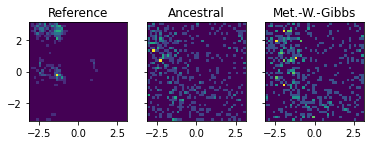

Epoch 734 Loss: -35547.7138671875


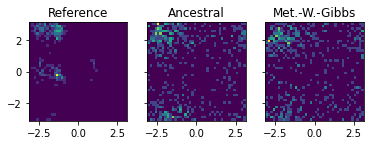

Epoch 735 Loss: -35573.804931640625


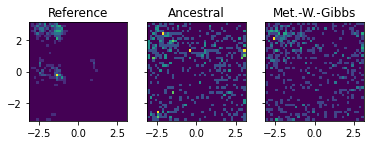

Epoch 736 Loss: -35653.701416015625


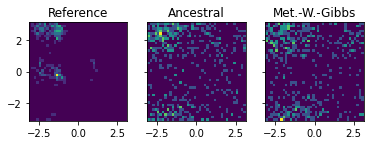

Epoch 737 Loss: -35676.18115234375


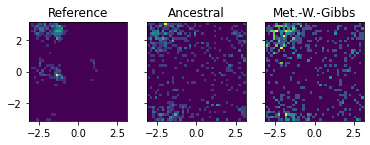

Epoch 738 Loss: -35526.368408203125


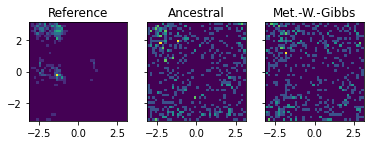

Epoch 739 Loss: -35334.5869140625


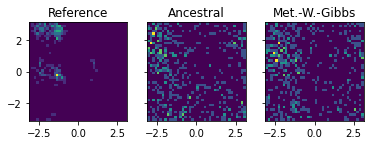

Epoch 740 Loss: -35461.116455078125


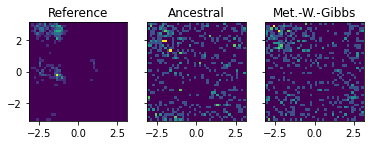

Epoch 741 Loss: -35726.8447265625


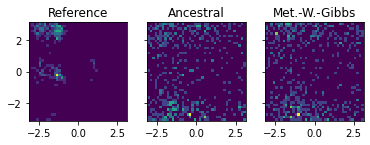

Epoch 742 Loss: -35852.389892578125


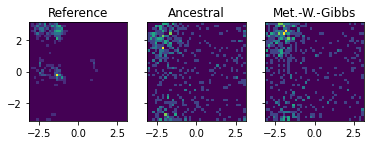

Epoch 743 Loss: -35965.468505859375


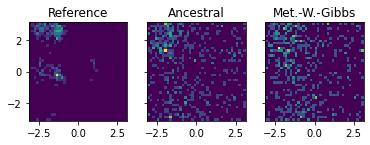

Epoch 744 Loss: -35999.1123046875


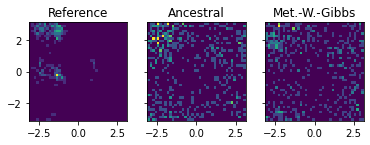

Epoch 745 Loss: -36007.769775390625


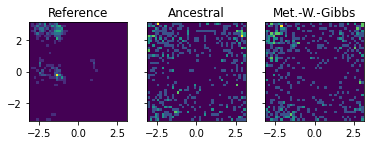

Epoch 746 Loss: -35900.80419921875


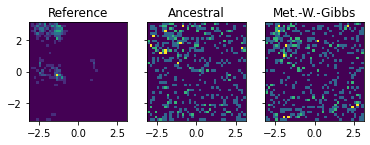

Epoch 747 Loss: -35769.975830078125


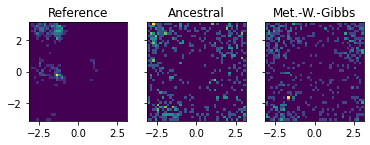

Epoch 748 Loss: -35777.3232421875


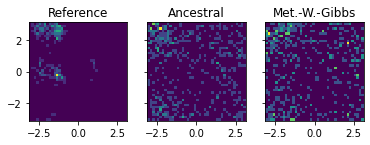

Epoch 749 Loss: -35965.290771484375


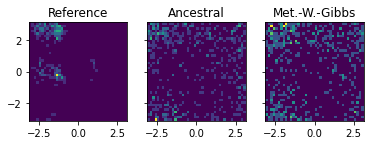

Epoch 750 Loss: -35824.92236328125


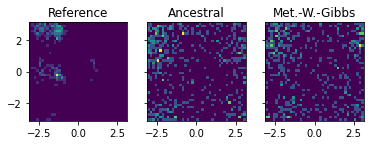

Epoch 751 Loss: -35867.0595703125


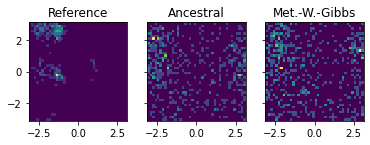

Epoch 752 Loss: -35900.9638671875


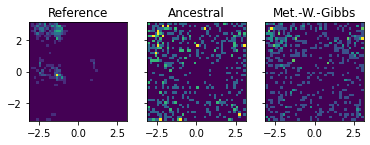

Epoch 753 Loss: -36017.509033203125


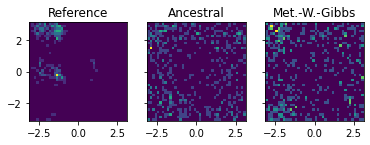

Epoch 754 Loss: -35992.64892578125


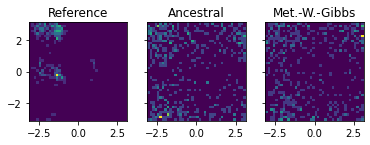

Epoch 755 Loss: -35915.84130859375


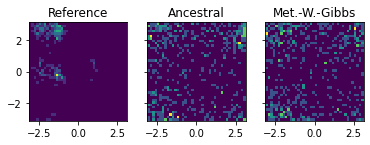

Epoch 756 Loss: -35685.703125


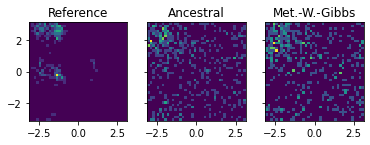

Epoch 757 Loss: -35840.943603515625


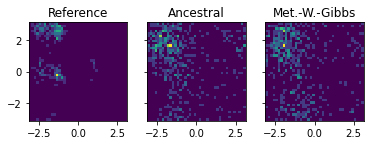

Epoch 758 Loss: -35536.377685546875


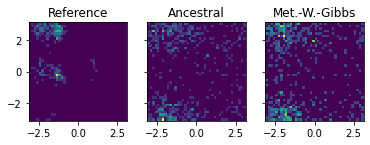

Epoch 759 Loss: -35655.6328125


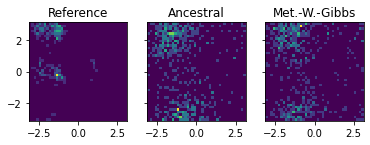

Epoch 760 Loss: -35549.412841796875


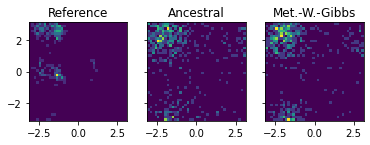

Epoch 761 Loss: -35856.19970703125


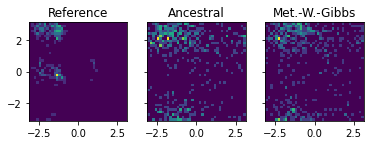

Epoch 762 Loss: -35949.188720703125


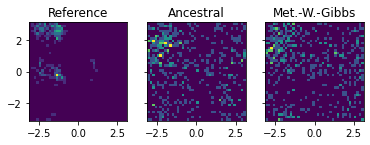

Epoch 763 Loss: -36132.309326171875


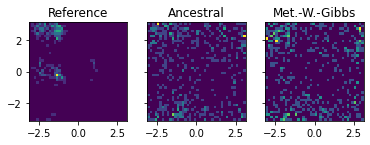

Epoch 764 Loss: -35754.6923828125


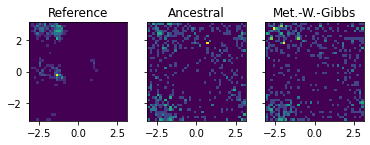

Epoch 765 Loss: -35459.4697265625


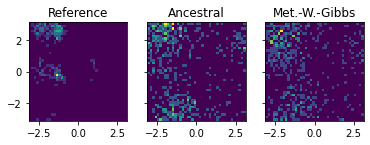

Epoch 766 Loss: -35765.82861328125


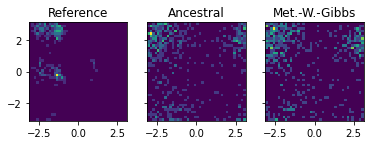

Epoch 767 Loss: -35771.926025390625


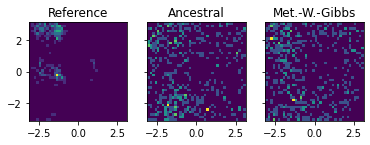

Epoch 768 Loss: -35913.71923828125


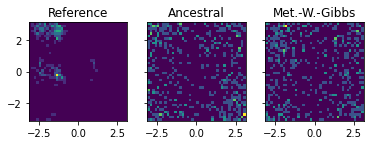

Epoch 769 Loss: -36319.102783203125


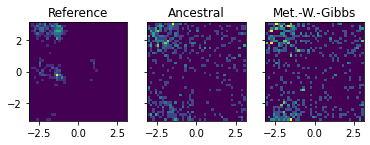

Epoch 770 Loss: -35572.7255859375


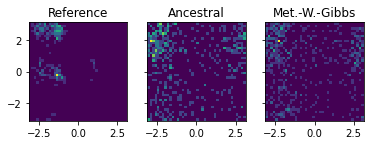

Epoch 771 Loss: -36006.65283203125


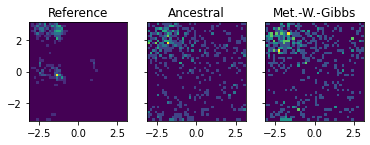

Epoch 772 Loss: -36100.60009765625


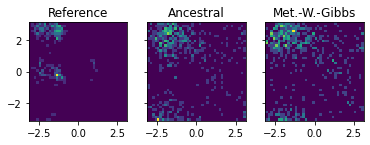

Epoch 773 Loss: -36088.60888671875


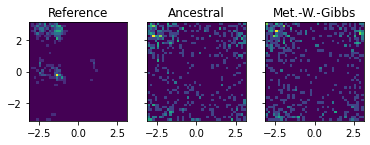

Epoch 774 Loss: -36111.165771484375


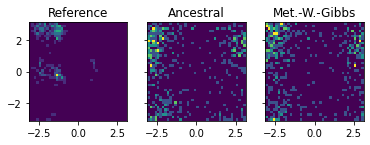

Epoch 775 Loss: -36147.8701171875


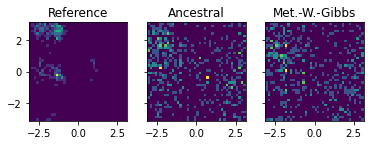

Epoch 776 Loss: -36139.18017578125


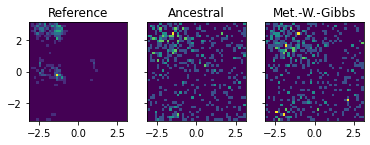

Epoch 777 Loss: -36218.31201171875


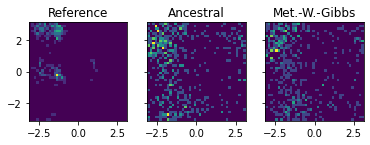

Epoch 778 Loss: -35717.52392578125


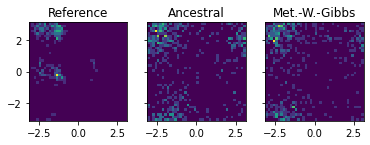

Epoch 779 Loss: -35290.383056640625


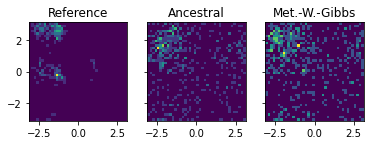

Epoch 780 Loss: -35585.261962890625


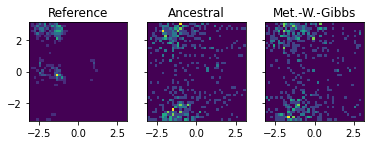

Epoch 781 Loss: -36206.193115234375


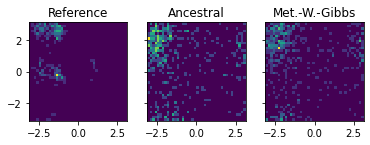

Epoch 782 Loss: -36221.343994140625


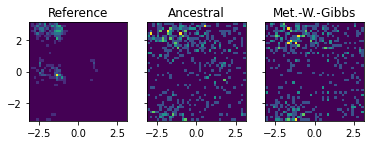

Epoch 783 Loss: -35920.464599609375


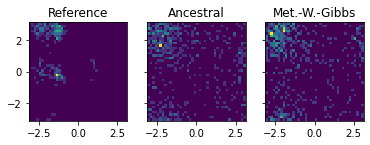

Epoch 784 Loss: -36093.150390625


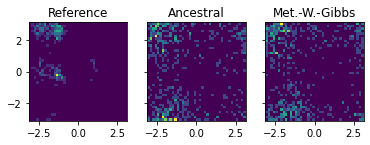

Epoch 785 Loss: -36038.96044921875


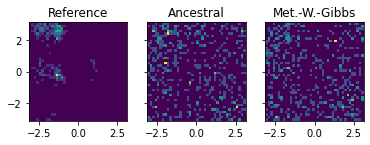

Epoch 786 Loss: -36375.56201171875


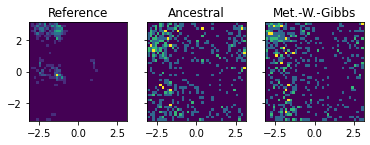

Epoch 787 Loss: -36492.39306640625


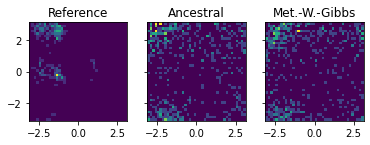

Epoch 788 Loss: -36526.77734375


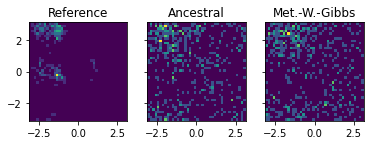

Epoch 789 Loss: -36599.560546875


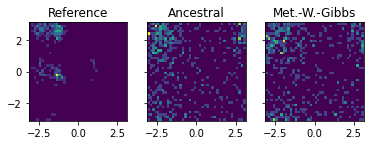

Epoch 790 Loss: -36580.6357421875


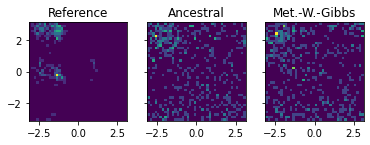

Epoch 791 Loss: -36716.93505859375


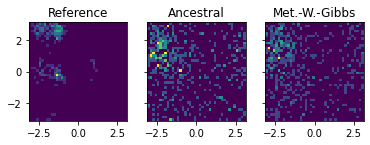

Epoch 792 Loss: -36016.8857421875


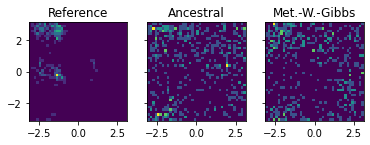

Epoch 793 Loss: -36519.318359375


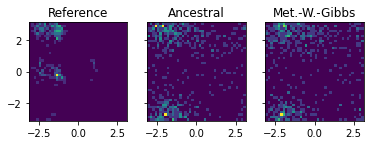

Epoch 794 Loss: -36471.557861328125


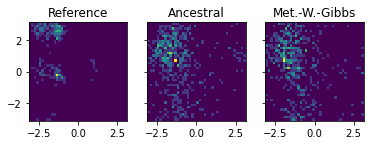

Epoch 795 Loss: -36021.7314453125


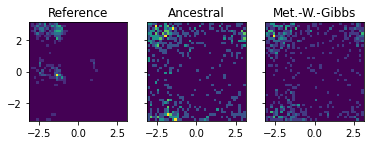

Epoch 796 Loss: -36168.20361328125


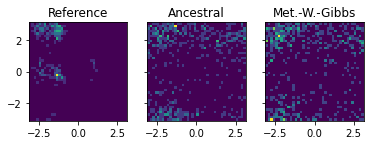

Epoch 797 Loss: -36307.393798828125


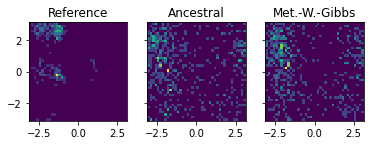

Epoch 798 Loss: -36247.39404296875


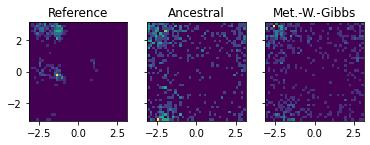

Epoch 799 Loss: -36535.935546875


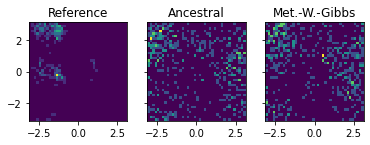

Epoch 800 Loss: -36846.3603515625


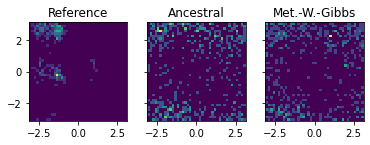

Epoch 801 Loss: -36873.246337890625


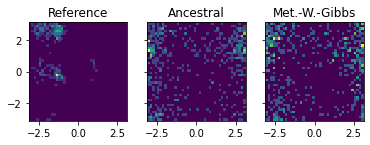

Epoch 802 Loss: -36177.39404296875


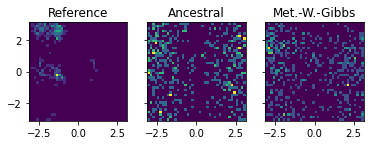

Epoch 803 Loss: -36655.785888671875


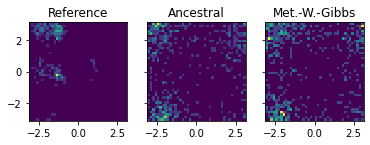

Epoch 804 Loss: -36392.58935546875


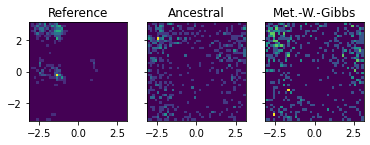

Epoch 805 Loss: -36521.1064453125


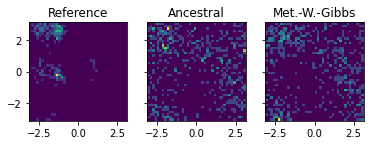

Epoch 806 Loss: -36484.171875


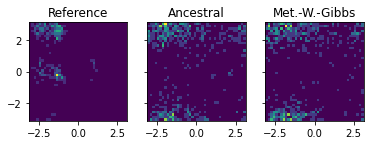

Epoch 807 Loss: -36380.980224609375


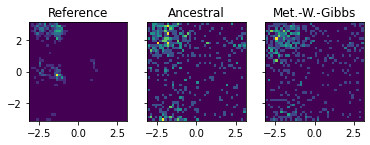

Epoch 808 Loss: -36402.206787109375


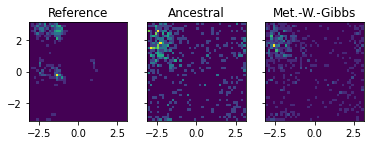

Epoch 809 Loss: -36797.618408203125


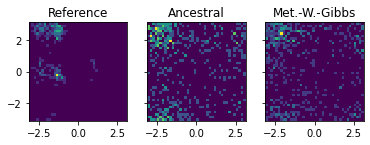

Epoch 810 Loss: -36942.539794921875


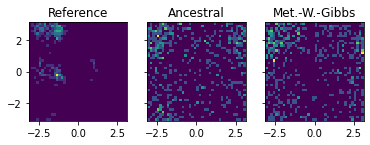

Epoch 811 Loss: -36772.174560546875


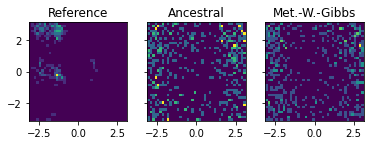

Epoch 812 Loss: -36431.64501953125


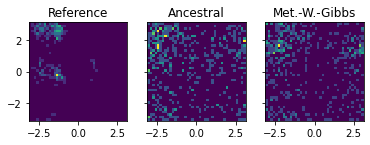

Epoch 813 Loss: -36391.241943359375


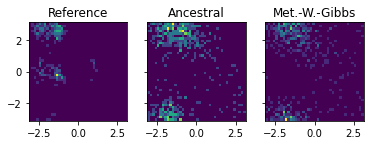

Epoch 814 Loss: -36354.26123046875


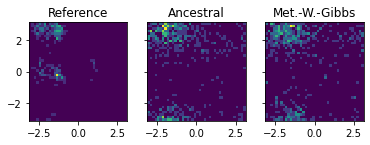

Epoch 815 Loss: -36355.521728515625


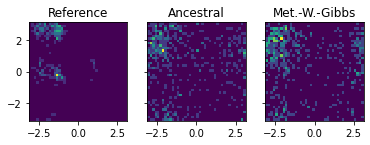

Epoch 816 Loss: -36212.69873046875


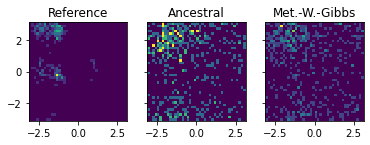

Epoch 817 Loss: -36515.07275390625


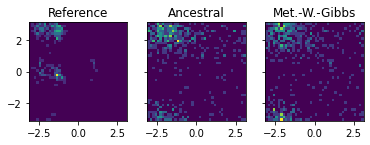

Epoch 818 Loss: -36828.29345703125


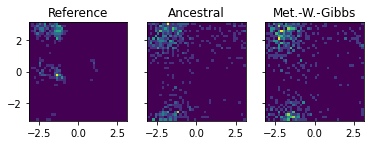

Epoch 819 Loss: -37002.569091796875


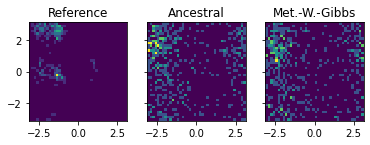

Epoch 820 Loss: -36865.7607421875


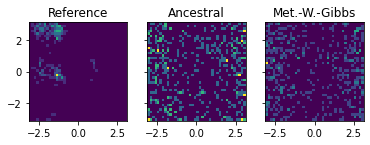

Epoch 821 Loss: -37088.369384765625


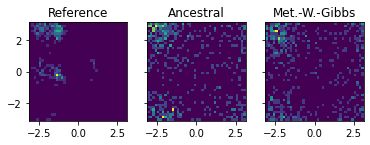

Epoch 822 Loss: -37085.533447265625


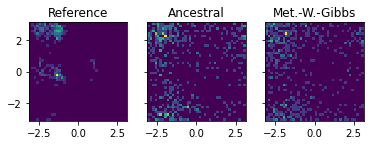

Epoch 823 Loss: -37130.8203125


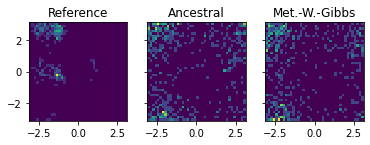

Epoch 824 Loss: -37053.842041015625


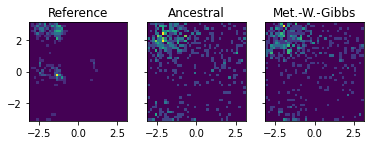

Epoch 825 Loss: -36973.3193359375


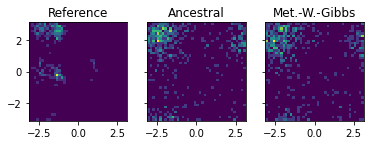

Epoch 826 Loss: -37031.28759765625


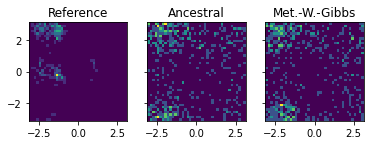

Epoch 827 Loss: -36860.0361328125


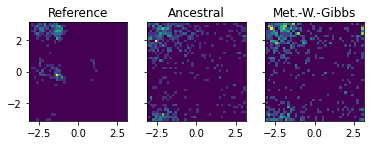

Epoch 828 Loss: -36792.22802734375


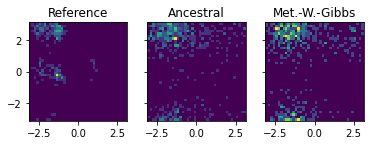

Epoch 829 Loss: -36982.1416015625


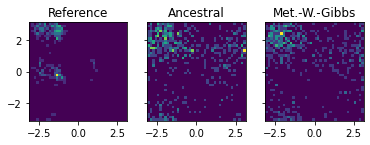

Epoch 830 Loss: -36993.493896484375


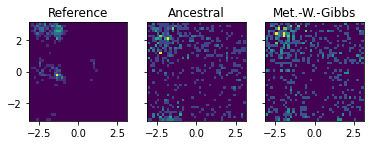

Epoch 831 Loss: -36903.25146484375


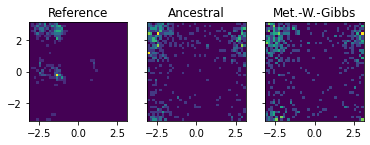

Epoch 832 Loss: -36808.650634765625


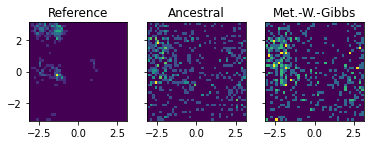

Epoch 833 Loss: -36819.041748046875


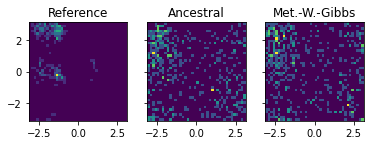

Epoch 834 Loss: -37035.0556640625


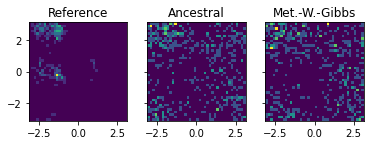

Epoch 835 Loss: -36592.41650390625


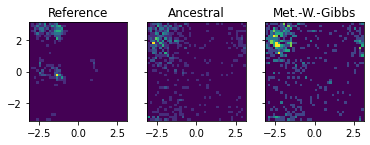

Epoch 836 Loss: -37043.734619140625


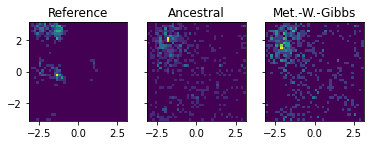

Epoch 837 Loss: -37318.3828125


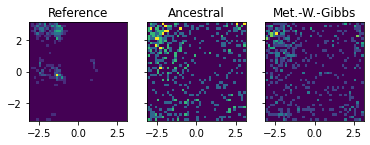

Epoch 838 Loss: -37117.541259765625


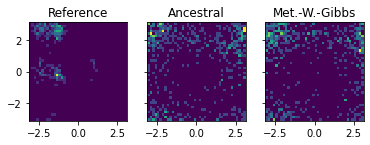

Epoch 839 Loss: -37347.994140625


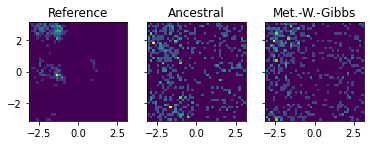

Epoch 840 Loss: -37252.35888671875


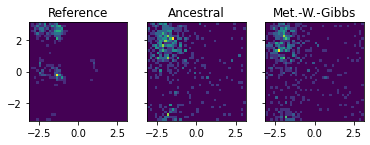

Epoch 841 Loss: -36723.244140625


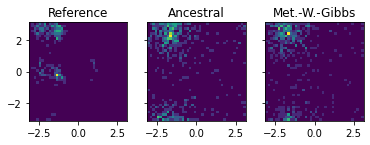

Epoch 842 Loss: -36879.521728515625


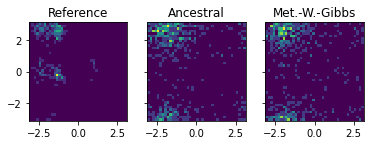

Epoch 843 Loss: -36999.5380859375


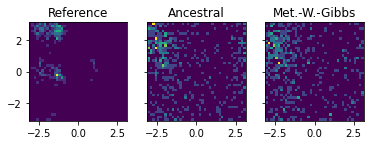

Epoch 844 Loss: -36706.4462890625


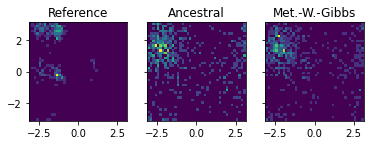

Epoch 845 Loss: -37134.78515625


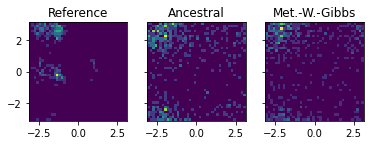

Epoch 846 Loss: -36896.498779296875


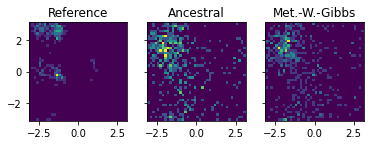

Epoch 847 Loss: -36941.30224609375


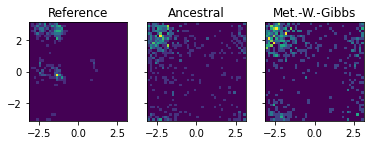

Epoch 848 Loss: -37069.663818359375


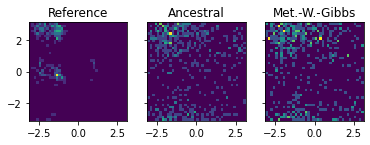

Epoch 849 Loss: -37273.220947265625


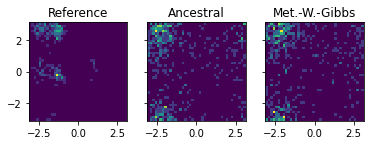

Epoch 850 Loss: -37373.83203125


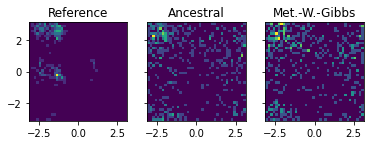

Epoch 851 Loss: -37347.4404296875


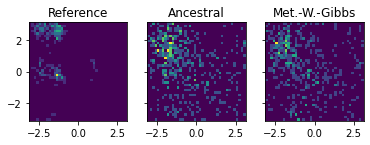

Epoch 852 Loss: -37015.653076171875


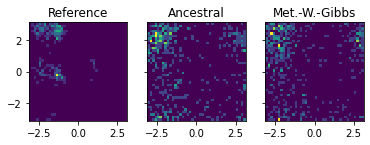

Epoch 853 Loss: -36939.44921875


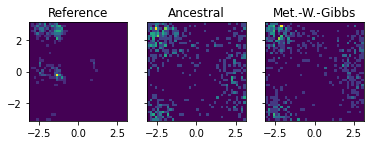

Epoch 854 Loss: -36619.037109375


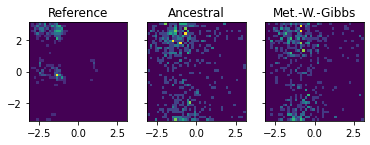

Epoch 855 Loss: -36916.5634765625


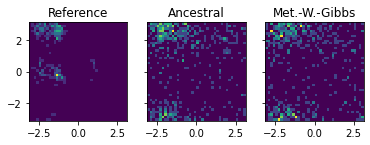

Epoch 856 Loss: -36820.1845703125


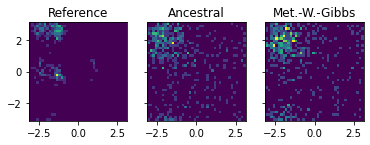

Epoch 857 Loss: -37084.724609375


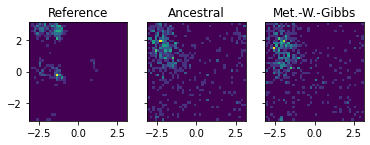

Epoch 858 Loss: -37210.3994140625


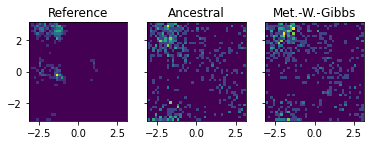

Epoch 859 Loss: -37390.457275390625


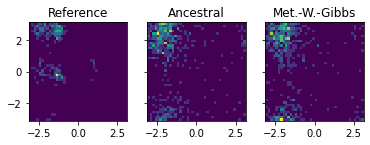

Epoch 860 Loss: -37295.085205078125


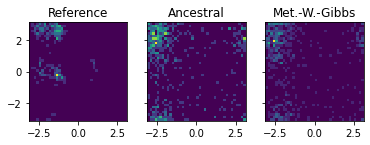

Epoch 861 Loss: -37286.945068359375


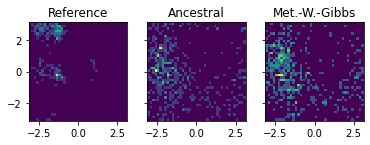

Epoch 862 Loss: -36875.00537109375


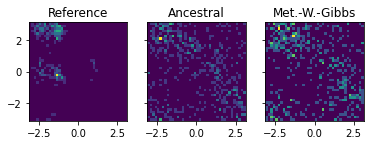

Epoch 863 Loss: -36520.701416015625


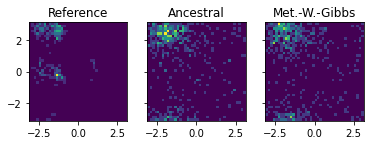

Epoch 864 Loss: -37012.641357421875


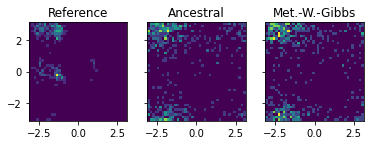

Epoch 865 Loss: -37089.471923828125


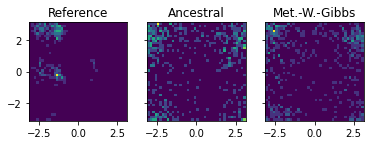

Epoch 866 Loss: -36969.132568359375


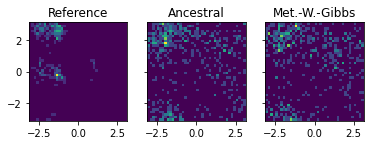

Epoch 867 Loss: -37291.837890625


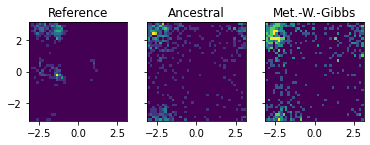

Epoch 868 Loss: -37254.22607421875


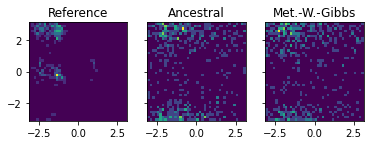

Epoch 869 Loss: -37390.92041015625


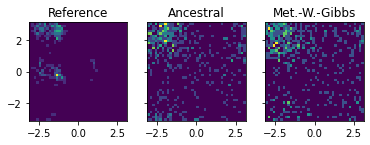

Epoch 870 Loss: -37360.552978515625


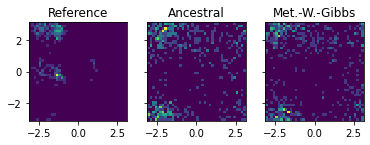

Epoch 871 Loss: -37287.97412109375


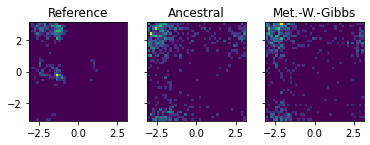

Epoch 872 Loss: -37383.234375


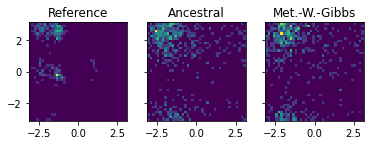

Epoch 873 Loss: -37341.95361328125


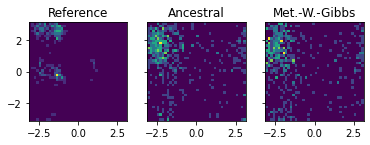

Epoch 874 Loss: -37177.41015625


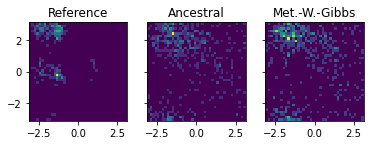

Epoch 875 Loss: -37164.927490234375


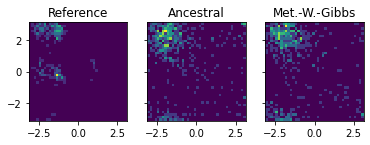

Epoch 876 Loss: -37341.9287109375


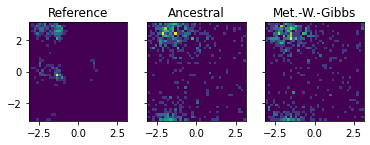

Epoch 877 Loss: -37395.373046875


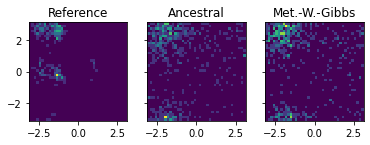

Epoch 878 Loss: -37676.73583984375


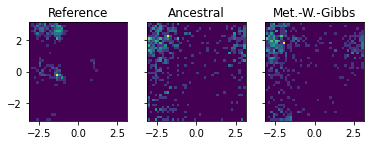

Epoch 879 Loss: -37469.53125


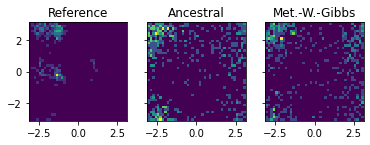

Epoch 880 Loss: -37505.72119140625


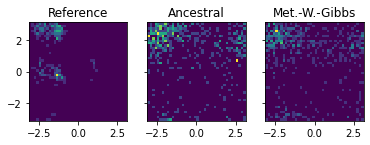

Epoch 881 Loss: -37432.66259765625


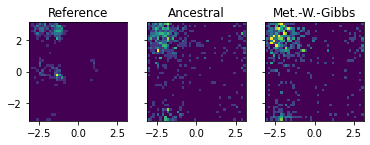

Epoch 882 Loss: -37485.37548828125


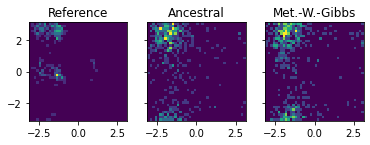

Epoch 883 Loss: -37728.769775390625


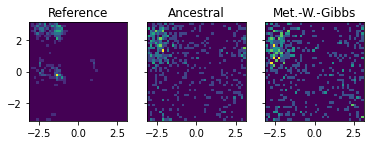

Epoch 884 Loss: -37453.4228515625


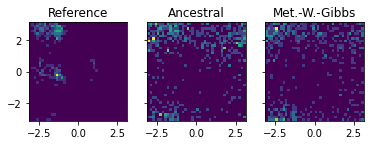

Epoch 885 Loss: -37405.44384765625


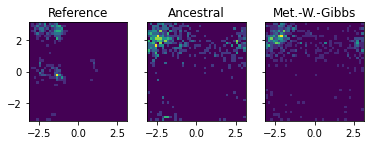

Epoch 886 Loss: -37500.66650390625


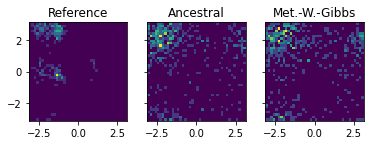

Epoch 887 Loss: -37890.74462890625


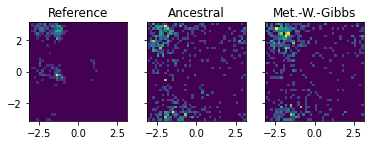

Epoch 888 Loss: -37629.69091796875


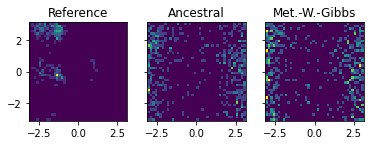

Epoch 889 Loss: -37382.277099609375


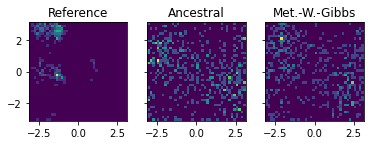

Epoch 890 Loss: -37480.88330078125


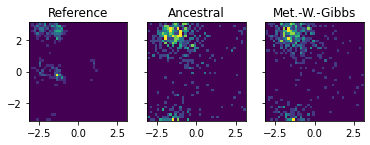

Epoch 891 Loss: -37368.970458984375


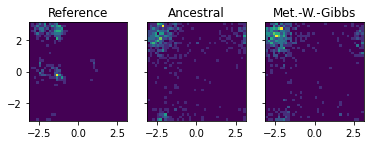

Epoch 892 Loss: -37492.5400390625


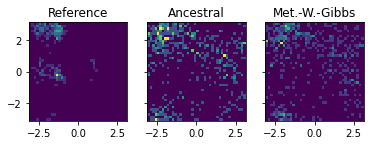

Epoch 893 Loss: -37744.96826171875


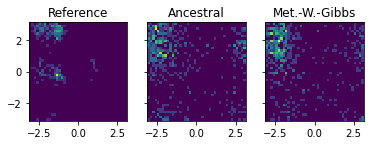

Epoch 894 Loss: -37896.373779296875


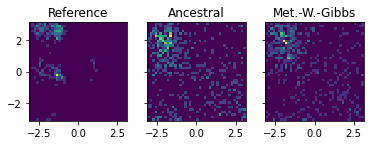

Epoch 895 Loss: -37458.837890625


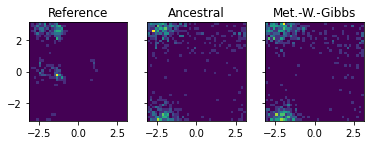

Epoch 896 Loss: -37074.186767578125


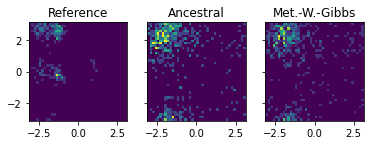

Epoch 897 Loss: -37182.148681640625


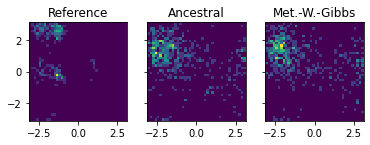

Epoch 898 Loss: -37730.787353515625


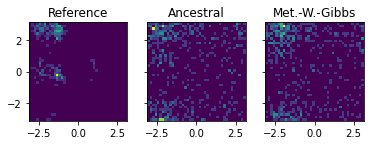

Epoch 899 Loss: -38034.6982421875


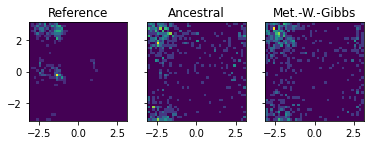

Epoch 900 Loss: -37883.20654296875


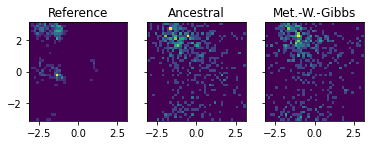

Epoch 901 Loss: -37347.505859375


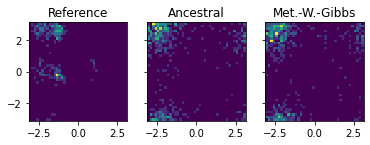

Epoch 902 Loss: -37394.451171875


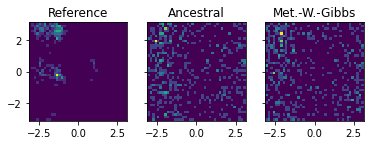

Epoch 903 Loss: -37699.981201171875


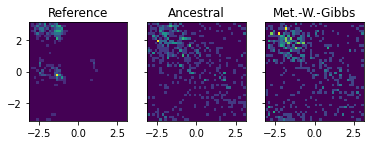

Epoch 904 Loss: -37370.40966796875


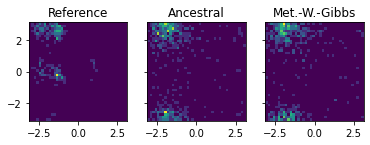

Epoch 905 Loss: -37549.33544921875


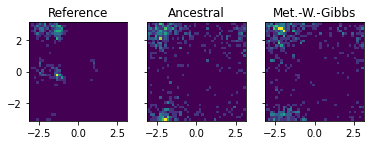

Epoch 906 Loss: -37533.0009765625


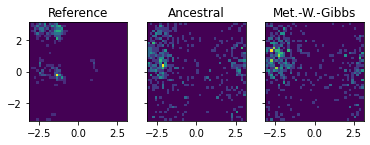

Epoch 907 Loss: -37270.46630859375


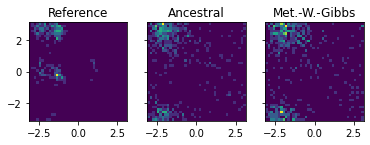

Epoch 908 Loss: -37438.193359375


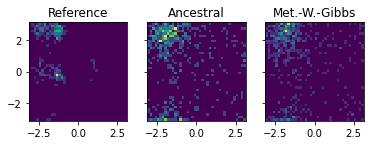

Epoch 909 Loss: -37822.11376953125


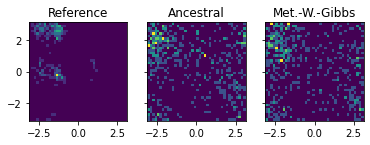

Epoch 910 Loss: -37866.59130859375


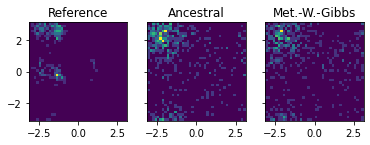

Epoch 911 Loss: -37954.460205078125


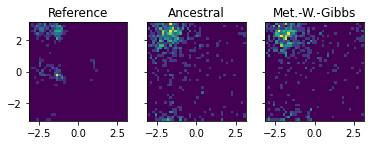

Epoch 912 Loss: -37936.908203125


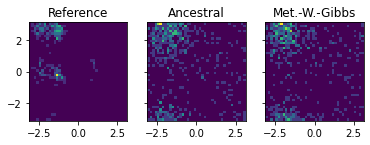

Epoch 913 Loss: -37967.21435546875


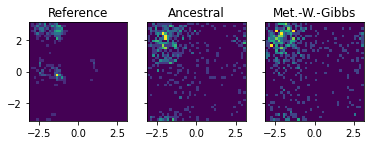

Epoch 914 Loss: -37888.8125


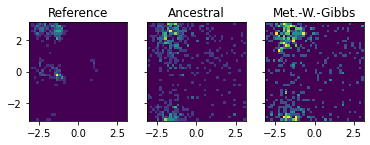

Epoch 915 Loss: -37309.252197265625


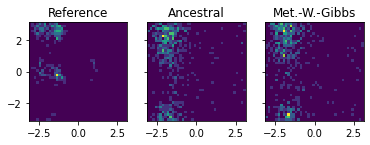

Epoch 916 Loss: -37328.98828125


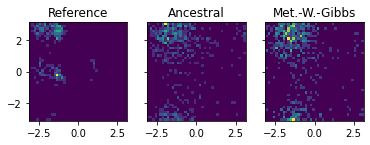

Epoch 917 Loss: -37352.757568359375


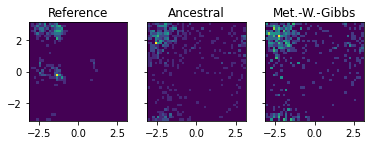

Epoch 918 Loss: -37564.9892578125


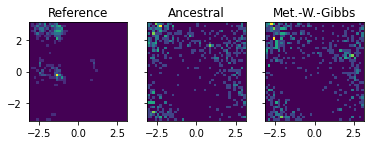

Epoch 919 Loss: -36837.978759765625


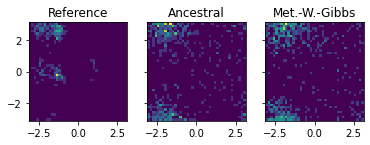

Epoch 920 Loss: -36935.77294921875


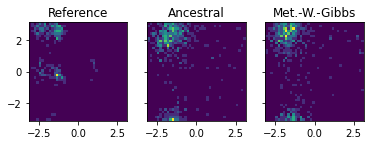

Epoch 921 Loss: -37027.275390625


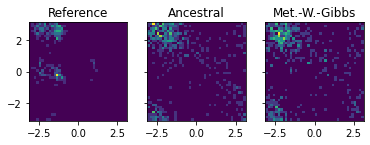

Epoch 922 Loss: -36682.9775390625


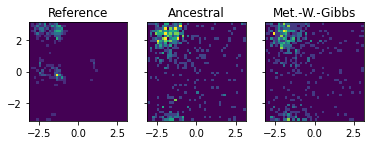

Epoch 923 Loss: -37367.76513671875


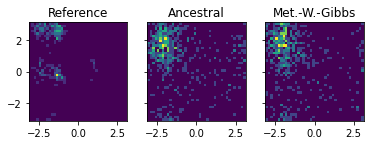

Epoch 924 Loss: -37687.804931640625


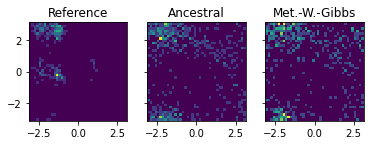

Epoch 925 Loss: -37304.46728515625


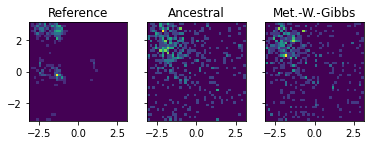

Epoch 926 Loss: -37785.275390625


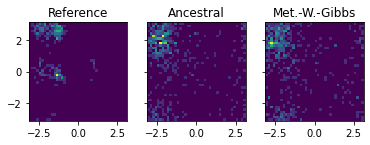

Epoch 927 Loss: -37848.9970703125


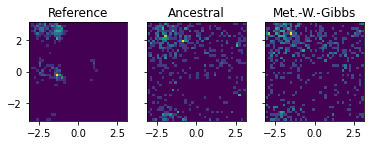

Epoch 928 Loss: -37695.852294921875


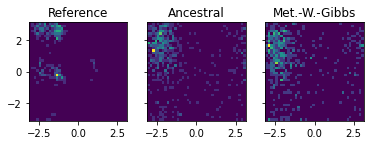

Epoch 929 Loss: -37497.7900390625


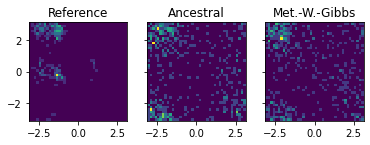

Epoch 930 Loss: -37896.32861328125


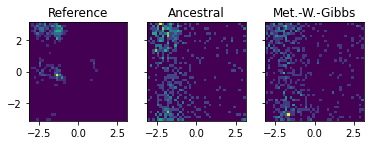

Epoch 931 Loss: -38199.85791015625


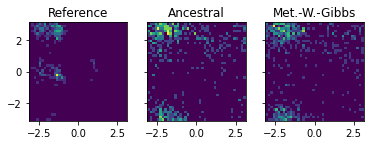

Epoch 932 Loss: -38111.6005859375


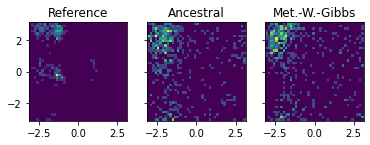

Epoch 933 Loss: -37884.85595703125


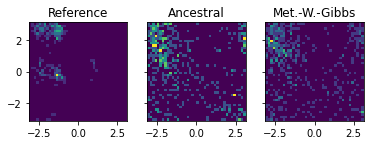

Epoch 934 Loss: -37875.42431640625


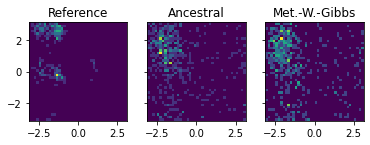

Epoch 935 Loss: -37925.881591796875


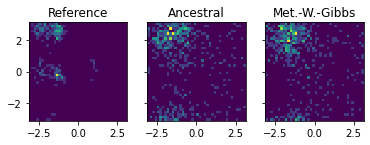

Epoch 936 Loss: -37886.33251953125


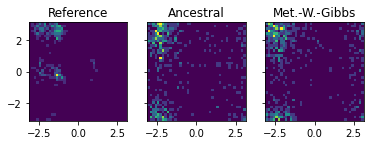

Epoch 937 Loss: -38068.54931640625


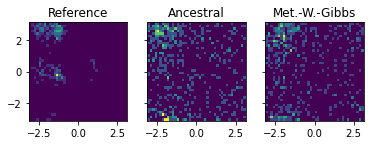

Epoch 938 Loss: -37742.4443359375


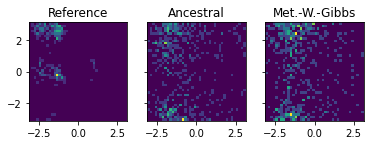

Epoch 939 Loss: -37808.899169921875


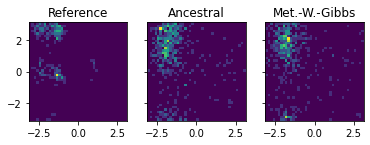

Epoch 940 Loss: -38018.590087890625


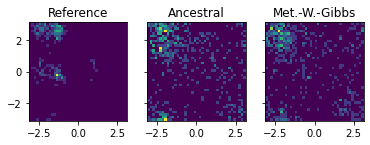

Epoch 941 Loss: -38147.931884765625


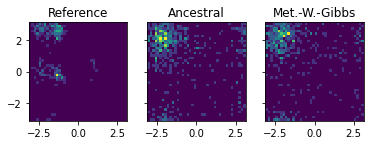

Epoch 942 Loss: -38239.91357421875


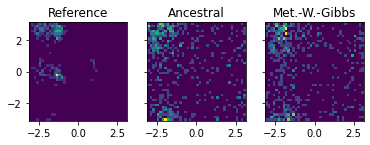

Epoch 943 Loss: -38112.126708984375


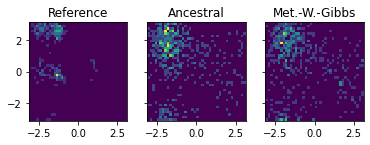

Epoch 944 Loss: -37938.830078125


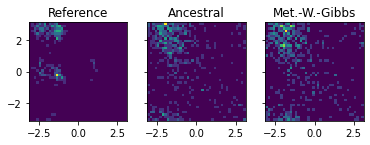

Epoch 945 Loss: -37760.768310546875


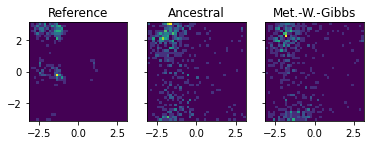

Epoch 946 Loss: -37917.037841796875


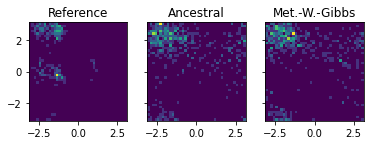

Epoch 947 Loss: -38103.766357421875


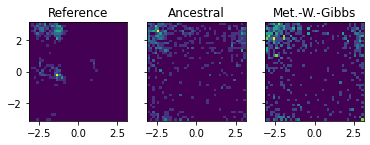

Epoch 948 Loss: -38100.537353515625


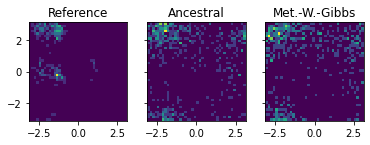

Epoch 949 Loss: -37932.740234375


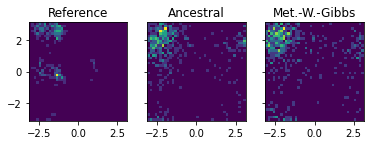

Epoch 950 Loss: -38177.737548828125


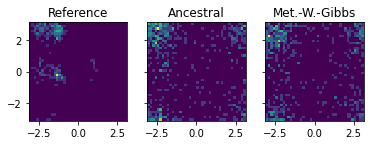

Epoch 951 Loss: -38078.11572265625


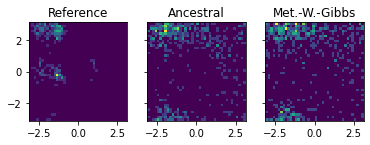

Epoch 952 Loss: -38101.31103515625


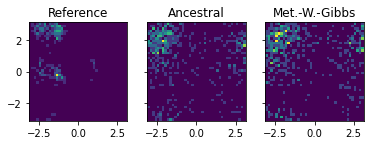

Epoch 953 Loss: -38341.091796875


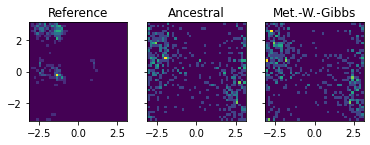

Epoch 954 Loss: -37490.841552734375


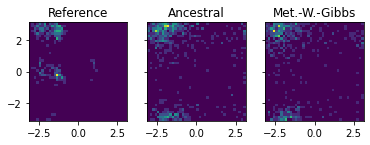

Epoch 955 Loss: -37225.1875


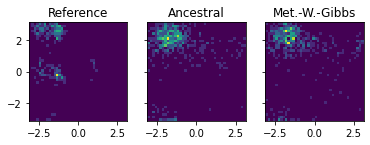

Epoch 956 Loss: -37109.1591796875


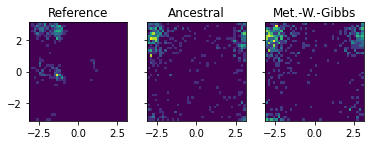

Epoch 957 Loss: -37547.0595703125


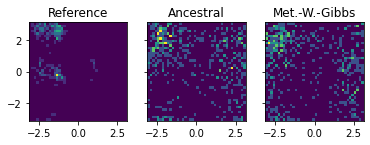

Epoch 958 Loss: -37561.89404296875


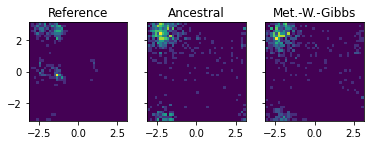

Epoch 959 Loss: -37992.3037109375


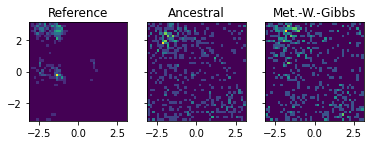

Epoch 960 Loss: -38337.853515625


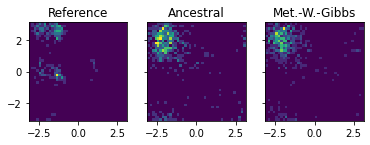

Epoch 961 Loss: -38531.68212890625


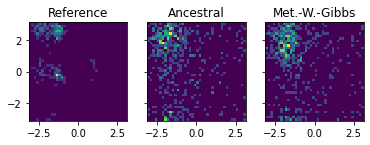

Epoch 962 Loss: -38134.300048828125


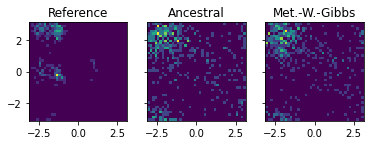

Epoch 963 Loss: -37986.6845703125


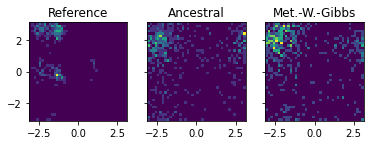

Epoch 964 Loss: -37362.583740234375


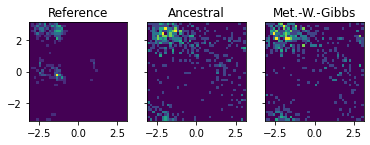

Epoch 965 Loss: -37864.5703125


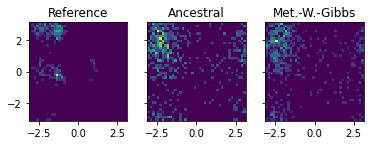

Epoch 966 Loss: -37921.52587890625


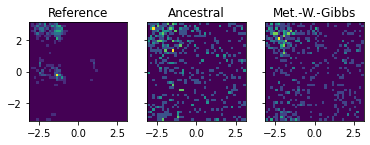

Epoch 967 Loss: -38050.964599609375


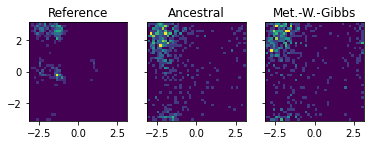

Epoch 968 Loss: -38323.0166015625


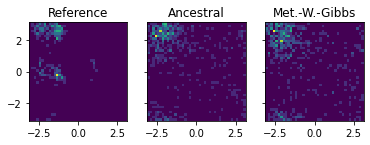

Epoch 969 Loss: -38347.00732421875


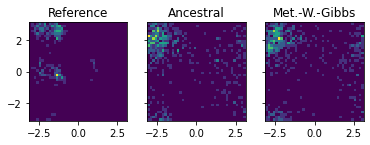

Epoch 970 Loss: -37764.1328125


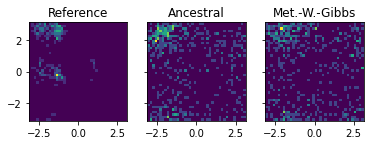

Epoch 971 Loss: -38285.919921875


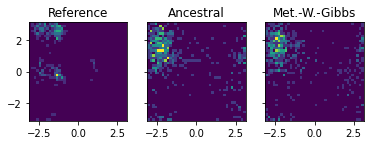

Epoch 972 Loss: -37945.446533203125


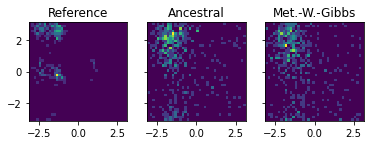

Epoch 973 Loss: -37985.986328125


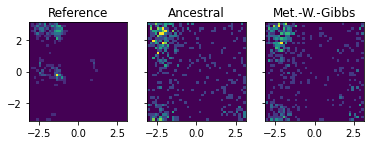

Epoch 974 Loss: -37868.683349609375


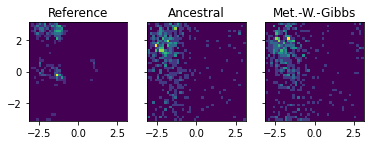

Epoch 975 Loss: -37828.684326171875


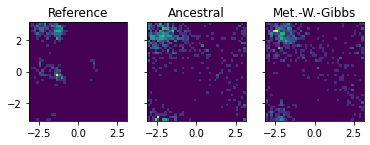

Epoch 976 Loss: -37938.05126953125


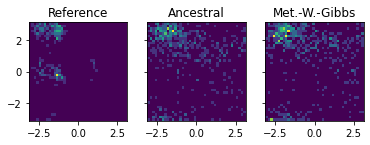

Epoch 977 Loss: -38040.85693359375


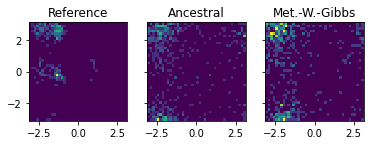

Epoch 978 Loss: -37834.055908203125


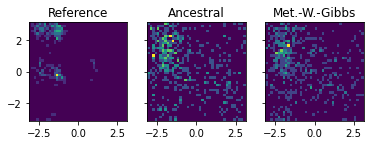

Epoch 979 Loss: -38119.34765625


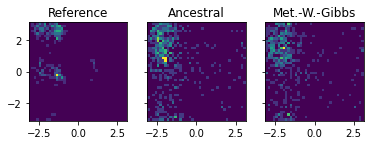

Epoch 980 Loss: -38131.160400390625


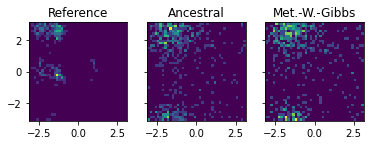

Epoch 981 Loss: -38179.4677734375


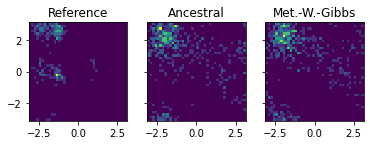

Epoch 982 Loss: -38273.2666015625


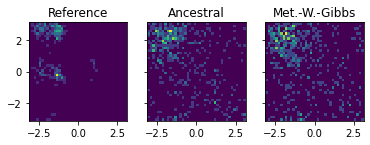

Epoch 983 Loss: -38263.9345703125


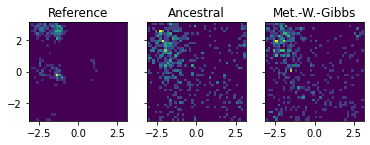

Epoch 984 Loss: -37549.355712890625


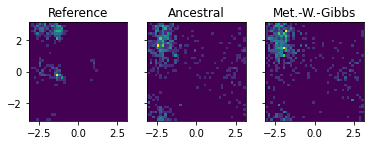

Epoch 985 Loss: -37761.24462890625


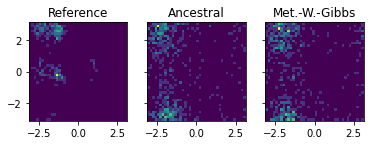

Epoch 986 Loss: -38379.990478515625


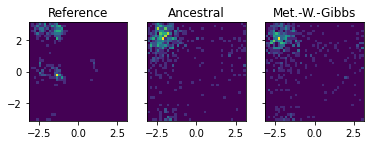

Epoch 987 Loss: -38409.49365234375


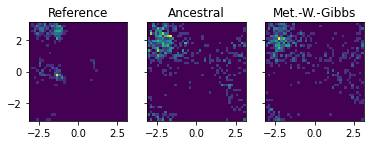

Epoch 988 Loss: -38479.9345703125


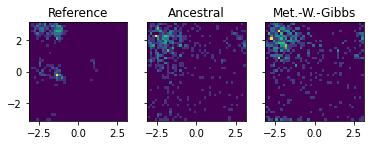

Epoch 989 Loss: -38244.2451171875


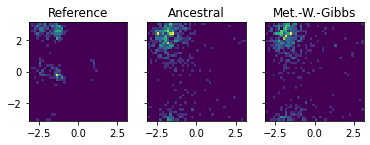

Epoch 990 Loss: -38046.0654296875


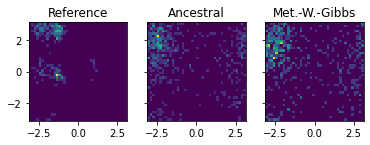

Epoch 991 Loss: -37959.229248046875


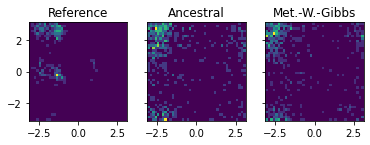

Epoch 992 Loss: -37896.230224609375


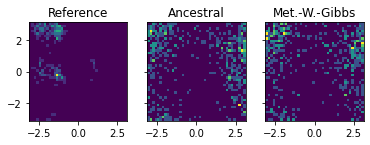

Epoch 993 Loss: -38401.3095703125


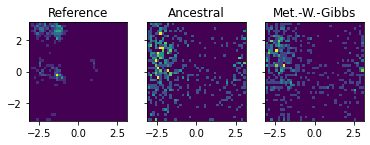

Epoch 994 Loss: -38191.6904296875


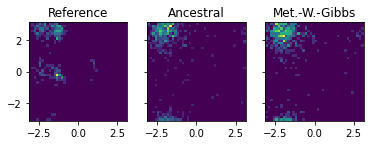

Epoch 995 Loss: -38288.88330078125


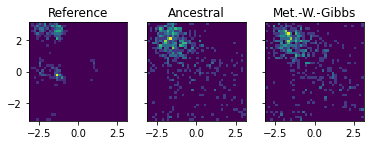

Epoch 996 Loss: -38383.270751953125


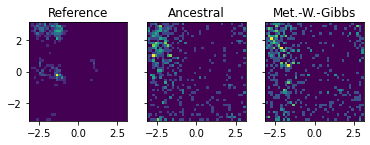

Epoch 997 Loss: -38334.80322265625


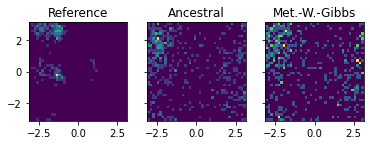

Epoch 998 Loss: -38480.146484375


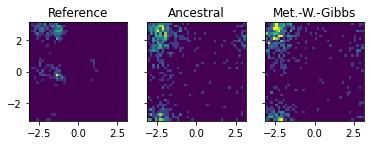

Epoch 999 Loss: -38640.6806640625


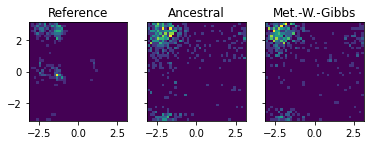

Epoch 1000 Loss: -38103.067626953125


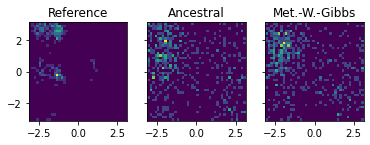

Epoch 1001 Loss: -37800.730712890625


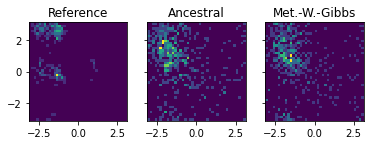

Epoch 1002 Loss: -38062.91796875


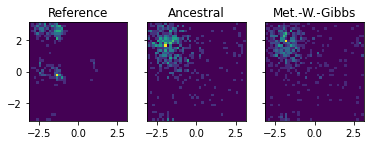

Epoch 1003 Loss: -38168.742919921875


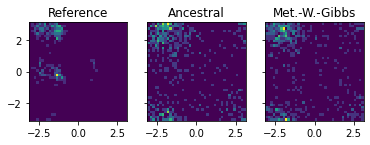

Epoch 1004 Loss: -37874.94775390625


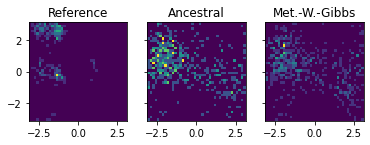

Epoch 1005 Loss: -37519.76416015625


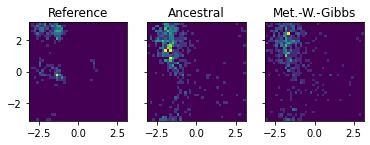

Epoch 1006 Loss: -37978.8916015625


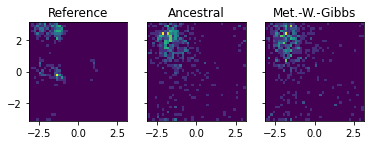

Epoch 1007 Loss: -37845.929443359375


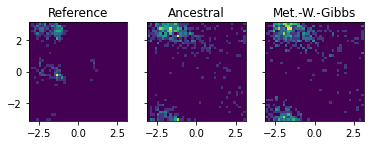

Epoch 1008 Loss: -37962.515625


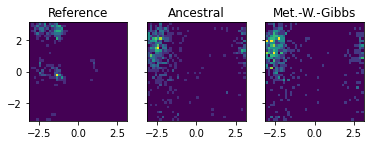

Epoch 1009 Loss: -38172.974853515625


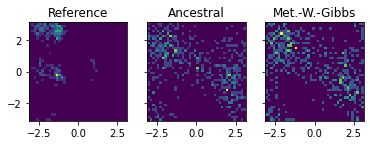

Epoch 1010 Loss: -38449.96142578125


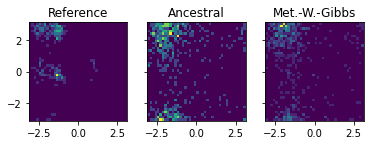

Epoch 1011 Loss: -38306.7099609375


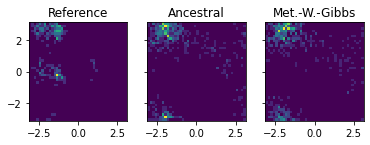

Epoch 1012 Loss: -38059.0537109375


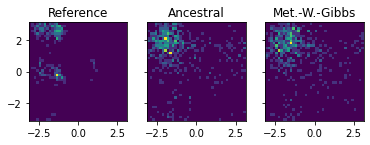

Epoch 1013 Loss: -37671.601806640625


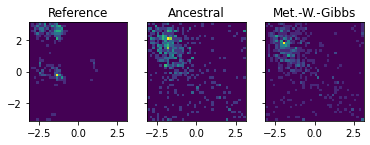

Epoch 1014 Loss: -38258.03515625


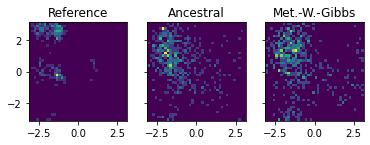

Epoch 1015 Loss: -38028.160400390625


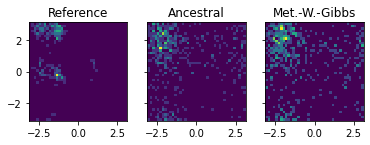

Epoch 1016 Loss: -38184.37255859375


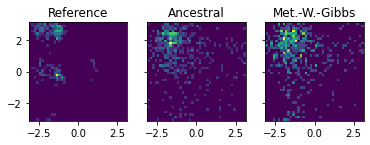

Epoch 1017 Loss: -37771.62109375


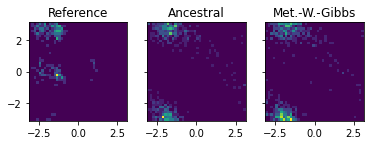

Epoch 1018 Loss: -38015.861328125


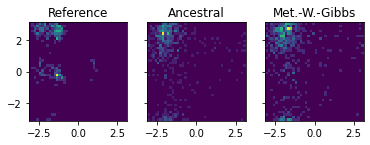

Epoch 1019 Loss: -38390.93701171875


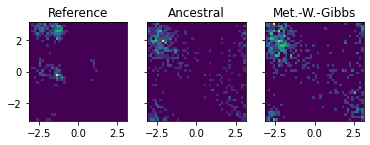

Epoch 1020 Loss: -37984.80029296875


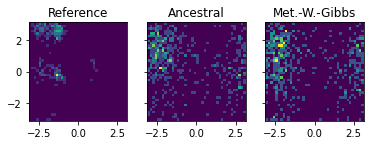

Epoch 1021 Loss: -38162.1015625


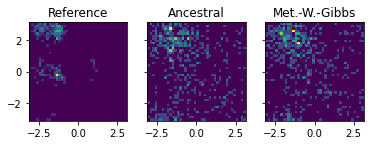

Epoch 1022 Loss: -38512.430419921875


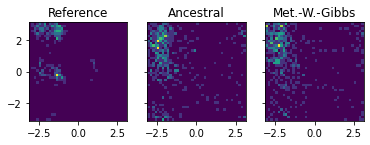

Epoch 1023 Loss: -37968.2548828125


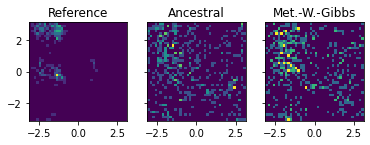

Epoch 1024 Loss: -37758.25390625


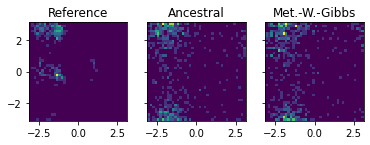

Epoch 1025 Loss: -38251.177490234375


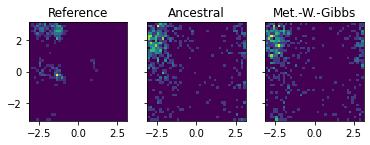

Epoch 1026 Loss: -37991.5693359375


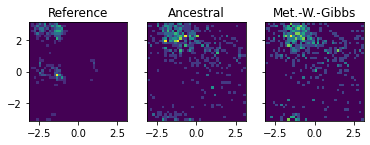

Epoch 1027 Loss: -38022.107421875


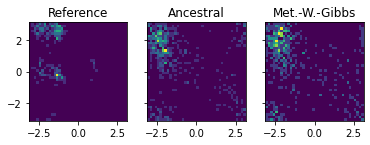

Epoch 1028 Loss: -38142.978515625


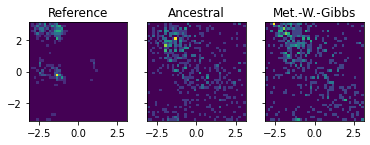

Epoch 1029 Loss: -38230.0615234375


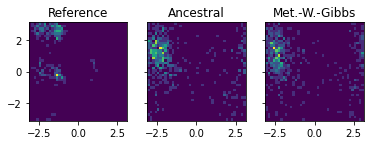

Epoch 1030 Loss: -37840.36376953125


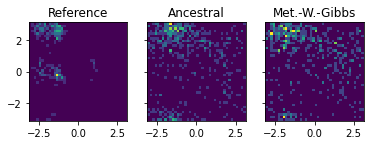

Epoch 1031 Loss: -38006.4326171875


In [ ]:
# training loop
os.chdir(fig_dir)
epochs, batch_size = 1175, 32
subset_size, train_prop  = 500, 0.5

train, test = train_test_split(data = G,subset_size = subset_size, train_prop = train_prop)
traj_xyz_ref = np.array([mol.pos.cpu().numpy() for mol in train])

for ep in range(epochs):
    ep_loss = 0
    
    # downsample training set
    random_idx = np.random.choice(len(train),len(train), replace = False)
    G_epoch = [train[i] for i in random_idx]
    loader = DataLoader(G_epoch,batch_size = batch_size)
    
    for G_batch in loader:
        G_batch.to(device)
        
        # forward pass
        recon_batch, mu_enc, logvar_enc = mod(G_batch)
        mu_dec = recon_batch[0]
        logvar_dec = recon_batch[1]
        
        # compute loss
        loss = VAEloss(mu_dec,logvar_dec,G_batch,mu_enc,logvar_enc,L=1)
        
        # back prop
        loss.backward()
        opt.step()
        opt.zero_grad()
        ep_loss += loss.item()
    
    if (ep+1) % 1 == 0:
        
        # ancestral sampling
        traj_xyz_ancestral = ancestral_sample(mod = mod , T = subset_size, device = device)
    
        print("Epoch " + str(ep + 1) + " Loss: " + str(ep_loss))
        z0 = torch.randn((1,2)).to(device)
        x0 = torch.tensor(train[0].pos)
        traj_xyz_mwg = np.zeros((subset_size,22,3))

        for t in range(subset_size):
            z0, x0 = mod.mwg_sample(z0, x0, atomic_numbers = z)
            traj_xyz_mwg[t,:,:] = x0.cpu().numpy()
            
        
        dihedrals_ref, dihedrals_ancestral, dihedrals_mwg = compare_dihedrals(traj_xyz_ref, traj_xyz_ancestral, traj_xyz_mwg ,topology = traj.topology)